<a href="https://colab.research.google.com/github/husseinfawaz20/QoT/blob/main/QoT_FS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Importing Libraries**

In [ ]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns, os
from sklearn.model_selection import train_test_split, GridSearchCV
import joblib
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error,make_scorer
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from statsmodels.api import OLS
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from numpy import mean
from numpy import absolute
from numpy import sqrt
import xgboost as xgb
from collections import OrderedDict
import time
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
!pip install catboost
!pip install shap

import shap
import shap.plots
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 8.0 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


#**Read Dataset +  Train/Test**

In [ ]:
df = pd.read_csv('DS_LPLevel_10100_Het_CFEGN_v3.csv')
target = 'Lightpath GSNR'
# df.head()
# df.describe()
# df.info()
# df.shape

In [ ]:
X = df.drop([target], axis=1)
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
num_data_points = df.shape[0]
num_features = X.shape[1]

In [ ]:
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

#**Util Functions**

##**Setters and Getters**

In [ ]:
def saveResults(y_test,y_pred,index,nb_features,tt,it,nb_splits):
  r2 = float(format((r2_score(y_test,y_pred)),'.3f'))
  rmse = float(format(np.sqrt(mean_squared_error(y_test, y_pred)),'.3f'))
  mae = float(format((mean_absolute_error(y_test , y_pred)),'.3f'))

  average_it,max_it,min_it = it;
  average_it=format(average_it,'.3f')
  max_it=format(max_it,'.3f')
  min_it=format(min_it,'.3f')

  dt = pd.DataFrame({'type': [index],'rmse': [rmse], 'mae': [mae], 'r2' : [r2],'nb_features':[nb_features],'training time (s)':[tt],'average inference time/data point (ms)':[average_it],'max inference time/data point (ms)':[max_it],'min inference time/data point (ms)':[min_it],'nb of splits':[nb_splits]})
  if os.path.isfile('results.csv'):
    dt.to_csv('results.csv',mode="a", header=False)
  else:
        dt.to_csv('results.csv')
  get_results()

In [ ]:
def addResults(rmse,mae,r2,index,nb_features,tt,it,nb_splits):
  if len(it) == 3:
      avg,max,min = it
      dt = pd.DataFrame({'type': [index],'rmse': [rmse], 'mae': [mae], 'r2' : [r2],'nb_features':[nb_features],'training time':[tt],'average inference time/data point':[avg],'max inference time/data point':[max],'min inference time/data point':[min],'nb splits':[nb_splits]})
  else:
    dt = pd.DataFrame({'type': [index],'rmse': [rmse], 'mae': [mae], 'r2' : [r2],'nb_features':[nb_features],'training time':[tt],'average inference time/data point':[it],'max inference time/data point':['-'],'min inference time/data point':['-'],'nb splits':[nb_splits]})
  if os.path.isfile('results.csv'):
    dt.to_csv('results.csv',mode="a", header=False)
  else:
        dt.to_csv('results.csv')

In [ ]:
def get_results(file='results.csv'):
  data = pd.read_csv(file)
  return data.iloc[:,-10:]

In [ ]:
def print_results(file='results.xlsx'):
  data = pd.read_excel(file)
  return data.iloc[:,-11:]

In [ ]:
def get_features():
  data = pd.read_csv('selected_features.csv')
  return data.iloc[:,-3:]

In [ ]:
import csv

def save_features(feature_selection_types,selected_features):
  file_exists = os.path.exists('selected_features.csv')
  with open('selected_features.csv', mode='a', newline='') as file:
      writer = csv.writer(file)
      if not file_exists:
          writer.writerow(['Feature_Selection_Method','Nb_Features', 'Selected_Features'])
      for idx, selected_feature_list in enumerate([selected_features]):
          method_name = feature_selection_types
          nb_features = len(selected_features)
          selected_features_str = ', '.join(selected_feature_list)
          writer.writerow([method_name, nb_features,selected_features_str])

In [ ]:
def get_tuned_params():
  data = pd.read_csv('tuned_params.csv')
  return data.iloc[:,-3:]

In [ ]:
import csv

def save_tuning_params(feature_selection_types,tuned_params):
  file_exists = os.path.exists('tuned_params.csv')
  with open('tuned_params.csv', mode='a', newline='') as file:
      writer = csv.writer(file)
      if not file_exists:
          writer.writerow(['Feature_Selection_Method','Nb_Params', 'Selected_Params'])
      for idx, selected_feature_list in enumerate([tuned_params]):
          method_name = feature_selection_types
          nb_params = len(tuned_params)
          writer.writerow([method_name, nb_params,tuned_params])

In [ ]:
def calc_inference_time(model,data_points=X.to_numpy(),flag='fit'): #flag=0 means already performed .fit so gives avg,max,min else gives avg only
  if flag=='no_fit' :
    model.fit(X_train,y_train)

  inference_times = []
  for data_point in data_points:
          start_time = time.time()
          prediction = model.predict(data_point.reshape(1, -1))
          end_time = time.time()
          inference_time = (end_time - start_time) * 1000   # Convert to milliseconds
          inference_times.append(inference_time)

  average_inference_time = np.mean(inference_times)
  max_inference_time = np.max(inference_times)
  min_inference_time = np.min(inference_times)
  return average_inference_time,max_inference_time, min_inference_time

In [ ]:
def features_summary (model) :
    model_features = pd.read_csv("selected_features.csv")

    selected_features_list = [set(feature.strip() for feature in features.split(",")) for features in model_features["Selected_Features"]]

    features_dict = {}
    for idx, features in enumerate(selected_features_list):
        for feature in features:
            if feature not in features_dict:
                features_dict[feature] = [0] * len(model_features)
            features_dict[feature][idx] = 1

    selected_features_df = pd.DataFrame(features_dict)

    selected_features_df.insert(0, "Method", model_features["Feature_Selection_Method"])

    plt.figure(figsize=(10,6))
    sns.heatmap(selected_features_df.set_index("Method"), cmap="Blues", cbar=False, xticklabels="auto", yticklabels="auto")
    plt.ylabel("Methods")
    plt.yticks(rotation=0)
    plt.xlabel("Selected Features")
    plt.title(f"Selected Features of {model} after Feature Selection")
    plt.tight_layout()
    plt.savefig("selected_features_heatmap.png")
    plt.show()


##**Train Feature Selection Features + Hypertuning**

In [ ]:
def train_selected_features(selected_features,fs,model='xgb'):
  X_train_selected = X_train[selected_features]
  params={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,
       'reg_alpha':0.5,'reg_lambda':0.5,'gamma':0.2 }
  if model=='lgb':
      model_selected = LGBMRegressor()
  elif model == 'xgb':
    model_selected = XGBRegressor(**params)
  nb_features = len(selected_features)
  save_features(fs,selected_features)

  start_time = time.time()
  model_selected.fit(X_train_selected, y_train)
  end_time = time.time()

  training_time = end_time - start_time
  inference_time_per_data_point = calc_inference_time(model_selected,data_points=X[selected_features].to_numpy())

  X_test_selected = X_test[selected_features]
  y_pred =  model_selected.predict(X_test_selected)
  if model=='lgb':
        nb_splits = calculate_lgb_splits(model)
  elif model == 'xgb':
        nb_splits = calculate_xgb_splits(model)

  saveResults(y_test,y_pred,f'Feature Selection method: {fs}',nb_features,training_time,inference_time_per_data_point,nb_splits)
  return get_results()

In [ ]:
def train_selected_features_with_hypertuning(selected_features,fs,model='xgb'):
  if model=='lgb':
    return train_lgb_hypertune(selected_features,fs)
  elif model == 'xgb':
    return train_xgb_hypertune(selected_features,fs)
  elif model == 'cbr':
    return train_cb_hypertune(selected_features,fs)

In [ ]:
def train_xgb_hypertune (selected_features,fs_type) :
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]
    save_features(fs_type,selected_features)
    nb_features = len(selected_features)

    xgb = XGBRegressor()
    cv = KFold(n_splits=5, random_state=42, shuffle=True)

    params = {
                  'objective':['reg:squarederror'],
                  'learning_rate': [0.1], #0.1
                  'max_depth': [3,6],#3
                  'min_child_weight': [1,3],#1
                  'subsample': [0.8], #0.8
                  'n_estimators': [300,500], #500
                  'reg_alpha': [0.1],
                  'reg_lambda': [0.1],
                  'gamma': [  0.2],
    }

    grid_search = GridSearchCV(xgb, params, cv=cv,scoring = 'r2')
    grid_search.fit(X_train_selected, y_train)
    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")
    save_tuning_params(fs_type,best_params)
    best_reg = grid_search.best_estimator_

    best_xgb_model = XGBRegressor(**best_params)

    start_time = time.time()
    best_xgb_model.fit(X_train_selected, y_train)
    end_time = time.time()

    training_time = end_time - start_time
    inference_time_per_data_point = calc_inference_time(best_xgb_model,data_points=X[selected_features].to_numpy())

    y_pred = best_xgb_model.predict(X_test_selected)
    nb_splits = calculate_xgb_splits(best_xgb_model)
    joblib.dump(best_xgb_model, 'xgb_fs_model.pkl')
    saveResults(y_test,y_pred,fs_type,nb_features,training_time,inference_time_per_data_point,nb_splits)
    return get_results()

In [ ]:
def train_lgb_hypertune (selected_features,fs_type) :
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]
    save_features(fs_type,selected_features)
    nb_features = len(selected_features)

    lgb = LGBMRegressor()
    cv = KFold(n_splits=5, random_state=42, shuffle=True)

    params = {
        'learning_rate': [ 0.1], #0.1
        'n_estimators': [300,500], #500
        'max_depth': [3,6,8], #3
        'num_leaves':[6,8,15,32],#8
        'min_child_samples': [5,10,15],#5
        'lambda_l1':[0.2], 'lambda_l2':[0.1]
    }

    grid_search = GridSearchCV(lgb, params, cv=cv,scoring = 'r2')
    grid_search.fit(X_train_selected, y_train,eval_set=[(X_test_selected, y_test)])
    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")
    save_tuning_params(fs_type,best_params)

    best_lgb_model = LGBMRegressor(**best_params,early_stopping_rounds=10)

    start_time = time.time()
    best_lgb_model.fit(X_train_selected, y_train,eval_set=[(X_test_selected, y_test)])
    end_time = time.time()

    training_time = end_time - start_time
    inference_time_per_data_point = calc_inference_time(best_lgb_model,data_points=X[selected_features].to_numpy())

    best_reg = grid_search.best_estimator_

    y_pred = best_lgb_model.predict(X_test_selected)
    nb_splits = calculate_lgb_splits(best_lgb_model)
    joblib.dump(best_lgb_model, 'lgb_fs_model.pkl')
    saveResults(y_test,y_pred,fs_type,nb_features,training_time,inference_time_per_data_point,nb_splits)
    return get_results()

In [ ]:
def train_cb_hypertune (selected_features,fs_type) :
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]
    save_features(fs_type,selected_features)
    nb_features = len(selected_features)

    params = {
        'iterations': [1000], #1000
        'learning_rate': [0.05,0.1], #0.03
        'depth': [3,6,8], #6
        'l2_leaf_reg': [0.5], #0.5
    }
    cv = KFold(n_splits=5, random_state=42, shuffle=True)
    cbr = CatBoostRegressor()
    grid_search = GridSearchCV(estimator=cbr, param_grid=params, scoring='neg_mean_squared_error', cv=cv)


    grid_search = GridSearchCV(cbr, params, cv=cv,scoring = 'r2')
    grid_search.fit(X_train_selected, y_train,early_stopping_rounds=10)
    best_params = grid_search.best_params_
    print(f"Best parameters: {best_params}")
    save_tuning_params(fs_type,best_params)

    best_cb_model = CatBoostRegressor(**best_params)

    start_time = time.time()
    best_cb_model.fit(X_train_selected, y_train)
    end_time = time.time()

    training_time = end_time - start_time
    inference_time_per_data_point = calc_inference_time(best_cb_model,data_points=X[selected_features].to_numpy())

    y_pred = best_cb_model.predict(X_test_selected)
    nb_splits = calculate_cb_splits(best_cb_model)
    joblib.dump(best_cb_model, 'cb_fs_model.pkl')

    saveResults(y_test,y_pred,fs_type,nb_features,training_time,inference_time_per_data_point,nb_splits)
    return get_results()

In [ ]:
def train_prepared_model (selected_features,params,fs_type,fs_message) :
    X_train_selected = X_train[selected_features]
    X_test_selected = X_test[selected_features]
    nb_features = len(selected_features)

    if fs_type == 'cbr':
      model = CatBoostRegressor(**params,early_stopping_rounds=10)
    if fs_type == 'xgb':
      model = XGBRegressor(**params,early_stopping_rounds=10)
    if fs_type == 'lgb':
      model = LGBMRegressor(**params,early_stopping_rounds=10)

    start_time = time.time()
    if fs_type == 'xgb':
       model.fit(X_train_selected, y_train, eval_set=[(X_test_selected, y_test)],verbose=False)
    else :
       model.fit(X_train_selected, y_train, eval_set=[(X_test_selected, y_test)])
    end_time = time.time()

    training_time = end_time - start_time
    inference_time_per_data_point = calc_inference_time(model,data_points=X[selected_features].to_numpy())

    y_pred = model.predict(X_test_selected)

    if fs_type == 'cbr':
      nb_splits = calculate_cb_splits(model)
    if fs_type == 'xgb':
      nb_splits = calculate_xgb_splits(model)
    if fs_type == 'lgb':
      nb_splits = calculate_lgb_splits(model)

    saveResults(y_test,y_pred,fs_message,nb_features,training_time,inference_time_per_data_point,nb_splits)
    return get_results()

##**Complexity and Number of splits**

In [ ]:
def calculate_xgb_splits (xgb) :
    booster = xgb.get_booster()
    trees_strings = booster.get_dump(dump_format='text')
    total_splits = 0
    for tree_string in trees_strings:
      n_nodes = len(tree_string.split('\n')) - 1
      n_leaves = tree_string.count('leaf')
      total_splits += n_nodes - n_leaves
    print('total_splits:',total_splits)
    return total_splits

In [ ]:
def calculate_lgb_splits (lgb) :
    booster = lgb.booster_
    trees_strings = booster.dump_model()

    total_splits = 0
    for tree_string in trees_strings['tree_info']:
        n_nodes = tree_string['num_leaves'] - 1
        total_splits += n_nodes

    print("Total number of splits:", total_splits)
    return total_splits

In [ ]:
from catboost import CatBoostRegressor

def calculate_cb_splits(catboost_model):
    # total_splits = (2**catboost_model.get_all_params()['depth']-1) * catboost_model.get_all_params()['iterations']

    # Get the number of trees in the model
    num_trees =  catboost_model.get_params()['iterations']
    total_splits = 0

    # Iterate through each tree
    for tree_idx in range(num_trees):
        # Get the leaf indexes for this tree
        # if tree_idx < 768 :
        if tree_idx < 692 :
          leaf_indexes = catboost_model.calc_leaf_indexes(X,ntree_start=tree_idx, ntree_end=tree_idx+1 )

        # Calculate the number of unique leaf nodes
        num_leaves = len(set(leaf_indexes.ravel()))

        # Calculate the total number of splits in this tree
        num_splits = num_leaves - 1
        total_splits += num_splits

    print('total_splits:', total_splits)
    return total_splits

In [ ]:
def calculate_splits (regressor) : #rf - gb
    estimators = regressor.estimators_

    total_splits = 0
    # for estimator in estimators[0]:
    #     n_nodes = estimator.tree_.node_count
    #     n_leaves = estimator.tree_.n_leaves
    #     total_splits += n_nodes - n_leaves
    for stage_estimators in estimators:
        for estimator in stage_estimators:
            total_splits += estimator.tree_.node_count - estimator.tree_.n_leaves

    print("Total number of splits:", total_splits)
    return total_splits

In [ ]:
def calculate_dt_splits (dt_regressor) :
    estimator = dt_regressor.tree_
    total_splits = estimator.node_count - estimator.n_leaves
    print("Total number of splits for Decision Tree Regressor:", total_splits)
    return total_splits

In [ ]:
def calculate_hgb_splits (hgb) :
    n_iter = hgb.n_iter_
    # Estimate total number of splits based on boosting iterations
    nb_splits = n_iter * hgb.max_depth
    print("Total number of splits for Decision Tree Regressor:", nb_splits)
    return nb_splits

#**Data Visualization**

<Axes: >

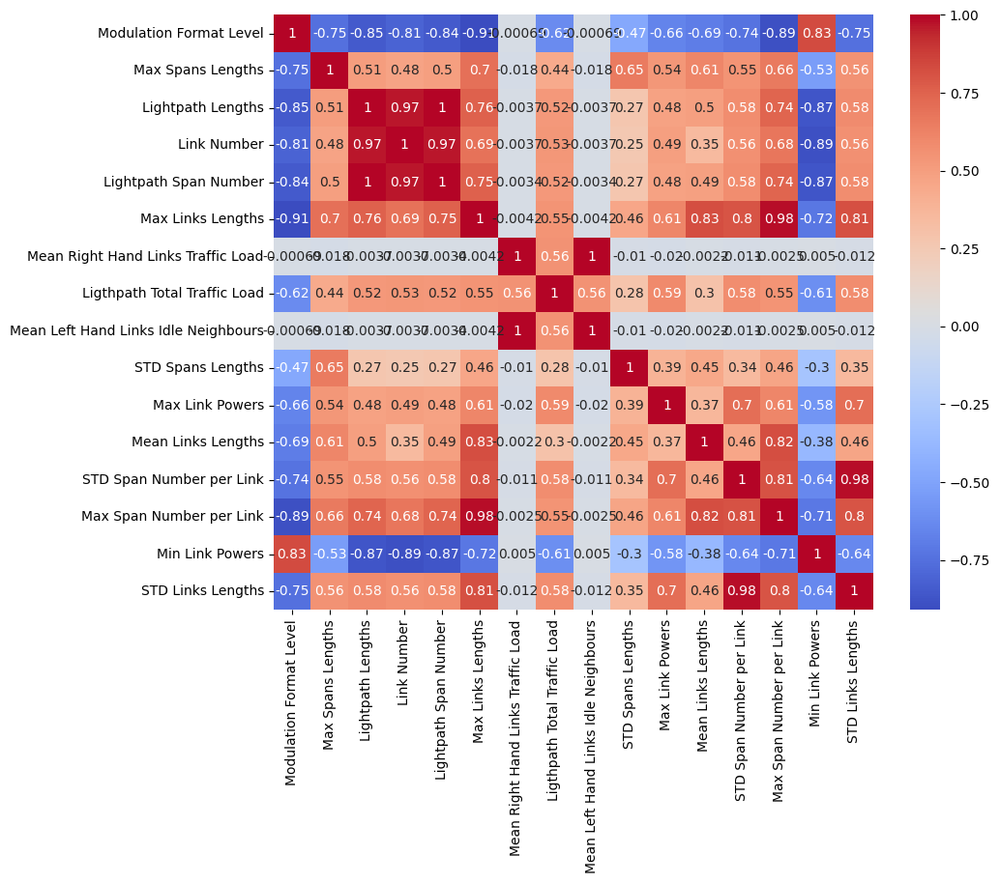

In [ ]:
f=df[['Modulation Format Level', 'Lightpath Lengths','Ligthpath Total Traffic Load','Lightpath Span Number',
      'Max Spans Lengths','STD Spans Lengths','STD Span Number per Link','Max Span Number per Link',
       'Max Links Lengths','STD Links Lengths','Mean Links Lengths',
      'Link Number','Max Link Powers', 'Min Link Powers',

      ]]
f1, ax = plt.subplots(figsize=(10, 8))
corr = f.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')


Text(0.5, 1.0, 'Histogram of Lightpath Lengths')

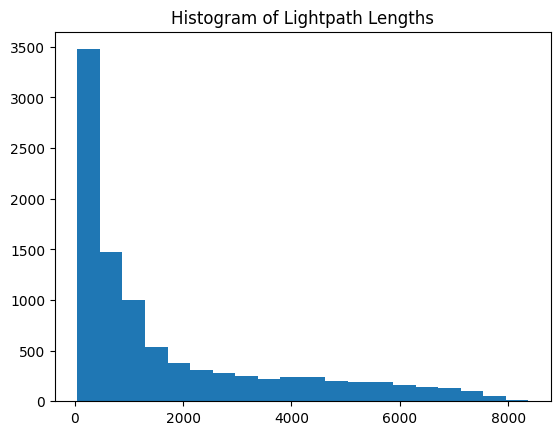

In [ ]:
f1=df[['Modulation Format Level', 'Lightpath Lengths','Ligthpath Total Traffic Load','Lightpath Span Number']]
f2=df[['Max Spans Lengths','STD Spans Lengths','STD Span Number per Link','Max Span Number per Link']]
f3=df[['Max Links Lengths','Mean Links Lengths','Min Links Lengths','STD Links Lengths']]
f4=df[['Link Number','Max Link Powers', 'Min Link Powers','Max Links Traffic Load',]]



# f4.hist(figsize = (7,7))
# f2.hist(figsize = (7,7))

target = 'Lightpath GSNR'
feature= 'Lightpath Lengths'
# feature= 'Modulation Format Level'

# plt.xlabel(feature)
# plt.ylabel(target)

#Scatter Plot:
# plt.scatter(df[feature], df[target])
# plt.title(f'Scatter Plot of {feature} and {target}')

# # Pairwise Scatter Plot:
# sns.pairplot(df[['Modulation Format Level',	'Lightpath Lengths' ,target]])
# plt.title(f'Pariwise Plot of {feature} and {target}')

# Regression Line Plot:
# sns.regplot(data=df, x=feature, y=target)
# plt.title(f'Regression Line Plot of {feature} and {target}')

# #Histograms and Density Plots:
# plt.hist(df[feature], bins=20)
# plt.title(f'Histogram of {feature}')


In [ ]:
correlation_matrix = X.corrwith(y)

# Sort the features based on their absolute correlation values
sorted_features = correlation_matrix.abs().sort_values(ascending=False)

# Print the top correlated features and their correlation values
print(sorted_features.head(10))

Modulation Format Level     0.963502
Max Links Lengths           0.916959
Max Span Number per Link    0.899671
Lightpath Lengths           0.835398
Max Spans Lengths           0.833392
Lightpath Span Number       0.831201
Min Link Powers             0.816710
Link Number                 0.796725
STD Links Lengths           0.738621
STD Span Number per Link    0.731092
dtype: float64


# **Regression Models**

##**XGB**

###**XGB Regressor**

**My results**

In [ ]:
params={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,
       'reg_alpha':0.5,'reg_lambda':0.5,'gamma':0.2}
xgb = XGBRegressor(**params)

start_time = time.time()
xgb.fit(X_train, y_train,early_stopping_rounds=10,eval_set=[(X_train, y_train), (X_test, y_test)],verbose=False)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(xgb)

y_pred_xgb = xgb.predict(X_test)
nb_splits = calculate_xgb_splits(xgb)


joblib.dump(xgb, 'xgb_model.pkl')

saveResults(y_test,y_pred_xgb,"XGB",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

total_splits: 1874


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.210,0.998,47,5.065176,2.479,80.801,0.471,5359
1,LGB Regressor with tuning,0.282,0.207,0.998,47,3.024095,3.004,58.139,0.662,3315
2,CAT Boost Regressor,0.276,0.203,0.998,47,21.542594,1.517,48.800,0.458,32860
3,LGB Regressor with tuning,0.282,0.207,0.998,47,1.730443,1.075,22.233,0.515,3424
4,XGB,0.738,0.501,0.986,2,0.746403,0.865,46.508,0.451,1874


**XGB Regressor**

In [ ]:
xgb = XGBRegressor()

start_time = time.time()
xgb.fit(X_train, y_train,early_stopping_rounds=10,eval_set=[(X_test, y_test)])
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(xgb)

y_pred = xgb.predict(X_test)
nb_splits = calculate_xgb_splits(xgb)

saveResults(y_test,y_pred,"XGB Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

**XGB with tuned parameters to get Farhad's Results**


In [ ]:
xgb = XGBRegressor(learning_rate=0.1, subsample=0.3, n_estimators=500)

start_time = time.time()
xgb.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(xgb)

y_pred = xgb.predict(X_test)
nb_splits = calculate_xgb_splits(xgb)
saveResults(y_test,y_pred,"Farhad Results",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

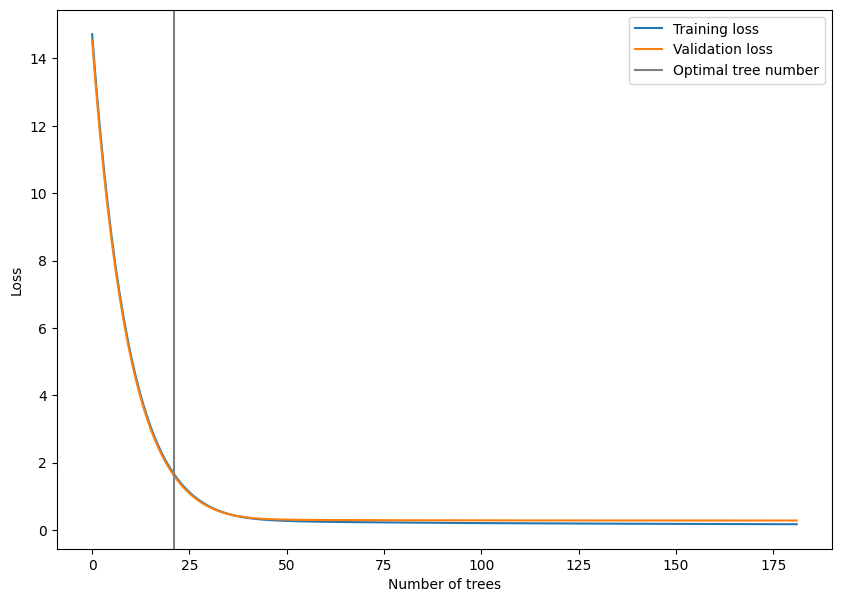

In [ ]:
results = xgb.evals_result()

plt.figure(figsize=(10,7))
plt.plot(results["validation_0"]["rmse"], label="Training loss")
plt.plot(results["validation_1"]["rmse"], label="Validation loss")
plt.axvline(21, color="gray", label="Optimal tree number")
plt.xlabel("Number of trees")
plt.ylabel("Loss")
plt.legend()

####**TESTING OVERFITTING**

[0]	validation_0-rmse:14.53834
[1]	validation_0-rmse:13.08703


/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:835: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



[2]	validation_0-rmse:11.77757
[3]	validation_0-rmse:10.60249
[4]	validation_0-rmse:9.54567
[5]	validation_0-rmse:8.59171
[6]	validation_0-rmse:7.73581
[7]	validation_0-rmse:6.96256
[8]	validation_0-rmse:6.26866
[9]	validation_0-rmse:5.64270
[10]	validation_0-rmse:5.07957
[11]	validation_0-rmse:4.57282
[12]	validation_0-rmse:4.11700
[13]	validation_0-rmse:3.70821
[14]	validation_0-rmse:3.34007
[15]	validation_0-rmse:3.00884
[16]	validation_0-rmse:2.71035
[17]	validation_0-rmse:2.44293
[18]	validation_0-rmse:2.20285
[19]	validation_0-rmse:1.98682
[20]	validation_0-rmse:1.79307
[21]	validation_0-rmse:1.61903
[22]	validation_0-rmse:1.46296
[23]	validation_0-rmse:1.32422
[24]	validation_0-rmse:1.19988
[25]	validation_0-rmse:1.08823
[26]	validation_0-rmse:0.98820
[27]	validation_0-rmse:0.89876
[28]	validation_0-rmse:0.82029
[29]	validation_0-rmse:0.74980
[30]	validation_0-rmse:0.68760
[31]	validation_0-rmse:0.63247
[32]	validation_0-rmse:0.58449
[33]	validation_0-rmse:0.54296
[34]	validatio

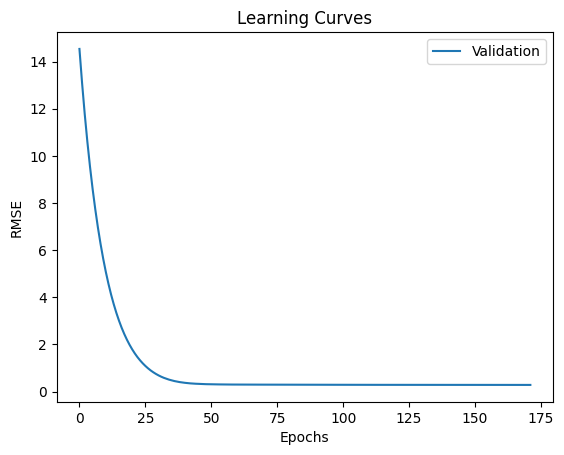

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



Mean Squared Error with Early Stopping: 0.283185303025542


In [ ]:
params={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,
       'reg_alpha':0.5,'reg_lambda':0.5,'gamma':0.2 }
xgb_regressor = XGBRegressor(**params)
xgb_regressor.fit(X_train, y_train,early_stopping_rounds=10,eval_set=[(X_test, y_test)],eval_metric='rmse')

# Evaluate on training data
y_train_pred = xgb_regressor.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
print("Mean Squared Error on Training Data:", np.sqrt(mse_train))

# Evaluate on validation data
y_val_pred = xgb_regressor.predict(X_test)
mse_val = mean_squared_error(y_test, y_val_pred)
print("Mean Squared Error on Validation Data:", np.sqrt(mse_val))

# Plot learning curves (optional)
import matplotlib.pyplot as plt

plt.plot(xgb_regressor.evals_result()['validation_0']['rmse'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.title('Learning Curves')
plt.legend()
plt.show()

# Use early stopping to prevent overfitting
xgb_regressor_early = XGBRegressor(**params)
xgb_regressor_early.fit(X_train, y_train, early_stopping_rounds=10, eval_set=[(X_test, y_test)], verbose=False)

# Evaluate with early stopping
y_val_pred_early = xgb_regressor_early.predict(X_test)
mse_val_early = mean_squared_error(y_test, y_val_pred_early)
print("Mean Squared Error with Early Stopping:", np.sqrt(mse_val_early))

###**GridSearch for hypertuning with CV=5**

In [ ]:
xgb = XGBRegressor()
cv = KFold(n_splits=5, random_state=42, shuffle=True)

#LPLevel Dataset Params
params = {
              'objective':['reg:squarederror'],
              'learning_rate': [0.01,0.1], #0.1
              'max_depth': [3,6,8,12],#6
              'min_child_weight': [1,3],#3
              'subsample': [0.3,0.8], #0.8
              'n_estimators': [100,200,300,500], #500
              'reg_alpha': [0, 0.1, 0.5],#0.5
              'reg_lambda': [0, 0.1, 0.5],#0.5
              'gamma': [0, 0.1, 0.2],#0.2
           }

grid_search = GridSearchCV(xgb, params, cv=cv,scoring = 'r2')

start_time = time.time()
grid_search.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(grid_search)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")

best_reg = grid_search.best_estimator_

y_pred = best_reg.predict(X_test)
saveResults(y_test,y_pred,"XGB with GridSearch CV=5 + Tuning",X.shape[1],training_time,inference_time_per_data_point)
get_results()

###**XGB with CV=5**

In [ ]:
cv = KFold(n_splits=5, random_state=42, shuffle=True)
params=params={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,
       'reg_alpha':0.5,'reg_lambda':0.5,'gamma':0.2}
xgb_cv = XGBRegressor(**params)

start_time = time.time()
scores = cross_validate(xgb_cv, X_train, y_train, cv=cv,scoring=('r2', 'neg_mean_squared_error','neg_mean_absolute_error'))
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(xgb_cv,flag='no_fit')

rmse = sqrt(mean(absolute(scores['test_neg_mean_squared_error'])))
mae= mean(absolute(scores['test_neg_mean_absolute_error']))
r2= mean(absolute(scores['test_r2']))

addResults(rmse,mae,r2,"XGB with CV=5 ",X.shape[1],training_time,inference_time_per_data_point,'')
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB with tuning,0.283000,0.210000,0.998000,47,7.24845,3.802000,81.555000,0.477000,5359.0
1,XGB with CV=5,0.292175,0.211305,0.997829,47,83.46585,0.827303,51.150799,0.524044,NaN


In [ ]:
import xgboost as xgb
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

params ={'learning_rate': 0.03, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror',
         'subsample': 0.8, 'reg_alpha': 0.5,'reg_lambda': 0.5,'gamma': 0.2,}


xgb_cv = xgb.XGBRegressor(**params, dtrain=data_dmatrix,
                    num_boost_round=50, early_stopping_rounds=10, metrics="rmse", as_pandas=True, seed=123)

start_time = time.time()
xgb_cv.fit(X_train, y_train,eval_set=[(X_test, y_test)])
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(xgb_cv)

y_pred = xgb_cv.predict(X_test)
saveResults(y_test,y_pred,"XGB after tuning",X.shape[1],training_time,inference_time_per_data_point)
get_results()

###**XGB** tuning the params not using GridSearch

In [ ]:
import xgboost as xgb

grid = pd.DataFrame({'eta':[0.01,0.05,0.1],
                    'subsample':([0.3,0.5,0.8]),'max_depth':[3,6,8], 'min_child_weight': [1,2,3],
                     'n_estimators': [100,200,300], 'reg_alpha': [0, 0.1, 0.5],
                     'reg_lambda': [0, 0.1, 0.5],  'gamma': [0, 0.1, 0.2],
})

def fit(x):
    params = {'objective':'reg:squarederror',
              'eval_metric':'mae',
              'eta':x[0],
              'subsample':x[1],
               'max_depth':int(x[2]),
              'min_child_weight':x[3],
               'n_estimators':x[4],
              'reg_alpha':x[5],
               'reg_lambda':x[6],
              'gamma':x[7]
                }
    xgb_cv = xgb.cv(dtrain=data_dmatrix, params=params,
    nfold=5,
    num_boost_round=100, early_stopping_rounds=10, metrics="rmse", as_pandas=True, seed=42)

    return xgb_cv[-1:].values[0]

grid[['train-rmse-mean','train-rmse-std',
'test-rmse-mean','test-rmse-std']] = grid.apply(fit,axis=1,result_type='expand')
grid


##**GB**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor()

start_time = time.time()
gb.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(gb)

y_pred = gb.predict(X_test)
nb_splits = calculate_splits(gb)
saveResults(y_test,y_pred,"GB Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor(learning_rate=0.1, subsample=0.8, max_depth=3,n_estimators=500)

start_time = time.time()
gb.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(gb)

y_pred_gb = gb.predict(X_test)
nb_splits = calculate_splits(gb)
joblib.dump(gb, 'gb_model.pkl')

saveResults(y_test,y_pred_gb,"GB Regressor with tuning",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

Total number of splits: 3480


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.21,0.998,47,4.982812,3.942,65.330,0.478,5359
1,GB Regressor with tuning,0.283,0.21,0.998,47,40.479394,0.857,30.443,0.202,3480


In [ ]:
cv = KFold(n_splits=5, random_state=42, shuffle=True)
param_grid = {
    'learning_rate': [0.01, 0.1], #0.1
    'n_estimators': [100,300,500], #500
    'max_depth': [3,6,8], #3
    'subsample' : [0.3,0.6,0.8] #0.8
}
gb = GradientBoostingRegressor()
grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=cv)

start_time = time.time()
grid_search.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(grid_search)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
best_reg = grid_search.best_estimator_
y_pred = best_reg.predict(X_test)
# nb_splits = calculate_splits(grid_search)

saveResults(y_test,y_pred,"GB Regressor with GS",X.shape[1],training_time,inference_time_per_data_point,'nb_splits')
get_results()

##**HGB**

In [ ]:
hgb = HistGradientBoostingRegressor(early_stopping=10)
start_time = time.time()
hgb.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(hgb)

y_pred = hgb.predict(X_test)
nb_splits = calculate_splits(hgb)
saveResults(y_test,y_pred,"HGB Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

In [ ]:
params = {'learning_rate': 0.1, 'max_depth': 3, 'max_iter': 500}

hgb = HistGradientBoostingRegressor(**params,loss="squared_error", verbose=2, early_stopping=True)

start_time = time.time()
hgb.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(hgb)

y_pred_hgb = hgb.predict(X_test)

nb_splits = calculate_hgb_splits(hgb)
joblib.dump(hgb, 'hgb_model.pkl')

saveResults(y_test,y_pred_hgb,"HGB with tuning",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

Binning 0.003 GB of training data: 0.932 s
Binning 0.000 GB of validation data: 0.244 s
Fitting gradient boosted rounds:
[1/500] 1 tree, 8 leaves, max depth = 3, train loss: 16.07799, val loss: 16.26224, in 0.024s
[2/500] 1 tree, 8 leaves, max depth = 3, train loss: 13.16388, val loss: 13.29412, in 0.013s
[3/500] 1 tree, 8 leaves, max depth = 3, train loss: 10.78765, val loss: 10.90458, in 0.012s
[4/500] 1 tree, 8 leaves, max depth = 3, train loss: 8.84063, val loss: 8.89878, in 0.006s
[5/500] 1 tree, 8 leaves, max depth = 3, train loss: 7.25985, val loss: 7.30354, in 0.006s
[6/500] 1 tree, 8 leaves, max depth = 3, train loss: 5.96614, val loss: 6.00411, in 0.013s
[7/500] 1 tree, 8 leaves, max depth = 3, train loss: 4.90840, val loss: 4.92775, in 0.006s
[8/500] 1 tree, 8 leaves, max depth = 3, train loss: 4.04364, val loss: 4.05745, in 0.007s
[9/500] 1 tree, 8 leaves, max depth = 3, train loss: 3.33658, val loss: 3.33979, in 0.006s
[10/500] 1 tree, 8 leaves, max depth = 3, train loss: 

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.210,0.998,47,4.982812,3.942,65.330,0.478,5359
1,GB Regressor with tuning,0.283,0.210,0.998,47,40.479394,0.857,30.443,0.202,3480
2,HGB with tuning,0.291,0.215,0.998,47,8.129588,7.576,1413.313,4.315,1197


##**LGB**

In [ ]:
from lightgbm import LGBMRegressor

params={'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_samples': 5,
        'n_estimators': 500, 'num_leaves': 8,"verbosity" : -1}
# 2^max_depth > num_leaves

lgb =LGBMRegressor(**params,early_stopping_rounds=10)
start_time = time.time()
lgb.fit(X_train, y_train , eval_set=[(X_test, y_test)])
end_time = time.time()
training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(lgb)

y_pred_lgb = lgb.predict(X_test)
nb_splits = calculate_lgb_splits(lgb)
joblib.dump(lgb, 'lgb_model.pkl')

saveResults(y_test,y_pred_lgb,"LGB Regressor with tuning",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

Total number of splits: 3315


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284
2,LGB FS,0.316,0.231,0.997,13,0.511297,1.558,13.765,0.595,6622
3,Catboost FS,0.309,0.220,0.997,13,4.508135,0.482,4.918,0.342,39160
4,LGB FS,0.277,0.203,0.998,16,0.467007,1.497,13.581,0.583,3377
5,Catboost FS,0.264,0.192,0.998,21,4.562567,0.543,4.103,0.427,30827
6,fs for LGB,0.277,0.203,0.998,16,0.464645,1.898,44.093,0.592,3377
7,fs for LGB,0.277,0.203,0.998,16,0.476286,1.500,14.493,0.588,3377
8,fs for Catboost,0.268,0.197,0.998,21,4.614814,0.490,2.139,0.438,29167
9,rfe shap Catboost,0.268,0.197,0.998,21,5.804212,0.477,5.683,0.352,29167


In [ ]:
from lightgbm import LGBMRegressor

# Train the model
lgb = LGBMRegressor(early_stopping_rounds=10)
start_time = time.time()
lgb.fit(X_train, y_train, eval_set=[(X_test, y_test)])
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(lgb)

y_pred = lgb.predict(X_test, num_iteration=lgb.best_iteration_)
nb_splits = calculate_lgb_splits(lgb)

saveResults(y_test,y_pred,"LGB Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

In [ ]:
from lightgbm import LGBMRegressor
cv = KFold(n_splits=5, random_state=42, shuffle=True)
param_grid = {
    'learning_rate': [0.01, 0.1], #0.1
    'n_estimators': [100, 300,500], #500
    'max_depth': [3,6], #3
    'num_leaves':[6,8,15,32,40],#8
    'min_child_samples': [5,10,15],#5
    'lambda_l1':[0.1,0.2], 'lambda_l2':[0.1,0.2]
}

lgb = LGBMRegressor()
grid_search = GridSearchCV(estimator=lgb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=cv)

start_time = time.time()
grid_search.fit(X_train, y_train,eval_set=[(X_test, y_test)])
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(grid_search)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
best_reg = grid_search.best_estimator_
y_pred = best_reg.predict(X_test)
# nb_splits = calculate_lgb_splits(lgb)

saveResults(y_test,y_pred,"LGB Regressor with GS",X.shape[1],training_time,inference_time_per_data_point,'')
get_results()

##**CatBoost**

In [ ]:
from catboost import CatBoostRegressor, Pool
parameters= {'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05,'loss_function':'RMSE',}

cbr = CatBoostRegressor(**parameters,early_stopping_rounds=10)
start_time = time.time()
cbr.fit(X_train, y_train, eval_set=[(X_test, y_test)])
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(cbr)

y_pred_cb = cbr.predict(X_test)
nb_splits = calculate_cb_splits(cbr)
joblib.dump(cbr, 'cb_model.pkl')

saveResults(y_test,y_pred_cb,"CAT Boost Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

0:	learn: 5.9876664	test: 5.8486035	best: 5.8486035 (0)	total: 79.5ms	remaining: 1m 19s
1:	learn: 5.7183890	test: 5.5810922	best: 5.5810922 (1)	total: 190ms	remaining: 1m 34s
2:	learn: 5.4556795	test: 5.3208878	best: 5.3208878 (2)	total: 262ms	remaining: 1m 27s
3:	learn: 5.2044159	test: 5.0756314	best: 5.0756314 (3)	total: 327ms	remaining: 1m 21s
4:	learn: 4.9668322	test: 4.8408817	best: 4.8408817 (4)	total: 424ms	remaining: 1m 24s
5:	learn: 4.7375844	test: 4.6154163	best: 4.6154163 (5)	total: 485ms	remaining: 1m 20s
6:	learn: 4.5318944	test: 4.4132176	best: 4.4132176 (6)	total: 561ms	remaining: 1m 19s
7:	learn: 4.3243326	test: 4.2110093	best: 4.2110093 (7)	total: 620ms	remaining: 1m 16s
8:	learn: 4.1243395	test: 4.0134329	best: 4.0134329 (8)	total: 668ms	remaining: 1m 13s
9:	learn: 3.9340364	test: 3.8266299	best: 3.8266299 (9)	total: 714ms	remaining: 1m 10s
10:	learn: 3.7566024	test: 3.6502834	best: 3.6502834 (10)	total: 782ms	remaining: 1m 10s
11:	learn: 3.5901581	test: 3.4902395	bes

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.210,0.998,47,5.065176,2.479,80.801,0.471,5359
1,LGB Regressor with tuning,0.282,0.207,0.998,47,3.024095,3.004,58.139,0.662,3315
2,CAT Boost Regressor,0.276,0.203,0.998,47,21.542594,1.517,48.800,0.458,32860


In [ ]:
from catboost import CatBoostRegressor

cbr = CatBoostRegressor()
start_time = time.time()
cbr.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(cbr)

y_pred = cbr.predict(X_test)
nb_splits = calculate_cb_splits(cbr)

saveResults(y_test,y_pred,"CAT Boost Regressor",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

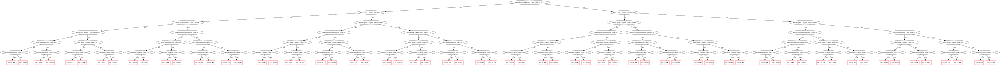

In [ ]:
pool = Pool(X, y, feature_names=list(X.columns))

model = CatBoostRegressor(
    max_depth=2, verbose=False, max_ctr_complexity=1, iterations=2).fit(pool)
cbr.plot_tree(
    tree_idx=0,
    pool=pool
)

In [ ]:
from catboost import CatBoostRegressor
cv = KFold(n_splits=5, random_state=42, shuffle=True)
param_grid = {
    'iterations': [100,300,500,1000], #1000
    'learning_rate': [0.01,0.05,0.1], #0.05
    'depth': [3, 6,8, 10], #6
    'l2_leaf_reg': [0.2,0.5,1], #0.5
}

cbr = CatBoostRegressor()
grid_search = GridSearchCV(estimator=cbr, param_grid=param_grid, scoring='neg_mean_squared_error', cv=cv)

start_time = time.time()
grid_search.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(grid_search)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
best_reg = grid_search.best_estimator_
y_pred = best_reg.predict(X_test)
nb_splits = calculate_cb_splits(cbr)

saveResults(y_test,y_pred,"CAT Boost Regressor ",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

Best parameters: {'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05}


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CAT Boost Regressor,0.282,0.211,0.998,47,5.193286,1.481,28.687,0.440,3000.0
1,CAT Boost Regressor,0.274,0.201,0.998,47,19.680907,0.852,27.099,0.463,6000.0
2,CAT Boost Regressor,0.282,0.211,0.998,47,1165.061502,0.532,3.702,0.447,NaN
3,CAT Boost Regressor,0.274,0.201,0.998,47,800.729506,0.546,6.646,0.463,6000.0


##**Other ML Regressor Models**

###**Decision Tree Regressor**

In [ ]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor(random_state = 42)
start_time = time.time()
dt.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(dt)

y_pred = dt.predict(X_test)
nb_splits = calculate_dt_splits(dt)

saveResults(y_test,y_pred,"Decision Tree",X.shape[1],training_time,inference_time_per_data_point,nb_splits)
get_results()

Total number of splits for Decision Tree Regressor: 7654


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654


In [ ]:
from sklearn.tree import DecisionTreeRegressor
k=5
dt = DecisionTreeRegressor(random_state = 42)
cv = KFold(n_splits=k, random_state=42, shuffle=True)

start_time = time.time()
scores = cross_validate(dt, X_train, y_train, cv=cv,scoring=('r2', 'neg_mean_squared_error','neg_mean_absolute_error'))
end_time = time.time()

training_time = end_time - start_time

rmse = sqrt(mean(absolute(scores['test_neg_mean_squared_error'])))
mae= mean(absolute(scores['test_neg_mean_absolute_error']))
r2= mean(absolute(scores['test_r2']))
nb_splits = calculate_dt_splits(dt)

inference_time_per_data_point = calc_inference_time(dt,flag=training_time)
addResults(rmse,mae,r2,f'Decision Tree with CV={k}',X.shape[1],training_time,inference_time_per_data_point,nb_splits)

###**Random Forest Regressor**

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rfc = RandomForestRegressor()

start_time = time.time()
rfc.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(rfc)

y_pred = rfc.predict(X_test)
# nb_splits = calculate_splits(rfc)

saveResults(y_test,y_pred,"Random Forest",X.shape[1],training_time,inference_time_per_data_point,'-')
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654
7,Random Forest,0.314,0.236,0.997,47,13.787344,3.592,11.531,2.692,-


In [ ]:
from sklearn.ensemble import RandomForestRegressor
k=5
rfc = RandomForestRegressor()
cv = KFold(n_splits=k, random_state=42, shuffle=True)

start_time = time.time()
scores = cross_validate(rfc, X_train, y_train, cv=cv,scoring=('r2', 'neg_mean_squared_error','neg_mean_absolute_error'))
end_time = time.time()

training_time = end_time - start_time
rmse = sqrt(mean(absolute(scores['test_neg_mean_squared_error'])))
mae= mean(absolute(scores['test_neg_mean_absolute_error']))
r2= mean(absolute(scores['test_r2']))
nb_splits = calculate_splits(rfc)

inference_time_per_data_point = calc_inference_time(rfc,flag=training_time)
addResults(rmse,mae,r2,f'Random Forest with CV={k}',X.shape[1],training_time,inference_time_per_data_point,nb_splits)

In [ ]:
rfc.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

###**Linear Regression**

In [ ]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()

start_time = time.time()
lr.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(lr)

y_pred = lr.predict(X_test)
saveResults(y_test,y_pred,"Linear Regression",X.shape[1],training_time,inference_time_per_data_point,'-')
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654
7,Random Forest,0.314,0.236,0.997,47,13.787344,3.592,11.531,2.692,-
8,Linear Regression,0.641,0.478,0.989,47,0.044929,0.064,2.344,0.049,-


<Axes: >

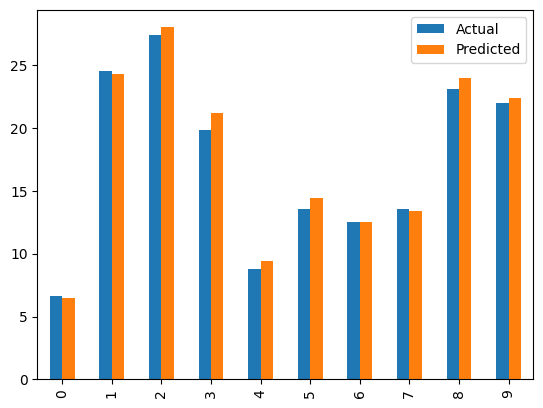

In [ ]:
evaluate = pd.DataFrame({"Actual": y_test.values.flatten(), "Predicted": y_pred.flatten()})
evaluate.head(10)
evaluate.head(10).plot(kind = 'bar')

In [ ]:
selected_features = ['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths',
       'STD Spans Lengths', 'Min Spans Lengths',  'Ligthpath Total Traffic Load',
       'Mean Links Lengths', 'Max Links Lengths', 'Lightpath Lengths',]
                    #  'Left Hand Lihthpath Traffic Load'
                    #  'Root Mean Square Link Powers', 'Right Hand Lihthpath Traffic Load']

train_selected_features(selected_features,'Linear Regression',model='linear_regression' )

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms)
0,Linear Regression,0.641,0.478,0.989,47,0.015027,0.055,1.052,0.042
1,Feature Selection method: Linear Regression FS,0.832,0.642,0.982,12,0.006560,0.054,4.059,0.041
2,Feature Selection method: Linear Regression FS,0.844,0.645,0.981,10,0.012180,0.052,0.663,0.041
3,Feature Selection method: Linear Regression,0.843,0.645,0.981,9,0.013898,0.065,9.135,0.042


##**DNN Model**

###**Sequential Model**

In [ ]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               6144      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 171,009
Trainable params: 171,009
Non-trainable params: 0
_________________________________________________________________


In [ ]:
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5'
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [ ]:
start_time = time.time()
NN_model.fit(X_train, y_train,validation_data=(X_test,y_test), epochs=500, batch_size=32, validation_split = 0.2, callbacks=callbacks_list)
end_time = time.time()

training_time = end_time - start_time
# inference_time_per_data_point = calc_inference_time(NN_model)
inference_time_per_data_point = (83.917, 824.466, 51.541)

Epoch 1/500
230/240 [===========================>..] - ETA: 0s - loss: 2.7867 - mean_absolute_error: 2.7867
Epoch 1: val_loss improved from inf to 1.40042, saving model to Weights-001--1.40042.hdf5
240/240 [==============================] - 8s 6ms/step - loss: 2.7393 - mean_absolute_error: 2.7393 - val_loss: 1.4004 - val_mean_absolute_error: 1.4004
Epoch 2/500
231/240 [===========================>..] - ETA: 0s - loss: 1.2147 - mean_absolute_error: 1.2147
Epoch 2: val_loss improved from 1.40042 to 1.00392, saving model to Weights-002--1.00392.hdf5
240/240 [==============================] - 3s 12ms/step - loss: 1.2153 - mean_absolute_error: 1.2153 - val_loss: 1.0039 - val_mean_absolute_error: 1.0039
Epoch 3/500
239/240 [============================>.] - ETA: 0s - loss: 1.0758 - mean_absolute_error: 1.0758
Epoch 3: val_loss did not improve from 1.00392
240/240 [==============================] - 1s 4ms/step - loss: 1.0752 - mean_absolute_error: 1.0752 - val_loss: 1.0129 - val_mean_absolute

In [ ]:
wights_file = 'Weights-470--0.21122.hdf5' # choose the best checkpoint
NN_model.load_weights(wights_file) # load it
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

y_pred = NN_model.predict(X_test)
total_params = NN_model.count_params()

print("Total parameters for Keras Sequential DNN:", total_params)
saveResults(y_test,y_pred,"Keras Sequential DNN",X.shape[1],training_time,inference_time_per_data_point,total_params)
get_results()

60/60 [==============================] - 0s 1ms/step
Total parameters for Keras Sequential DNN: 171009


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654
7,Random Forest,0.314,0.236,0.997,47,13.787344,3.592,11.531,2.692,-
8,Linear Regression,0.641,0.478,0.989,47,0.044929,0.064,2.344,0.049,-
9,Keras Sequential DNN,0.292,0.211,0.998,47,742.848444,83.917,824.466,51.541,171009


###**DNN with Gridsearch CV=5**

In [ ]:
def create_model(optimizer = 'adam'):
    NN_model = Sequential()

    # The Input Layer :
    NN_model.add(Dense(128, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))

    # The Hidden Layers :
    NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

    # The Output Layer :
    NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

    # Compile the network :
    NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    return NN_model

In [ ]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

param_grid_dnn = {
    'epochs': [100],
     'batch_size': [128],
}
dnn_model = KerasRegressor(build_fn=create_model, verbose=0)

grid_search_dnn = GridSearchCV(estimator=dnn_model,
                               param_grid=param_grid_dnn,
                               scoring='neg_mean_squared_error',
                               cv=5,
                               n_jobs=-1)
start_time = time.time()
grid_search_dnn.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
# inference_time_per_data_point = calc_inference_time(grid_search_dnn)

# Best DNN model and best hyperparameters
best_dnn_model = grid_search_dnn.best_estimator_
best_dnn_params = grid_search_dnn.best_params_

print("Best DNN Hyperparameters:", best_dnn_params)

y_pred = best_dnn_model.predict(X_test)

inference_time_per_data_point = (end_time - start_time) / num_data_points
saveResults(y_test,y_pred,"DNN with GridSearch",X.shape[1],training_time,'inference_time_per_data_point')

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms)
0,XGB Regressor,0.307,0.227,0.997,47,2.468883514404297,2.472,62.065,0.458
1,XGB Regressor,0.306,0.226,0.998,47,6.106178045272827,0.634,42.605,0.453
2,Farhad Results,0.307,0.224,0.997,47,17.7103214263916,0.842,41.878,0.536
3,Farhad Results,0.301,0.224,0.998,47,3.2370896339416504,0.691,31.004,0.475
4,Farhad Results,0.301,0.224,0.998,47,3.7527480125427246,0.864,41.525,0.471
5,XGB with tuning,0.283,0.210,0.998,47,20.95737910270691,2.000,63.334,0.477
6,Farhad Results,0.307,0.224,0.997,47,10.333722829818726,0.768,37.019,0.537
7,XGB with tuning,0.283,0.210,0.998,47,7.390648603439331,0.575,28.702,0.473
8,XGB Regressor,0.306,0.226,0.998,47,4.922172546386719,0.682,35.995,0.452
9,XGB with tuning,0.283,0.210,0.998,47,5.0652313232421875,0.769,52.815,0.472


In [ ]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

dnn_model = KerasRegressor(build_fn=create_model, verbose=0,epochs=100,batch_size=128)

start_time = time.time()
dnn_model.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
# inference_time_per_data_point = calc_inference_time(dnn_model)
y_pred = dnn_model.predict(X_test)

saveResults(y_test,y_pred,"DNN with GridSearch",X.shape[1],training_time,inference_time_per_data_point)
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms)
0,XGB Regressor,0.307,0.227,0.997,47,2.468883514404297,2.472,62.065,0.458
1,XGB Regressor,0.306,0.226,0.998,47,6.106178045272827,0.634,42.605,0.453
2,Farhad Results,0.307,0.224,0.997,47,17.7103214263916,0.842,41.878,0.536
3,Farhad Results,0.301,0.224,0.998,47,3.2370896339416504,0.691,31.004,0.475
4,Farhad Results,0.301,0.224,0.998,47,3.7527480125427246,0.864,41.525,0.471
5,XGB with tuning,0.283,0.210,0.998,47,20.95737910270691,2.000,63.334,0.477
6,Farhad Results,0.307,0.224,0.997,47,10.333722829818726,0.768,37.019,0.537
7,XGB with tuning,0.283,0.210,0.998,47,7.390648603439331,0.575,28.702,0.473
8,XGB Regressor,0.306,0.226,0.998,47,4.922172546386719,0.682,35.995,0.452
9,XGB with tuning,0.283,0.210,0.998,47,5.0652313232421875,0.769,52.815,0.472


###**MLP**

In [ ]:
from sklearn.neural_network import MLPRegressor

dnn_param_grid = {
    'hidden_layer_sizes': [ (100,),(50,),(50,50)],  # Number of neurons in each hidden layer
    'activation': ['relu'],  # Activation function
    'learning_rate_init': [ 0.01,0.03],  # Initial learning rate,
  'learning_rate':  ['adaptive'],
     'batch_size': [16,32,128],
    'early_stopping':[True]
}
cv = KFold(n_splits=5, shuffle=True, random_state=42)
dnn_reg = MLPRegressor(random_state=42)

grid_search_dnn = GridSearchCV(dnn_reg, dnn_param_grid, cv=cv, scoring='neg_mean_squared_error')

start_time = time.time()
grid_search_dnn.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(grid_search_dnn)
best_dnn_model = grid_search_dnn.best_estimator_
best_dnn_params = grid_search_dnn.best_params_

print("Best DNN Hyperparameters:", best_dnn_params)
y_pred_dnn = best_dnn_model.predict(X_test)

total_params = best_dnn_model.n_layers_ - 1  # Excluding the input layer
print("Total layers for MLP Regressor:", total_params)

saveResults(y_test,y_pred_dnn,"MLP with tuning",X.shape[1],training_time,inference_time_per_data_point,total_params)
get_results()

In [ ]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(random_state=42)

start_time = time.time()
mlp.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
inference_time_per_data_point = calc_inference_time(mlp)

y_pred_dnn = mlp.predict(X_test)
total_params=sum(param.size for param in mlp.coefs_) + sum(param.size for param in mlp.intercepts_)

print("Total layers for MLP Regressor:", total_params)
saveResults(y_test,y_pred_dnn,"MLP with tuning",X.shape[1],training_time,inference_time_per_data_point,total_params)
get_results()

Total layers for MLP Regressor: 4901


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654
7,Random Forest,0.314,0.236,0.997,47,13.787344,3.592,11.531,2.692,-
8,Linear Regression,0.641,0.478,0.989,47,0.044929,0.064,2.344,0.049,-
9,Keras Sequential DNN,0.292,0.211,0.998,47,742.848444,83.917,824.466,51.541,171009


4901

## **EVALUATION**

In [ ]:
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307,0.224,0.997,47,10.661812,0.610,23.125,0.527,23652
1,XGB with tuning,0.283,0.210,0.998,47,4.511100,0.735,48.804,0.465,5359
2,GB Regressor with tuning,0.281,0.209,0.998,47,24.806895,0.307,4.025,0.192,3476
3,HGB with tuning,0.284,0.209,0.998,47,3.152085,6.023,1413.458,4.689,1320
4,LGB Regressor with tuning,0.277,0.203,0.998,47,1.345801,0.656,3.953,0.519,6899
5,CAT Boost Regressor,0.274,0.201,0.998,47,8.140874,0.610,8.309,0.411,6000
6,Decision Tree,0.468,0.350,0.994,47,0.208251,0.075,0.527,0.054,7654
7,Random Forest,0.314,0.236,0.997,47,13.787344,3.592,11.531,2.692,-
8,Linear Regression,0.641,0.478,0.989,47,0.044929,0.064,2.344,0.049,-
9,Keras Sequential DNN,0.292,0.211,0.998,47,742.848444,83.917,824.466,51.541,171009


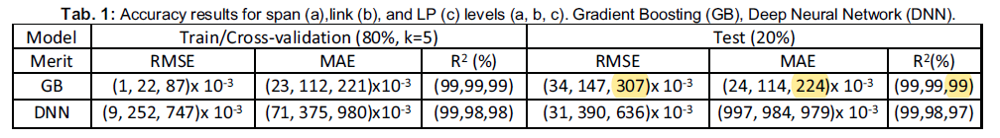

#**SHAP Explanations**

In [ ]:
explainer = shap.TreeExplainer(cbr) #replace model with either lgb or xgb or cbr
shap_values = explainer.shap_values(X_test)
# shap_interaction_values = shap.TreeExplainer(xgb).shap_interaction_values(X_test)
shap.initjs()

###***Global Explanations show importance of each feature***

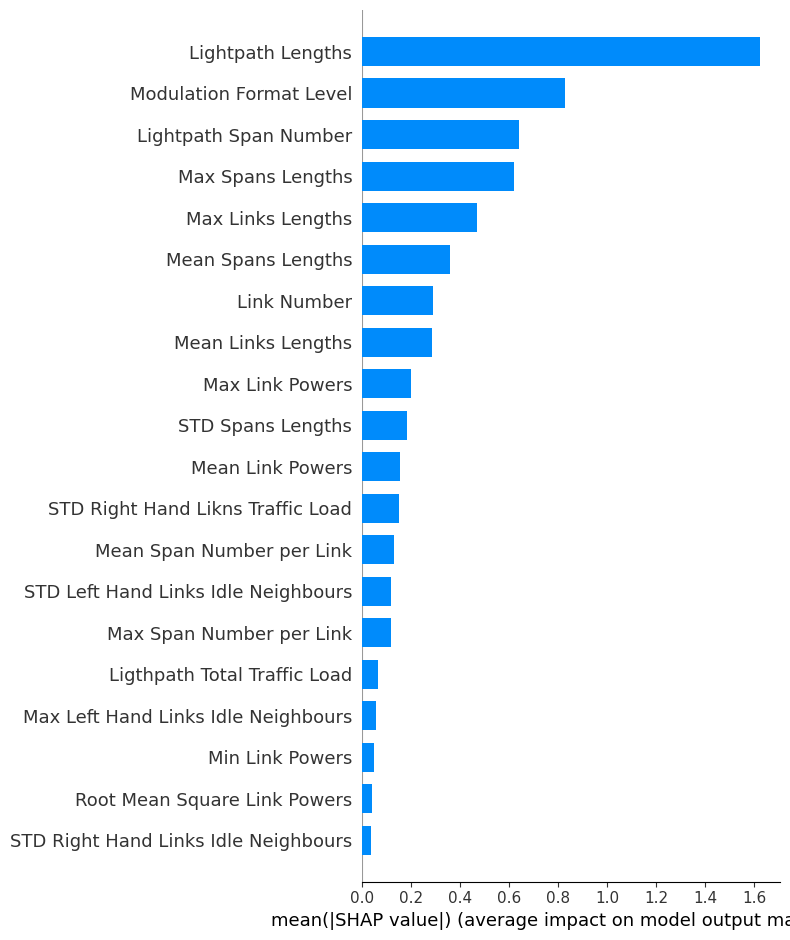

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

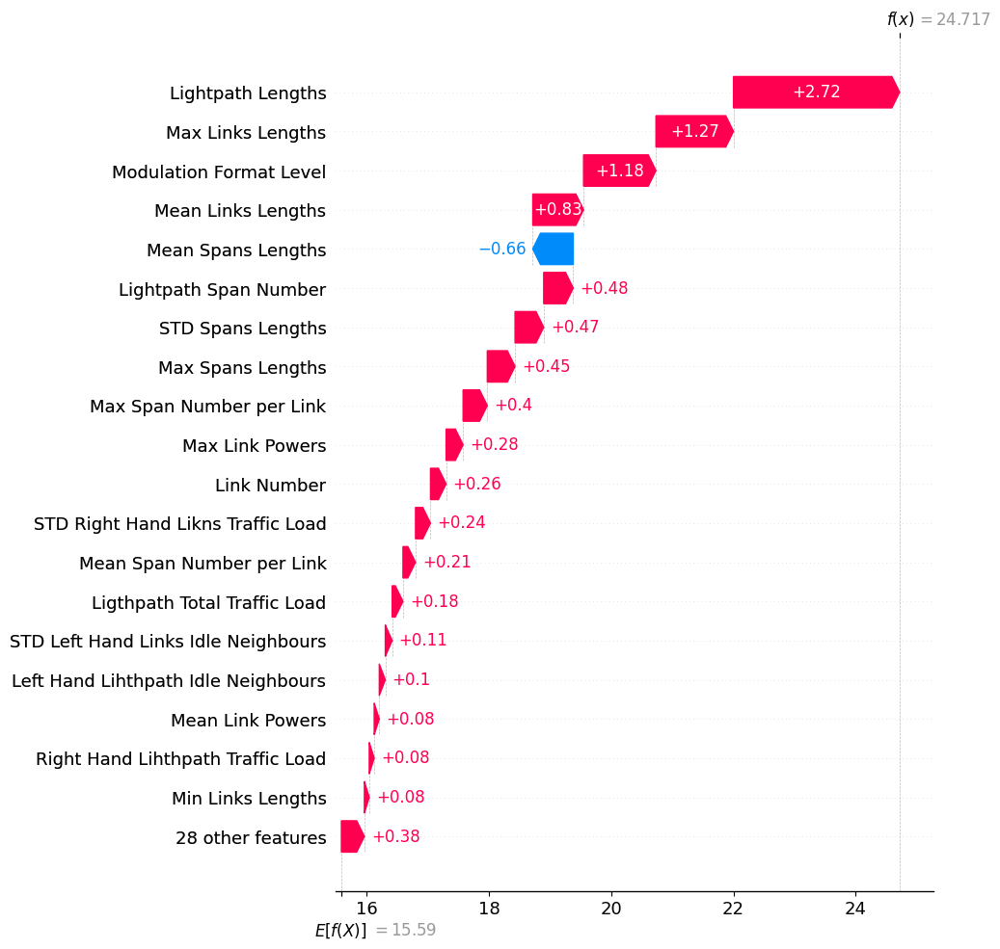

In [ ]:
shap.waterfall_plot(shap.Explanation(values=shap_values[1],feature_names=X_train.columns, base_values=cbr.predict(X_train).mean()), max_display=20)

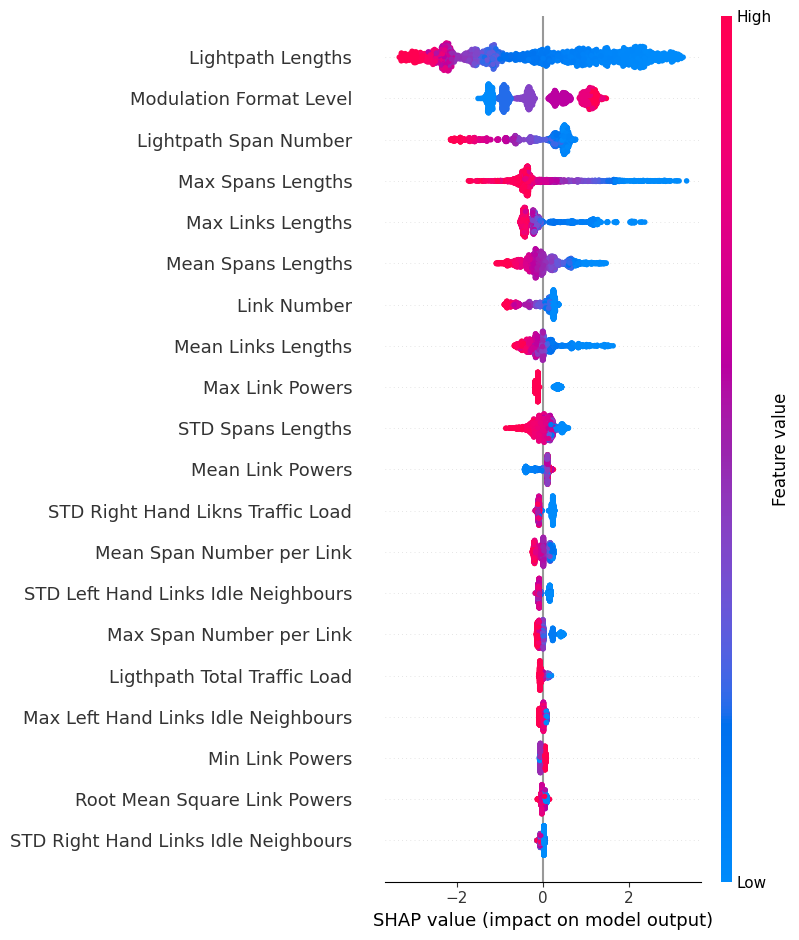

In [ ]:
shap.summary_plot(shap_values, X_test)


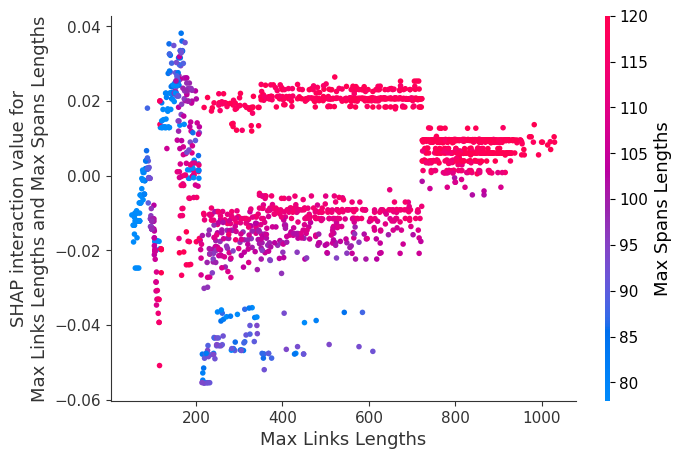

In [ ]:
#
# shap.dependence_plot("Lightpath Lengths", shap_values, X_test)
# shap.dependence_plot("Modulation Format Level", shap_values, X_test)
# shap.dependence_plot("Max Spans Lengths", shap_values, X_test)

# shap.dependence_plot(("Lightpath Lengths","Modulation Format Level"), shap_interaction_values, X_test)
shap.dependence_plot(("Max Links Lengths","Max Spans Lengths"), shap_interaction_values, X_test)


In [ ]:
shap.initjs()
observation=1
# shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:],matplotlib=True,show=False)
# shap.force_plot(explainer.expected_value, shap_values, X_test)
shap.force_plot(explainer.expected_value, shap_values[observation,:], X_test.iloc[observation,:])
# plt.savefig("shap_force_plot2.jpg")

###***Local Shap Individual Predictions***

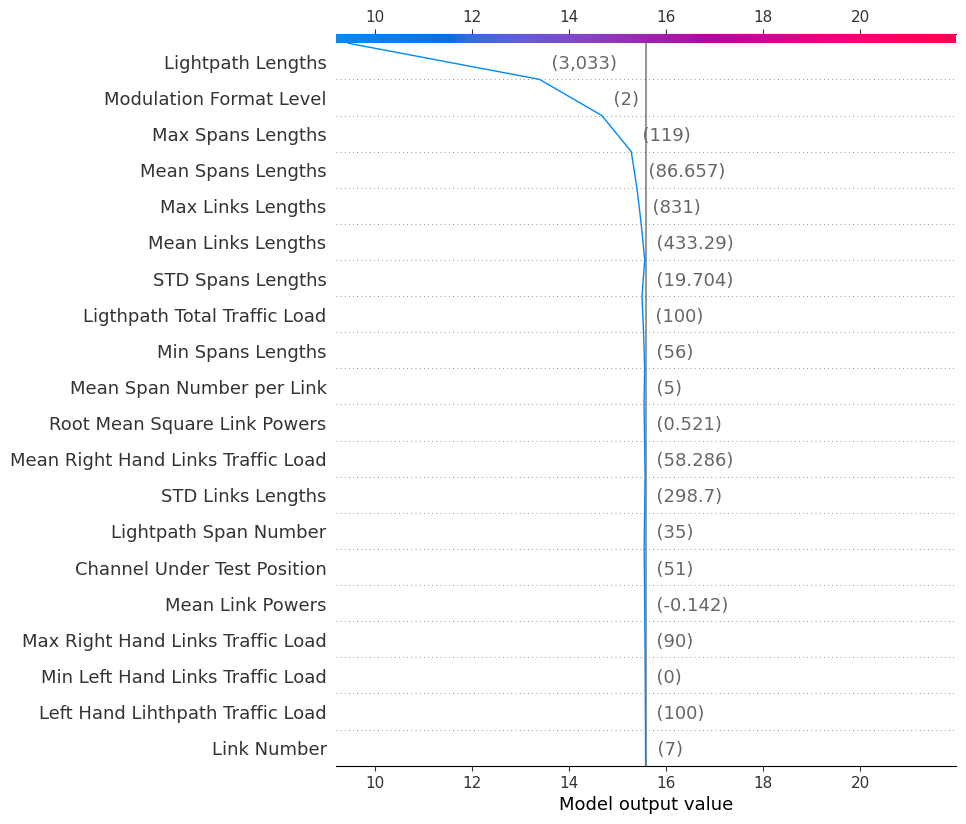

In [ ]:
shap.initjs()
i=259
def shap_plot(j):
    explainerModel = shap.TreeExplainer(lgb)
    shap_values_Model = explainerModel.shap_values(X_test)
    # p = shap.force_plot(explainerModel.expected_value, shap_values_Model[j], X_test.iloc[[j]],matplotlib=True,show=False)
    p= shap.decision_plot(explainerModel.expected_value, shap_values_Model[j], X_test.iloc[[j]])
    return(p)

# avgValues = X_train.mean()
# print(avgValues)
shap_plot(i)
# plt.savefig(f'shap_force_plot_{i}.jpg')

#**Feature selection**

In [ ]:
feature_selection_type='xgb' #can only take lgb or xgb or cbr
feature_selection_model=xgb

##**Method 1: Powershap**

In [ ]:
! pip install powershap
from powershap import PowerShap

In [ ]:
model_ps = feature_selection_model
if feature_selection_type == 'cbr':
  selector_cbr = CatBoostRegressor()
  selector = PowerShap(
    model = selector_cbr,
    automatic=True, limit_automatic=100)
else:
  selector = PowerShap(
      model = model_ps,
      automatic=True, limit_automatic=100)

selector.fit(X_train, y_train,early_stopping_rounds=10)

selected_features_ps = selector.transform(X_train).columns
print(selector._processed_shaps_df)
train_selected_features_with_hypertuning(selected_features_ps,f'PowerShap for {feature_selection_type}',model=feature_selection_type)

###**Saved Powershap Models**

**xgb**

In [ ]:
params_xgb = {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,'reg_alpha':0.1,'reg_lambda':0.1,'gamma':0.2}
selected_features_xgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Lightpath Lengths', 'Root Mean Square Link Powers']
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_xgb], y, test_size=0.2, random_state=42)

xgb=train_prepared_model (selected_features_xgb,params_xgb,'xgb',f'PowerShap for XGB')
get_results()

total_splits: 3072


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.210,0.998,47,5.065176,2.479,80.801,0.471,5359
1,LGB Regressor with tuning,0.282,0.207,0.998,47,3.024095,3.004,58.139,0.662,3315
2,CAT Boost Regressor,0.276,0.203,0.998,47,21.542594,1.517,48.800,0.458,32860
3,LGB Regressor with tuning,0.282,0.207,0.998,47,1.730443,1.075,22.233,0.515,3424
4,XGB,0.738,0.501,0.986,2,0.746403,0.865,46.508,0.451,1874
5,PowerShap for XGB,0.280,0.206,0.998,9,2.587915,0.573,10.446,0.488,3072
6,PowerShap for XGB,0.280,0.206,0.998,9,9.286645,1.189,49.044,0.489,3072


**lgb**

In [ ]:
params_lgb={'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_samples': 10, 'n_estimators': 500, 'num_leaves': 15,'verbosity':-1}
selected_features_lgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Mean Links Lengths',
                       'Max Links Lengths', 'Min Links Lengths', 'Lightpath Lengths', 'Mean Link Powers','Root Mean Square Link Powers','Right Hand Lihthpath Traffic Load', 'Mean Right Hand Links Traffic Load']

train_prepared_model (selected_features_lgb,params_lgb,'lgb',f'PowerShap for LGB')

Total number of splits: 4823


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CORRECT fs for LGB,0.278,0.204,0.998,16,0.622253,1.805,14.193,0.639,4823
1,CORRECT fs for LGB,0.278,0.204,0.998,16,0.571223,1.798,17.038,0.651,4823
2,PowerShap for LGB,0.274,0.200,0.998,13,0.491190,0.795,7.189,0.587,5024
3,CORRECT fs for LGB,0.278,0.204,0.998,16,0.917103,1.905,13.224,0.651,4823
4,PowerShap for LGB,0.274,0.200,0.998,13,0.489763,0.795,6.408,0.587,5024
5,PowerShap for LGB,0.274,0.202,0.998,13,0.477296,1.761,17.746,0.648,4704
6,LGB FS,0.278,0.204,0.998,16,0.591343,1.849,13.804,0.660,4823
7,LGB FS,0.278,0.204,0.998,16,0.593689,1.826,15.794,0.655,4823
8,CORRECT fs for LGB,0.278,0.204,0.998,16,0.605203,1.775,16.699,0.663,4823
9,CORRECT fs for LGB,0.288,0.214,0.998,16,0.546494,1.735,14.251,0.650,6529


**cb**

In [ ]:
params_cb = {'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05}
selected_features_cb=['Modulation Format Level', 'Link Number', 'Mean Spans Lengths', 'Max Spans Lengths','Min Spans Lengths', 'STD Spans Lengths',
                      'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths',
                      'Mean Span Number per Link', 'Max Span Number per Link', 'Lightpath Span Number', 'Mean Link Powers', 'Root Mean Square Link Powers',
                      'Min Link Powers', 'STD Link Powers']

train_prepared_model (selected_features_cb,params_cb,'cbr',f'PowerShap for CatBoost')

0:	learn: 5.9854195	test: 5.8459887	best: 5.8459887 (0)	total: 3.63ms	remaining: 3.63s
1:	learn: 5.7145120	test: 5.5774745	best: 5.5774745 (1)	total: 7.42ms	remaining: 3.7s
2:	learn: 5.4437504	test: 5.3119145	best: 5.3119145 (2)	total: 11.7ms	remaining: 3.88s
3:	learn: 5.1950902	test: 5.0698123	best: 5.0698123 (3)	total: 15.1ms	remaining: 3.77s
4:	learn: 4.9545765	test: 4.8315776	best: 4.8315776 (4)	total: 18.6ms	remaining: 3.69s
5:	learn: 4.7298419	test: 4.6083606	best: 4.6083606 (5)	total: 22ms	remaining: 3.65s
6:	learn: 4.5113434	test: 4.3939376	best: 4.3939376 (6)	total: 25.4ms	remaining: 3.6s
7:	learn: 4.3022665	test: 4.1885263	best: 4.1885263 (7)	total: 28.8ms	remaining: 3.57s
8:	learn: 4.1092033	test: 4.0005811	best: 4.0005811 (8)	total: 32.4ms	remaining: 3.57s
9:	learn: 3.9260328	test: 3.8235258	best: 3.8235258 (9)	total: 36ms	remaining: 3.57s
10:	learn: 3.7508165	test: 3.6530546	best: 3.6530546 (10)	total: 40ms	remaining: 3.6s
11:	learn: 3.5805425	test: 3.4877716	best: 3.48777

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB,0.283,0.210,0.998,47,5.065176,2.479,80.801,0.471,5359
1,LGB Regressor with tuning,0.282,0.207,0.998,47,3.024095,3.004,58.139,0.662,3315
2,CAT Boost Regressor,0.276,0.203,0.998,47,21.542594,1.517,48.800,0.458,32860
3,LGB Regressor with tuning,0.282,0.207,0.998,47,1.730443,1.075,22.233,0.515,3424
4,XGB,0.738,0.501,0.986,2,0.746403,0.865,46.508,0.451,1874
5,PowerShap for XGB,0.280,0.206,0.998,9,2.587915,0.573,10.446,0.488,3072
6,PowerShap for XGB,0.280,0.206,0.998,9,9.286645,1.189,49.044,0.489,3072
7,PowerShap for LGB,0.274,0.200,0.998,13,0.913769,1.440,26.878,0.547,5024
8,PowerShap for CatBoost,0.269,0.198,0.998,19,4.885294,0.581,16.753,0.360,33617


##**Method 2: Shaphypetune**

In [ ]:
! pip install shap-hypetune
from shaphypetune import BoostSearch, BoostRFE, BoostRFA, BoostBoruta

In [ ]:
from shaphypetune import BoostSearch, BoostRFE, BoostRFA, BoostBoruta
param_grid = {
              'objective':['reg:squarederror'],
              'learning_rate': [0.01,0.1], #0.1
              'max_depth': [3,6],#6
              'min_child_weight': [1,3],#3
              'subsample': [0.3,0.8], #0.8
              'n_estimators': [300,500], #500
              'reg_alpha': [0.1, 0.5],#0.5
              'reg_lambda': [ 0.1, 0.5],#0.5
              'gamma': [ 0.1, 0.2],#0.2
           }
xgb_model = XGBRegressor()
X_train, X_valid, y_train, y_valid = train_test_split(
X_train, y_train, test_size=0.2, shuffle=True, random_state=33)
model = BoostSearch(xgb_model, param_grid=param_grid, greater_is_better=True)
model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric='mae', early_stopping_rounds=3, verbose=0)
y_pred =  model.estimator_.predict(X_test)
print( model.best_params_)
saveResults(y_test,y_pred,"XGB with BoostSearch",'training_time','inference_time_per_data_point')
get_results()

In [ ]:
X_regr_train, X_regr_valid, y_regr_train, y_regr_valid = train_test_split(
    X_train, y_train, test_size=0.2, shuffle=False)

###**Boruta**

In [ ]:
model_boruta = BoostBoruta(feature_selection_model, max_iter=200, perc=100,importance_type='shap_importances', train_importance=False)
model_boruta.fit(X_regr_train, y_regr_train, eval_set=[(X_regr_valid, y_regr_valid)],eval_metric='mae')
# , early_stopping_rounds=6, verbose=0)

selected_features_br = (model_boruta.transform(X_regr_valid).columns) #to see which features

# train_selected_features(selected_features_br,'Boruta',model=feature_selection_type)
train_selected_features_with_hypertuning(selected_features_br,f'Boruta + Tuning',model=feature_selection_type)
get_results()

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warnin

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850


####**Saved Models**

**XGB**

In [ ]:
params_xgb ={'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,'reg_alpha':0.1,'reg_lambda':0.1,'gamma':0.2}
selected_features_xgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths',
                       'Min Links Lengths', 'Lightpath Lengths', 'Root Mean Square Link Powers','Right Hand Lihthpath Traffic Load', 'Mean Right Hand Links Traffic Load']
train_prepared_model (selected_features_xgb,params_xgb,'xgb',f'Boruta for XGB')

**LGB**

In [ ]:
params_lgb={'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_samples': 5, 'n_estimators': 500, 'num_leaves': 15,'verbosity':-1}

selected_features_lgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths',
                       'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths', 'Root Mean Square Link Powers','Right Hand Lihthpath Traffic Load', 'Mean Right Hand Links Traffic Load']
train_prepared_model (selected_features_lgb,params_lgb,'lgb',f'Boruta for LGB')

Total number of splits: 3850


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850
5,Boruta for LGB,0.278,0.204,0.998,14,0.346987,0.585,4.829,0.514,3850


###**RFE**

In [ ]:
model_rfe = BoostRFE(feature_selection_model, min_features_to_select=1, step=1,importance_type='shap_importances', train_importance=False)
model_rfe.fit(X_regr_train, y_regr_train, eval_set=[(X_regr_valid, y_regr_valid)],eval_metric='rmse')#, early_stopping_rounds=6, verbose=0)

selected_features_rfe = (model_rfe.transform(X_regr_valid).columns) #to see which features
# train_selected_features(selected_features_rfe,'RFE',model=feature_selection_type)
train_selected_features_with_hypertuning(selected_features_rfe,f'RFE + Tuning',model=feature_selection_type)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warnin

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850
5,Boruta for LGB,0.278,0.204,0.998,14,0.346987,0.585,4.829,0.514,3850
6,RFE + Tuning,0.279,0.204,0.998,10,0.256742,1.441,12.338,0.567,3576


####**Saved Models**

**XGB**

In [ ]:
params_xgb = {'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 300, 'objective': 'reg:squarederror', 'subsample': 0.8,'reg_alpha':0.1,'reg_lambda':0.1,'gamma':0.2}
selected_features_xgb=[
    "Modulation Format Level",
    "Mean Spans Lengths",
    "Max Spans Lengths",
    "Min Spans Lengths",
    "STD Spans Lengths",
    "Ligthpath Total Traffic Load",
    "Mean Links Lengths",
    "Max Links Lengths",
    "Min Links Lengths",
    "Lightpath Lengths",
    "Root Mean Square Link Powers",
    "Mean Right Hand Links Traffic Load"
]
train_prepared_model (selected_features_xgb,params_xgb,'xgb',f'RFE for XGB')

**LGB**

In [ ]:
params_lgb = {'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_samples': 15, 'n_estimators': 500, 'num_leaves': 15,'verbosity':-1}
selected_features_lgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths','STD Spans Lengths','Ligthpath Total Traffic Load',
                       'Mean Links Lengths', 'Max Links Lengths','Lightpath Lengths', 'Root Mean Square Link Powers']
train_prepared_model (selected_features_lgb,params_lgb,'lgb',f'RFE for LGB')

Total number of splits: 3576


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850
5,Boruta for LGB,0.278,0.204,0.998,14,0.346987,0.585,4.829,0.514,3850
6,RFE + Tuning,0.279,0.204,0.998,10,0.256742,1.441,12.338,0.567,3576
7,RFE for LGB,0.279,0.204,0.998,10,0.248590,0.676,5.664,0.510,3576


###**RFA**

In [ ]:
from hyperopt import Trials

model_rfa = BoostRFA(feature_selection_model, min_features_to_select=1, step=1,importance_type='shap_importances', train_importance=False)
model_rfa.fit(X_regr_train, y_regr_train, trials=Trials(),eval_set=[(X_regr_valid, y_regr_valid)],eval_metric='mae')
#,early_stopping_rounds=6, verbose=0)

selected_features_rfa = (model_rfa.transform(X_regr_valid).columns) #to see which features
# train_selected_features(selected_features_rfa,'RFA',model=feature_selection_type)
train_selected_features_with_hypertuning(selected_features_rfa,f'RFA + Tuning',model=feature_selection_type)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warnin

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850
5,Boruta for LGB,0.278,0.204,0.998,14,0.346987,0.585,4.829,0.514,3850
6,RFE + Tuning,0.279,0.204,0.998,10,0.256742,1.441,12.338,0.567,3576
7,RFE for LGB,0.279,0.204,0.998,10,0.248590,0.676,5.664,0.510,3576
8,RFA + Tuning,0.278,0.203,0.998,27,0.711903,1.438,13.121,0.569,5440


####**Saved Models**

**XGB**

In [ ]:
params_xgb ={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 300, 'objective': 'reg:squarederror', 'subsample': 0.8,'reg_alpha':0.1,'reg_lambda':0.1,'gamma':0.2}
selected_features_xgb=[
    "Modulation Format Level","Link Number","Mean Spans Lengths","Max Spans Lengths", "Min Spans Lengths","STD Spans Lengths","Ligthpath Total Traffic Load",
    "Mean Links Lengths","Max Links Lengths","Min Links Lengths","STD Links Lengths","Lightpath Lengths","Mean Span Number per Link","Max Span Number per Link",
    "STD Span Number per Link","Lightpath Span Number","Mean Link Powers", "Root Mean Square Link Powers", "Max Link Powers","Min Link Powers","STD Link Powers",
    "Right Hand Lihthpath Traffic Load","Left Hand Lihthpath Traffic Load",
"STD Right Hand Likns Traffic Load","STD Right Hand Links Idle Neighbours","STD Left Hand Likns Traffic Load","STD Left Hand Links Idle Neighbours"]
train_prepared_model (selected_features_xgb,params_xgb,'xgb',f'RFA for XGB')

**LGB**

In [ ]:
params_lgb = {'lambda_l1': 0.1, 'lambda_l2': 0.2, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_samples': 15, 'n_estimators': 500, 'num_leaves': 15,'verbosity':-1}
selected_features_lgb=['Modulation Format Level', 'Link Number', 'Mean Spans Lengths',
       'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths',
       'Ligthpath Total Traffic Load', 'Mean Links Lengths',
       'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths',
       'Lightpath Lengths', 'Mean Span Number per Link',
       'Max Span Number per Link', 'STD Span Number per Link',
       'Lightpath Span Number', 'Mean Link Powers',
       'Root Mean Square Link Powers', 'Max Link Powers', 'Min Link Powers',
       'STD Link Powers', 'Right Hand Lihthpath Traffic Load',
       'Left Hand Lihthpath Traffic Load', 'STD Right Hand Likns Traffic Load',
       'STD Right Hand Links Idle Neighbours',
       'STD Left Hand Likns Traffic Load',
       'STD Left Hand Links Idle Neighbours']
train_prepared_model (selected_features_lgb,params_lgb,'lgb',f'RFA for LGB')

Total number of splits: 5440


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,PowerShap for LGB,0.274,0.200,0.998,13,0.445479,0.570,1.757,0.502,5024
1,LGB Regressor with tuning,0.282,0.207,0.998,47,1.410452,0.995,37.153,0.518,3315
2,LGB Regressor with tuning,0.282,0.207,0.998,47,1.046307,1.310,31.579,0.518,3315
3,LGB Regressor with tuning,0.282,0.207,0.998,47,0.855126,0.590,2.685,0.517,3315
4,Boruta + Tuning,0.278,0.204,0.998,14,0.358910,1.437,14.782,0.566,3850
5,Boruta for LGB,0.278,0.204,0.998,14,0.346987,0.585,4.829,0.514,3850
6,RFE + Tuning,0.279,0.204,0.998,10,0.256742,1.441,12.338,0.567,3576
7,RFE for LGB,0.279,0.204,0.998,10,0.248590,0.676,5.664,0.510,3576
8,RFA + Tuning,0.278,0.203,0.998,27,0.711903,1.438,13.121,0.569,5440
9,RFA for LGB,0.278,0.203,0.998,27,1.142644,0.985,22.947,0.525,5440


##**Method 3: Another RFA Approach**
(Feature Selection using SHAP: An Explainable AI approach)

* **Author**: Miguel Pimentel da Silva*

In [ ]:
vals= np.abs(shap_values).mean(0)
feature_importance = pd.DataFrame(list(zip(X_train.columns, vals)),columns=['feature_name','importance_value'])
feature_importance.sort_values(by=['importance_value'],ascending=False,inplace=True)
feature_importance.to_csv(f'qot-{feature_selection_type}boost.csv')

print(feature_importance.to_latex())

In [ ]:
measures_data = []
featured_names = []

def print_regression_report(regression_report):
    mae = regression_report["mean_absolute_error"]
    rmse = regression_report["root_mean_squared_error"]
    r2_score = regression_report["r2_score"]

    print(f"Mean absolute Error: {mae}")
    print(f"Root Mean Squared Error: {rmse}")
    print(f"R2 Score: {r2_score}")
    print(f"Training time: {(stop - start) * 1000} s")

def get_regression_measures(feature, regression_report, training_time,inference_time_per_data_point, shap_value, storage,nb_splits):
    mae = regression_report["mean_absolute_error"]
    rmse = regression_report["root_mean_squared_error"]
    r2_score = regression_report["r2_score"]

    measures_data.append([feature, rmse,mae, r2_score, training_time,inference_time_per_data_point, shap_value, storage,nb_splits])

def train_model(feature, shap_value):
    featured_names.append(feature)
    x = df[featured_names]
    x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.8)

    params_XGB={'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 500, 'objective': 'reg:squarederror',
                'subsample': 0.8,'reg_alpha':0.5,'reg_lambda':0.5,'gamma':0.2}
    params_LGB = {'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_samples': 5,
                  'n_estimators': 500,'num_leaves': 8,"verbosity" : -1}
    params_CGB= {'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05,'loss_function':'RMSE'}

    if feature_selection_type == 'xgb':
      model = XGBRegressor(**params_XGB,early_stopping_rounds=10)
    elif feature_selection_type == 'lgb':
     model = LGBMRegressor(**params_LGB,early_stopping_rounds=10)
    elif feature_selection_type == 'cbr':
     model =  CatBoostRegressor(**params_CGB,early_stopping_rounds=10)

    start = time.time()
    model.fit(x_train, y_train, eval_set=[(x_test, y_test)])
    stop = time.time()
    training_time = (stop - start)
    inference_time_per_data_point = calc_inference_time(model,data_points=x.to_numpy())

    y_pred = model.predict(x_test)
    if feature_selection_type == 'cbr':
      nb_splits = calculate_cb_splits(model)
    if feature_selection_type == 'xgb':
      nb_splits = calculate_xgb_splits(model)
    if feature_selection_type == 'lgb':
      nb_splits = calculate_lgb_splits(model)

    storage = get_storage(featured_names)
    regression = {
        "mean_absolute_error": mean_absolute_error(y_test, y_pred),
        "root_mean_squared_error": np.sqrt(mean_squared_error(y_test, y_pred)),
        "r2_score": r2_score(y_test, y_pred)
    }
    get_regression_measures(feature, regression, training_time,inference_time_per_data_point, shap_value, storage,nb_splits)

def get_storage(features):
    merged_features = ['Lightpath GSNR'] + features
    temp = df[merged_features]
    temp.to_csv('temp.csv')

    return os.stat('temp.csv').st_size

def shap_all():
    for index, row in feature_importance.iterrows():
        train_model(row['feature_name'], row['importance_value'])

In [ ]:
shap_all()
measures_df = pd.DataFrame(measures_data, columns = ['Feature Name', 'rmse','mae', 'r2', 'Training Time', 'Inference Time/ Data points', 'Shap Value', 'Storage','Nb Splits'])
measures_df.to_csv(f'{feature_selection_type}boost-report.csv')
measures_df

Streaming output truncated to the last 5000 lines.
256:	learn: 0.3050714	test: 0.3412116	best: 0.3412116 (256)	total: 2.01s	remaining: 5.8s
257:	learn: 0.3046311	test: 0.3408304	best: 0.3408304 (257)	total: 2.02s	remaining: 5.8s
258:	learn: 0.3042177	test: 0.3405881	best: 0.3405881 (258)	total: 2.02s	remaining: 5.79s
259:	learn: 0.3037586	test: 0.3402585	best: 0.3402585 (259)	total: 2.03s	remaining: 5.78s
260:	learn: 0.3035311	test: 0.3401638	best: 0.3401638 (260)	total: 2.04s	remaining: 5.77s
261:	learn: 0.3030296	test: 0.3398183	best: 0.3398183 (261)	total: 2.05s	remaining: 5.76s
262:	learn: 0.3026265	test: 0.3395123	best: 0.3395123 (262)	total: 2.05s	remaining: 5.75s
263:	learn: 0.3021489	test: 0.3391641	best: 0.3391641 (263)	total: 2.07s	remaining: 5.77s
264:	learn: 0.3018135	test: 0.3389156	best: 0.3389156 (264)	total: 2.08s	remaining: 5.76s
265:	learn: 0.3015514	test: 0.3386942	best: 0.3386942 (265)	total: 2.08s	remaining: 5.75s
266:	learn: 0.3011349	test: 0.3384653	best: 0.33846

,Feature Name,rmse,mae,r2,Training Time,Inference Time/ Data points,Shap Value,Storage,Nb Splits
0,Lightpath Lengths,0.950769,0.642706,0.976234,0.435552,"(0.832795500382548, 26.88288688659668, 0.42009...",1.622944,155155,6000
1,Modulation Format Level,0.718095,0.490564,0.986887,0.921538,"(0.4431475990634176, 2.7582645416259766, 0.353...",0.827196,174367,6000
2,Lightpath Span Number,0.522881,0.379585,0.993264,1.898684,"(0.7368828670318012, 6.408929824829102, 0.3952...",0.639430,198460,6000
3,Max Spans Lengths,0.364627,0.286284,0.996523,2.576513,"(0.4628349995647889, 5.736589431762695, 0.3511...",0.619695,234934,6000
4,Max Links Lengths,0.354953,0.274291,0.996683,2.305201,"(0.6335681245703237, 5.671262741088867, 0.3881...",0.468241,272724,6000
5,Mean Spans Lengths,0.339196,0.257399,0.997007,1.101288,"(0.4613156464787257, 5.59687614440918, 0.33092...",0.357367,332281,6000
6,Link Number,0.344060,0.260796,0.996907,1.445068,"(0.6557268626197368, 4.014015197753906, 0.4088...",0.288005,352905,6000
7,Mean Links Lengths,0.352284,0.267266,0.996873,1.417931,"(0.46123015972532677, 4.689455032348633, 0.415...",0.287137,412680,6000
8,Max Link Powers,0.325549,0.247527,0.997319,2.254498,"(0.662232305150194, 4.121541976928711, 0.36239...",0.201148,460666,6000
9,STD Spans Lengths,0.269162,0.195599,0.998114,2.762912,"(0.47883021724654007, 4.624605178833008, 0.427...",0.185427,524367,6000


In [ ]:
#save best result
best_feature_nb =13

selected_features = measures_df['Feature Name'][:best_feature_nb+1,].values
rmse = measures_df.loc[best_feature_nb,'rmse']
mae = measures_df.loc[best_feature_nb,'mae']
r2 = measures_df.loc[best_feature_nb,'r2']
tt = measures_df.loc[best_feature_nb,'Training Time']
it = measures_df.loc[best_feature_nb,'Inference Time/ Data points']
nb_splits = measures_df.loc[best_feature_nb,'Nb Splits']


addResults(rmse,mae,r2,"FS-SHAP",best_feature_nb+1,tt,it,nb_splits)
save_features("FS-SHAP",selected_features)

In [ ]:
##see selected features
selected_features

array(['Lightpath Lengths', 'Modulation Format Level',
       'Lightpath Span Number', 'Max Spans Lengths', 'Max Links Lengths',
       'Mean Spans Lengths', 'Link Number', 'Mean Links Lengths',
       'Max Link Powers', 'STD Spans Lengths', 'Mean Link Powers',
       'STD Right Hand Likns Traffic Load', 'Mean Span Number per Link',
       'STD Left Hand Links Idle Neighbours'], dtype=object)

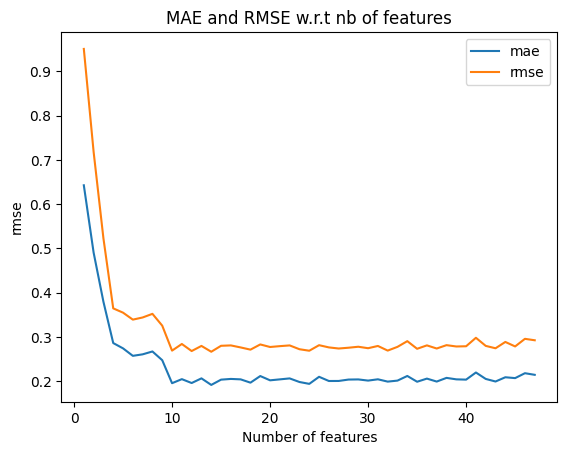

In [ ]:
def show_chart(df,metric):
    temp_1 = df[metric].tolist()
    temp_2 = list(range(1,(len(temp_1) + 1)))
    plt.xlabel("Number of features")
    plt.ylabel(metric)
    plt.title('MAE and RMSE w.r.t nb of features')
    plt.plot(temp_2, temp_1, label=metric)
    plt.savefig(f'{feature_selection_type}-accuracy.png')
    plt.legend()

show_chart(measures_df,'mae')
show_chart(measures_df,'rmse')

##**Method : BORUTA SHAP**

###**Boruta Algorithm**

In [ ]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, IsolationForest
from sklearn.datasets import load_breast_cancer, load_diabetes
from statsmodels.stats.multitest import multipletests
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.inspection import permutation_importance
from scipy.sparse import issparse
from scipy.stats import binom_test, ks_2samp
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import random
import pandas as pd
import numpy as np
from numpy.random import choice
import seaborn as sns
import shap
import os
import re

import warnings
warnings.filterwarnings("ignore")


class BorutaShap:

    """
    BorutaShap is a wrapper feature selection method built on the foundations of both the SHAP and Boruta algorithms.

    """

    def __init__(self, model=None, importance_measure='Shap',
                classification=True, percentile=100, pvalue=0.05):

        """
        Parameters
        ----------
        model: Model Object
            If no model specified then a base Random Forest will be returned otherwise the specifed model will
            be returned.

        importance_measure: String
            Which importance measure too use either Shap or Gini/Gain

        classification: Boolean
            if true then the problem is either a binary or multiclass problem otherwise if false then it is regression

        percentile: Int
            An integer ranging from 0-100 it changes the value of the max shadow importance values. Thus, lowering its value
            would make the algorithm more lenient.

        p_value: float
            A float used as a significance level again if the p-value is increased the algorithm will be more lenient making it smaller
            would make it more strict also by making the model more strict could impact runtime making it slower. As it will be less likley
            to reject and accept features.

        """

        self.importance_measure = importance_measure
        self.percentile = percentile
        self.pvalue = pvalue
        self.classification = classification
        self.model = model
        self.check_model()

    @classmethod
    def _get_param_names(cls):
        """Get parameter names for the estimator"""
        # fetch the constructor or the original constructor before
        # deprecation wrapping if any
        init = getattr(cls.__init__, "deprecated_original", cls.__init__)
        if init is object.__init__:
            # No explicit constructor to introspect
            return []

        # introspect the constructor arguments to find the model parameters
        # to represent
        init_signature = inspect.signature(init)
        # Consider the constructor parameters excluding 'self'
        parameters = [
            p
            for p in init_signature.parameters.values()
            if p.name != "self" and p.kind != p.VAR_KEYWORD
        ]
        for p in parameters:
            if p.kind == p.VAR_POSITIONAL:
                raise RuntimeError(
                    "scikit-learn estimators should always "
                    "specify their parameters in the signature"
                    " of their __init__ (no varargs)."
                    " %s with constructor %s doesn't "
                    " follow this convention." % (cls, init_signature)
                )
        # Extract and sort argument names excluding 'self'
        return sorted([p.name for p in parameters])

    def get_params(self, deep=True):
        """
        Get parameters for this estimator.
        Parameters
        ----------
        deep : bool, default=True
            If True, will return the parameters for this estimator and
            contained subobjects that are estimators.
        Returns
        -------
        params : dict
            Parameter names mapped to their values.
        """
        out = dict()
        for key in self._get_param_names():
            value = getattr(self, key)
            if deep and hasattr(value, "get_params") and not isinstance(value, type):
                deep_items = value.get_params().items()
                out.update((key + "__" + k, val) for k, val in deep_items)
            out[key] = value
        return out

    def set_params(self, **params):
        """Set the parameters of this estimator.
        The method works on simple estimators as well as on nested objects
        (such as :class:`~sklearn.pipeline.Pipeline`). The latter have
        parameters of the form ``<component>__<parameter>`` so that it's
        possible to update each component of a nested object.
        Parameters
        ----------
        **params : dict
            Estimator parameters.
        Returns
        -------
        self : estimator instance
            Estimator instance.
        """
        if not params:
            # Simple optimization to gain speed (inspect is slow)
            return self
        valid_params = self.get_params(deep=True)

        nested_params = defaultdict(dict)  # grouped by prefix
        for key, value in params.items():
            key, delim, sub_key = key.partition("__")
            if key not in valid_params:
                local_valid_params = self._get_param_names()
                raise ValueError(
                    f"Invalid parameter {key!r} for estimator {self}. "
                    f"Valid parameters are: {local_valid_params!r}."
                )

            if delim:
                nested_params[key][sub_key] = value
            else:
                setattr(self, key, value)
                valid_params[key] = value

        for key, sub_params in nested_params.items():
            valid_params[key].set_params(**sub_params)

        return


    def check_model(self):

        """
        Checks that a model object has been passed as a parameter when intiializing the BorutaShap class.

        Returns
        -------
        Model Object
            If no model specified then a base Random Forest will be returned otherwise the specifed model will
            be returned.

        Raises
        ------
        AttirbuteError
             If the model object does not have the required attributes.

        """

        check_fit = hasattr(self.model, 'fit')
        check_predict_proba = hasattr(self.model, 'predict')

        try:
            check_feature_importance = hasattr(self.model, 'feature_importances_')

        except:
            check_feature_importance = True


        if self.model is None:

            if self.classification:
                self.model = RandomForestClassifier()
            else:
                self.model = RandomForestRegressor()

        elif check_fit is False and check_predict_proba is False:
            raise AttributeError('Model must contain both the fit() and predict() methods')

        elif check_feature_importance is False and self.importance_measure == 'gini':
            raise AttributeError('Model must contain the feature_importances_ method to use Gini try Shap instead')

        else:
            pass


    def check_X(self):

        """
        Checks that the data passed to the BorutaShap instance is a pandas Dataframe

        Returns
        -------
        Datframe

        Raises
        ------
        AttirbuteError
             If the data is not of the expected type.

        """

        if isinstance(self.X, pd.DataFrame) is False:
            raise AttributeError('X must be a pandas Dataframe')

        else:
            pass


    def missing_values_y(self):

        """
        Checks for missing values in target variable.

        Returns
        -------
        Boolean

        Raises
        ------
        AttirbuteError
             If data is not in the expected format.

        """

        if isinstance(self.y, pd.Series) or isinstance(self.y, pd.DataFrame):
            return self.y.isnull().any().any()

        elif isinstance(self.y, np.ndarray):
            return np.isnan(self.y).any()

        else:
            raise AttributeError('Y must be a pandas Dataframe, Series, or a numpy array')


    def check_missing_values(self):

        """
        Checks for missing values in the data.

        Returns
        -------
        Boolean

        Raises
        ------
        AttirbuteError
             If there are missing values present.

        """

        X_missing = self.X.isnull().any().any()
        Y_missing = self.missing_values_y()

        models_to_check = ('xgb', 'catboost', 'lgbm', 'lightgbm')

        model_name = str(type(self.model)).lower()
        if X_missing or Y_missing:

            if any([x in model_name for x in models_to_check]):
                print('Warning there are missing values in your data !')

            else:
                raise ValueError('There are missing values in your Data')

        else:
            pass


    def Check_if_chose_train_or_test_and_train_model(self):

        """
        Decides to fit the model to either the training data or the test/unseen data a great discussion on the
        differences can be found here.

        https://slds-lmu.github.io/iml_methods_limitations/pfi-data.html

        """
        if self.stratify is not None and not self.classification:
            raise ValueError('Cannot take a strtified sample from continuous variable please bucket the variable and try again !')


        if self.train_or_test.lower() == 'test':
            # keeping the same naming convenetion as to not add complexit later on
            self.X_boruta_train, self.X_boruta_test, self.y_train, self.y_test, self.w_train, self.w_test = train_test_split(self.X_boruta,
                                                                                                                                self.y,
                                                                                                                                self.sample_weight,
                                                                                                                                test_size=0.3,
                                                                                                                                random_state=self.random_state,
                                                                                                                                stratify=self.stratify)
            self.Train_model(self.X_boruta_train, self.y_train, sample_weight = self.w_train)

        elif self.train_or_test.lower() == 'train':
            # model will be trained and evaluated on the same data
            self.Train_model(self.X_boruta, self.y, sample_weight = self.sample_weight)

        else:
            raise ValueError('The train_or_test parameter can only be "train" or "test"')



    def Train_model(self, X, y, sample_weight = None):

        """
        Trains Model also checks to see if the model is an instance of catboost as it needs extra parameters
        also the try except is for models with a verbose statement

        Parameters
        ----------
        X: Dataframe
            A pandas dataframe of the features.

        y: Series/ndarray
            A pandas series or numpy ndarray of the target

        sample_weight: Series/ndarray
            A pandas series or numpy ndarray of the sample weights

        Returns
        ----------
        fitted model object

        """

        if 'catboost' in str(type(self.model)).lower():
            self.model.fit(X, y, sample_weight = sample_weight, cat_features = self.X_categorical,  verbose=False)

        else:

            try:
                self.model.fit(X, y, sample_weight = sample_weight, verbose=False)

            except:
                self.model.fit(X, y, sample_weight = sample_weight)




    def fit(self, X, y, sample_weight = None, n_trials = 20, random_state=0, sample=False,
            train_or_test = 'test', normalize=True, verbose=True, stratify=None):

        """
        The main body of the program this method it computes the following

        1. Extend the information system by adding copies of all variables (the information system
        is always extended by at least 5 shadow attributes, even if the number of attributes in
        the original set is lower than 5).

        2. Shuffle the added attributes to remove their correlations with the response.

        3. Run a random forest classifier on the extended information system and gather the
        Z scores computed.

        4. Find the maximum Z score among shadow attributes (MZSA), and then assign a hit to
        every attribute that scored better than MZSA.

        5. For each attribute with undetermined importance perform a two-sided test of equality
        with the MZSA.

        6. Deem the attributes which have importance significantly lower than MZSA as ‘unimportant’
        and permanently remove them from the information system.

        7. Deem the attributes which have importance significantly higher than MZSA as ‘important’.

        8. Remove all shadow attributes.

        9. Repeat the procedure until the importance is assigned for all the attributes, or the
        algorithm has reached the previously set limit of the random forest runs.

        10. Stores results.

        Parameters
        ----------
        X: Dataframe
            A pandas dataframe of the features.

        y: Series/ndarray
            A pandas series or numpy ndarray of the target

        sample_weight: Series/ndarray
            A pandas series or numpy ndarray of the sample weight of the observations (optional)

        random_state: int
            A random state for reproducibility of results

        Sample: Boolean
            if true then a rowise sample of the data will be used to calculate the feature importance values

        sample_fraction: float
            The sample fraction of the original data used in calculating the feature importance values only
            used if Sample==True.

        train_or_test: string
            Decides whether the feature importance should be calculated on out of sample data see the dicussion here.
            https://compstat-lmu.github.io/iml_methods_limitations/pfi-data.html#introduction-to-test-vs.training-data

        normalize: boolean
            if true the importance values will be normalized using the z-score formula

        verbose: Boolean
            a flag indicator to print out all the rejected or accepted features.

        stratify: array
            allows the train test splits to be stratified based on given values.

        """

        if sample_weight is None:
            sample_weight = np.ones(len(X))
        np.random.seed(random_state)
        self.starting_X = X.copy()
        self.X = X.copy()
        self.y = y.copy()
        self.sample_weight = sample_weight.copy()
        self.n_trials = n_trials
        self.random_state = random_state
        self.ncols = self.X.shape[1]
        self.all_columns = self.X.columns.to_numpy()
        self.rejected_columns = []
        self.accepted_columns = []

        self.check_X()
        self.check_missing_values()
        self.sample = sample
        self.train_or_test = train_or_test
        self.stratify = stratify

        self.features_to_remove = []
        self.hits  = np.zeros(self.ncols)
        self.order = self.create_mapping_between_cols_and_indices()
        self.create_importance_history()

        if self.sample: self.preds = self.isolation_forest(self.X, self.sample_weight)

        for trial in tqdm(range(self.n_trials)):

            self.remove_features_if_rejected()
            self.columns = self.X.columns.to_numpy()
            self.create_shadow_features()

            # early stopping
            if self.X.shape[1] == 0:
                break

            else:

                self.Check_if_chose_train_or_test_and_train_model()

                self.X_feature_import, self.Shadow_feature_import = self.feature_importance(normalize=normalize)
                self.update_importance_history()
                hits = self.calculate_hits()
                self.hits += hits
                self.history_hits = np.vstack((self.history_hits, self.hits))
                self.test_features(iteration=trial+1)

        self.store_feature_importance()
        self.calculate_rejected_accepted_tentative(verbose=verbose)

    def transform(self, X):
        return self.Subset(self)

    def calculate_rejected_accepted_tentative(self, verbose):

        """
        Figures out which features have been either accepted rejeected or tentative

        Returns
        -------
        3 lists

        """

        self.rejected  = list(set(self.flatten_list(self.rejected_columns))-set(self.flatten_list(self.accepted_columns)))
        self.accepted  = list(set(self.flatten_list(self.accepted_columns)))
        self.tentative = list(set(self.all_columns) - set(self.rejected + self.accepted))

        if verbose:
            print(str(len(self.accepted))  + ' attributes confirmed important: ' + str(self.accepted))
            print(str(len(self.rejected))  + ' attributes confirmed unimportant: ' + str(self.rejected))
            print(str(len(self.tentative)) + ' tentative attributes remains: ' + str(self.tentative))



    def create_importance_history(self):

        """
        Creates a dataframe object to store historical feature importance scores.

        Returns
        -------
        Datframe

        """

        self.history_shadow = np.zeros(self.ncols)
        self.history_x = np.zeros(self.ncols)
        self.history_hits = np.zeros(self.ncols)


    def update_importance_history(self):

        """
        At each iteration update the datframe object that stores the historical feature importance scores.

        Returns
        -------
        Datframe

        """

        padded_history_shadow  = np.full((self.ncols), np.NaN)
        padded_history_x = np.full((self.ncols), np.NaN)

        for (index, col) in enumerate(self.columns):
            map_index = self.order[col]
            padded_history_shadow[map_index] = self.Shadow_feature_import[index]
            padded_history_x[map_index] = self.X_feature_import[index]

        self.history_shadow = np.vstack((self.history_shadow, padded_history_shadow))
        self.history_x = np.vstack((self.history_x, padded_history_x))



    def store_feature_importance(self):

        """
        Reshapes the columns in the historical feature importance scores object also adds the mean, median, max, min
        shadow feature scores.

        Returns
        -------
        Datframe

        """

        self.history_x = pd.DataFrame(data=self.history_x,
                                 columns=self.all_columns)


        self.history_x['Max_Shadow']    =  [max(i) for i in self.history_shadow]
        self.history_x['Min_Shadow']    =  [min(i) for i in self.history_shadow]
        self.history_x['Mean_Shadow']   =  [np.nanmean(i) for i in self.history_shadow]
        self.history_x['Median_Shadow'] =  [np.nanmedian(i) for i in self.history_shadow]


    def results_to_csv(self, filename='feature_importance'):

        """
        Saves the historical feature importance scores to csv.

        Parameters
        ----------
        filname : string
            used as the name for the outputed file.

        Returns
        -------
        comma delimnated file

        """

        features = pd.DataFrame(data={'Features':self.history_x.iloc[1:].columns.values,
        'Average Feature Importance':self.history_x.iloc[1:].mean(axis=0).values,
        'Standard Deviation Importance':self.history_x.iloc[1:].std(axis=0).values})

        decision_mapper = self.create_mapping_of_features_to_attribute(maps=['Tentative','Rejected','Accepted', 'Shadow'])
        features['Decision'] = features['Features'].map(decision_mapper)
        features = features.sort_values(by='Average Feature Importance',ascending=False)

        features.to_csv(filename + '.csv', index=False)


    def remove_features_if_rejected(self):

        """
        At each iteration if a feature has been rejected by the algorithm remove it from the process

        """

        if len(self.features_to_remove) != 0:
            for feature in self.features_to_remove:
                try:
                    self.X.drop(feature, axis = 1, inplace=True)
                except:
                    pass

        else:
            pass


    @staticmethod
    def average_of_list(lst):
        return sum(lst) / len(lst)

    @staticmethod
    def flatten_list(array):
        return [item for sublist in array for item in sublist]


    def create_mapping_between_cols_and_indices(self):
        return dict(zip(self.X.columns.to_list(), np.arange(self.X.shape[1])))


    def calculate_hits(self):

        """
        If a features importance is greater than the maximum importance value of all the random shadow
        features then we assign it a hit.

        Parameters
        ----------
        Percentile : value ranging from 0-1
            can be used to reduce value of the maximum value of the shadow features making the algorithm
            more lenient.

        """

        shadow_threshold = np.percentile(self.Shadow_feature_import,
                                        self.percentile)

        padded_hits = np.zeros(self.ncols)
        hits = self.X_feature_import > shadow_threshold

        for (index, col) in enumerate(self.columns):
            map_index = self.order[col]
            padded_hits[map_index] += hits[index]

        return padded_hits


    def create_shadow_features(self):
        """
        Creates the random shadow features by shuffling the existing columns.

        Returns:
            Datframe with random permutations of the original columns.
        """
        self.X_shadow = self.X.apply(np.random.permutation)

        if isinstance(self.X_shadow, pd.DataFrame):
            # append
            obj_col = self.X_shadow.select_dtypes("object").columns.tolist()
            if obj_col ==[] :
                 pass
            else :
                 self.X_shadow[obj_col] =self.X_shadow[obj_col].astype("category")

        self.X_shadow.columns = ['shadow_' + feature for feature in self.X.columns]
        self.X_boruta = pd.concat([self.X, self.X_shadow], axis = 1)

        col_types = self.X_boruta.dtypes
        self.X_categorical = list(col_types[(col_types=='category' ) | (col_types=='object')].index)


    @staticmethod
    def calculate_Zscore(array):
        """
        Calculates the Z-score of an array

        Parameters
         ----------
        array: array_like

        Returns:
            normalised array
        """
        mean_value = np.mean(array)
        std_value  = np.std(array)
        return [(element-mean_value)/std_value for element in array]


    def feature_importance(self, normalize):

        """
        Caculates the feature importances scores of the model

        Parameters
        ----------
        importance_measure: string
            allows the user to choose either the Shap or Gini importance metrics

        normalize: boolean
            if true the importance values will be normalized using the z-score formula

        Returns:
            array of normalized feature importance scores for both the shadow and original features.

        Raise
        ----------
            ValueError:
                If no Importance measure was specified
        """

        if self.importance_measure == 'shap':

            self.explain()
            vals = self.shap_values

            if normalize:
                vals = self.calculate_Zscore(vals)

            X_feature_import = vals[:len(self.X.columns)]
            Shadow_feature_import = vals[len(self.X_shadow.columns):]

        elif self.importance_measure == 'perm':

            # set default scoring as f1, can be changed to an argument for customizability
            perm_importances_ =  permutation_importance(self.model, self.X, self.y, scoring='f1')
            perm_importances_ = perm_importance.importances_mean

            if normalize:
                perm_importances_ = self.calculate_Zscore(perm_importances_)

            X_feature_import = perm_importances_[:len(self.X.columns)]
            Shadow_feature_import = perm_importances_[len(self.X.columns):]

        elif self.importance_measure == 'gini':

                feature_importances_ =  np.abs(self.model.feature_importances_)

                if normalize:
                    feature_importances_ = self.calculate_Zscore(feature_importances_)

                X_feature_import = feature_importances_[:len(self.X.columns)]
                Shadow_feature_import = feature_importances_[len(self.X.columns):]

        else:

            raise ValueError('No Importance_measure was specified select one of (shap, perm, gini)')


        return X_feature_import, Shadow_feature_import


    @staticmethod
    def isolation_forest(X, sample_weight):
        '''
        fits isloation forest to the dataset and gives an anomally score to every sample
        '''
        clf = IsolationForest().fit(X, sample_weight = sample_weight)
        preds = clf.score_samples(X)
        return preds


    @staticmethod
    def get_5_percent(num):
        return round(5  / 100 * num)


    def get_5_percent_splits(self, length):
        '''
        splits dataframe into 5% intervals
        '''
        five_percent = self.get_5_percent(length)
        return np.arange(five_percent,length,five_percent)



    def find_sample(self):
        '''
        Finds a sample by comparing the distributions of the anomally scores between the sample and the original
        distribution using the KS-test. Starts of a 5% howver will increase to 10% and then 15% etc. if a significant sample can not be found
        '''
        loop = True
        iteration = 0
        size = self.get_5_percent_splits(self.X.shape[0])
        element = 1
        while loop:

            sample_indices = choice(np.arange(self.preds.size),  size=size[element], replace=False)
            sample = np.take(self.preds, sample_indices)
            if ks_2samp(self.preds, sample).pvalue > 0.95:
                break

            iteration+=1

            if iteration == 20:
                element  += 1
                iteration = 0


        return self.X_boruta.iloc[sample_indices]



    def explain(self):

        """
        The shap package has numerous variants of explainers which use different assumptions depending on the model
        type this function allows the user to choose explainer

        Returns:
            shap values

        Raise
        ----------
            ValueError:
                if no model type has been specified tree as default
        """


        explainer = shap.TreeExplainer(self.model,
                                       feature_perturbation = "tree_path_dependent",
                                       approximate = True)


        if self.sample:


            if self.classification:
                # for some reason shap returns values wraped in a list of length 1

                self.shap_values = np.array(explainer.shap_values(self.find_sample()))
                if isinstance(self.shap_values, list):

                    class_inds = range(len(self.shap_values))
                    shap_imp = np.zeros(self.shap_values[0].shape[1])
                    for i, ind in enumerate(class_inds):
                        shap_imp += np.abs(self.shap_values[ind]).mean(0)
                    self.shap_values /= len(self.shap_values)

                elif len(self.shap_values.shape) == 3:
                    self.shap_values = np.abs(self.shap_values).sum(axis=0)
                    self.shap_values = self.shap_values.mean(0)

                else:
                    self.shap_values = np.abs(self.shap_values).mean(0)

            else:
                self.shap_values = explainer.shap_values(self.find_sample())
                self.shap_values = np.abs(self.shap_values).mean(0)

        else:

            if self.classification:
                # for some reason shap returns values wraped in a list of length 1
                self.shap_values = np.array(explainer.shap_values(self.X_boruta))
                if isinstance(self.shap_values, list):

                    class_inds = range(len(self.shap_values))
                    shap_imp = np.zeros(self.shap_values[0].shape[1])
                    for i, ind in enumerate(class_inds):
                        shap_imp += np.abs(self.shap_values[ind]).mean(0)
                    self.shap_values /= len(self.shap_values)

                elif len(self.shap_values.shape) == 3:
                    self.shap_values = np.abs(self.shap_values).sum(axis=0)
                    self.shap_values = self.shap_values.mean(0)

                else:
                    self.shap_values = np.abs(self.shap_values).mean(0)

            else:
                self.shap_values = explainer.shap_values(self.X_boruta)
                self.shap_values = np.abs(self.shap_values).mean(0)



    @staticmethod
    def binomial_H0_test(array, n, p, alternative):
        """
        Perform a test that the probability of success is p.
        This is an exact, two-sided test of the null hypothesis
        that the probability of success in a Bernoulli experiment is p
        """
        return [binom_test(x, n=n, p=p, alternative=alternative) for x in array]


    @staticmethod
    def symetric_difference_between_two_arrays(array_one, array_two):
        set_one = set(array_one)
        set_two = set(array_two)
        return np.array(list(set_one.symmetric_difference(set_two)))


    @staticmethod
    def find_index_of_true_in_array(array):
        length = len(array)
        return list(filter(lambda x: array[x], range(length)))


    @staticmethod
    def bonferoni_corrections(pvals, alpha=0.05, n_tests=None):
        """
        used to counteract the problem of multiple comparisons.
        """
        pvals = np.array(pvals)

        if n_tests is None:
            n_tests = len(pvals)
        else:
            pass

        alphacBon = alpha / float(n_tests)
        reject = pvals <= alphacBon
        pvals_corrected = pvals * float(n_tests)
        return reject, pvals_corrected


    def test_features(self, iteration):

        """
        For each feature with an undetermined importance perform a two-sided test of equality
        with the maximum shadow value to determine if it is statistcally better

        Parameters
        ----------
        hits: an array which holds the history of the number times
              this feature was better than the maximum shadow

        Returns:
            Two arrays of the names of the accepted and rejected columns at that instance
        """

        acceptance_p_values = self.binomial_H0_test(self.hits,
                                                    n=iteration,
                                                    p=0.5,
                                                    alternative='greater')

        regect_p_values = self.binomial_H0_test(self.hits,
                                                n=iteration,
                                                p=0.5,
                                                alternative='less')

        # [1] as function returns a tuple
        modified_acceptance_p_values = self.bonferoni_corrections(acceptance_p_values,
                                                                  alpha=0.05,
                                                                  n_tests=len(self.columns))[1]

        modified_regect_p_values = self.bonferoni_corrections(regect_p_values,
                                                              alpha=0.05,
                                                              n_tests=len(self.columns))[1]

        # Take the inverse as we want true to keep featrues
        rejected_columns = np.array(modified_regect_p_values) < self.pvalue
        accepted_columns = np.array(modified_acceptance_p_values) < self.pvalue

        rejected_indices = self.find_index_of_true_in_array(rejected_columns)
        accepted_indices = self.find_index_of_true_in_array(accepted_columns)

        rejected_features = self.all_columns[rejected_indices]
        accepted_features = self.all_columns[accepted_indices]


        self.features_to_remove = rejected_features


        self.rejected_columns.append(rejected_features)
        self.accepted_columns.append(accepted_features)


    def TentativeRoughFix(self):

        """
        Sometimes no matter how many iterations are run a feature may neither be rejected or
        accepted. This method is used in this case to make a decision on a tentative feature
        by comparing its median importance value with the median max shadow value.

        Parameters
        ----------
        tentative: an array which holds the names of the tentative attiributes.

        Returns:
            Two arrays of the names of the final decision of the accepted and rejected columns.

        """

        median_tentaive_values = self.history_x[self.tentative].median(axis=0).values
        median_max_shadow = self.history_x['Max_Shadow'].median(axis=0)


        filtered = median_tentaive_values > median_max_shadow

        self.tentative = np.array(self.tentative)
        newly_accepted = self.tentative[filtered]

        if len(newly_accepted) < 1:
            newly_rejected = self.tentative

        else:
            newly_rejected = self.symetric_difference_between_two_arrays(newly_accepted, self.tentative)

        print(str(len(newly_accepted)) + ' tentative features are now accepted: ' + str(newly_accepted))
        print(str(len(newly_rejected)) + ' tentative features are now rejected: ' + str(newly_rejected))

        self.rejected = self.rejected + newly_rejected.tolist()
        self.accepted = self.accepted + newly_accepted.tolist()



    def Subset(self, tentative=False):
        """
        Returns the subset of desired features
        """
        if tentative:
            return self.starting_X[self.accepted + self.tentative.tolist()]
        else:
            return self.starting_X[self.accepted]


    @staticmethod
    def create_list(array, color):
        colors = [color for x in range(len(array))]
        return colors

    @staticmethod
    def filter_data(data, column, value):
        data = data.copy()
        return data.loc[(data[column] == value) | (data[column] == 'Shadow')]


    @staticmethod
    def hasNumbers(inputString):
        return any(char.isdigit() for char in inputString)


    @staticmethod
    def check_if_which_features_is_correct(my_string):

        my_string = str(my_string).lower()
        if my_string in ['tentative','rejected','accepted','all']:
            pass

        else:
            raise ValueError(my_string + " is not a valid value did you mean to type 'all', 'tentative', 'accepted' or 'rejected' ?")



    def plot(self, X_rotation=90, X_size=8, figsize=(12,8),
            y_scale='log', which_features='all', display=True):

        """
        creates a boxplot of the feature importances

        Parameters
        ----------
        X_rotation: int
            Controls the orientation angle of the tick labels on the X-axis

        X_size: int
            Controls the font size of the tick labels

        y_scale: string
            Log transform of the y axis scale as hard to see the plot as it is normally dominated by two or three
            features.

        which_features: string
            Despite efforts if the number of columns is large the plot becomes cluttered so this parameter allows you to
            select subsets of the features like the accepted, rejected or tentative features default is all.

        Display: Boolean
        controls if the output is displayed or not, set to false when running test scripts

        """
        # data from wide to long
        data = self.history_x.iloc[1:]
        data['index'] = data.index
        data = pd.melt(data, id_vars='index', var_name='Methods')

        decision_mapper = self.create_mapping_of_features_to_attribute(maps=['Tentative','Rejected','Accepted', 'Shadow'])
        data['Decision'] = data['Methods'].map(decision_mapper)
        data.drop(['index'], axis=1, inplace=True)


        options = { 'accepted' : self.filter_data(data,'Decision', 'Accepted'),
                    'tentative': self.filter_data(data,'Decision', 'Tentative'),
                    'rejected' : self.filter_data(data,'Decision', 'Rejected'),
                    'all' : data
                    }

        self.check_if_which_features_is_correct(which_features)
        data = options[which_features.lower()]

        self.box_plot(data=data,
                      X_rotation=X_rotation,
                      X_size=X_size,
                      y_scale=y_scale,
                      figsize=figsize)
        if display:
            plt.show()
        else:
            plt.close()


    def box_plot(self, data, X_rotation, X_size, y_scale, figsize):

        if y_scale=='log':
            minimum = data['value'].min()
            if minimum <= 0:
                data['value'] += abs(minimum) + 0.01

        order = data.groupby(by=["Methods"])["value"].mean().sort_values(ascending=False).index
        my_palette = self.create_mapping_of_features_to_attribute(maps= ['yellow','red','green','blue'])

        # Use a color palette
        plt.figure(figsize=figsize)
        ax = sns.boxplot(x=data["Methods"], y=data["value"],
                        order=order, palette=my_palette)

        if y_scale == 'log':ax.set(yscale="log")
        ax.set_xticklabels(ax.get_xticklabels(), rotation=X_rotation, size=X_size)
        ax.set_title('Feature Importance')
        ax.set_ylabel('Z-Score')
        ax.set_xlabel('Features')


    def create_mapping_of_features_to_attribute(self, maps = []):

        rejected = list(self.rejected)
        tentative = list(self.tentative)
        accepted = list(self.accepted)
        shadow = ['Max_Shadow','Median_Shadow','Min_Shadow','Mean_Shadow']

        tentative_map = self.create_list(tentative, maps[0])
        rejected_map  = self.create_list(rejected, maps[1])
        accepted_map  = self.create_list(accepted, maps[2])
        shadow_map = self.create_list(shadow, maps[3])

        values = tentative_map + rejected_map + accepted_map + shadow_map
        keys = tentative + rejected + accepted + shadow

        return self.to_dictionary(keys, values)


    @staticmethod
    def to_dictionary(list_one, list_two):
        return dict(zip(list_one, list_two))



def load_data(data_type='classification'):

    """
    Load Example datasets for the user to try out the package
    """

    data_type = data_type.lower()

    if data_type == 'classification':
        cancer = load_breast_cancer()
        X = pd.DataFrame(np.c_[cancer['data'], cancer['target']], columns = np.append(cancer['feature_names'], ['target']))
        y = X.pop('target')

    elif data_type == 'regression':
        diabetes = load_diabetes()
        X = pd.DataFrame(np.c_[diabetes['data'], diabetes['target']], columns = np.append(diabetes['feature_names'], ['target']))
        y = X.pop('target')

    else:
        raise ValueError("No data_type was specified, use either 'classification' or 'regression'")


    return X, y

###**XGB**

In [ ]:
 Feature_Selector = BorutaShap(model=xgb,
                                  importance_measure='shap',
                                  classification=False)

 Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, sample=False,
            	     train_or_test = 'test', normalize=True,
		     verbose=True)

TypeError: ignored

In [ ]:
selected_features_xgb=['Mean Right Hand Links Traffic Load', 'Mean Links Lengths', 'Lightpath Lengths', 'Ligthpath Total Traffic Load', 'Root Mean Square Link Powers', 'Modulation Format Level', 'Max Links Lengths', 'Left Hand Lihthpath Idle Neighbours', 'Mean Spans Lengths', 'Max Spans Lengths', 'Right Hand Lihthpath Traffic Load', 'STD Spans Lengths']

params_xgb ={'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror', 'subsample': 0.8,'reg_alpha':0.1,'reg_lambda':0.1,'gamma':0.2}
# selected_features_xgb=['Modulation Format Level', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths',
#                        'Min Links Lengths', 'Lightpath Lengths', 'Root Mean Square Link Powers','Right Hand Lihthpath Traffic Load', 'Mean Right Hand Links Traffic Load']
train_prepared_model (selected_features_xgb,params_xgb,'xgb',f'Boruta for XGB')

total_splits: 2556


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CAT Boost Regressor,0.276,0.203,0.998,47,28.234585,2.195,56.813,0.479,32860
1,XGB,0.283,0.210,0.998,47,4.833756,0.563,13.628,0.468,5359
2,Boruta for XGB,0.285,0.212,0.998,12,4.867596,1.047,58.249,0.474,2556
3,Boruta shaphypetune for XGB,0.282,0.209,0.998,13,6.565681,0.720,31.143,0.484,2794
4,Boruta for XGB,0.285,0.212,0.998,12,6.592436,0.541,8.300,0.473,2556


###**Catboost**

In [ ]:
 Feature_Selector = BorutaShap(model=cbr,
                                  importance_measure='shap',
                                  classification=False)

 Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, sample=False,
            	     train_or_test = 'test', normalize=True,
		     verbose=True)

  0%|          | 0/100 [00:00<?, ?it/s]

33 attributes confirmed important: ['Ligthpath Total Traffic Load', 'Mean Spans Lengths', 'STD Right Hand Links Idle Neighbours', 'Root Mean Square Link Powers', 'Modulation Format Level', 'Max Link Powers', 'Lightpath Span Number', 'STD Spans Lengths', 'Right Hand Lihthpath Traffic Load', 'Min Link Powers', 'Lightpath Lengths', 'STD Link Powers', 'STD Right Hand Likns Traffic Load', 'Link Number', 'Min Left Hand Links Traffic Load', 'Max Right Hand Links Traffic Load', 'Mean Span Number per Link', 'Max Span Number per Link', 'Max Left Hand Links Idle Neighbours', 'Mean Right Hand Links Idle Neighbours', 'Max Spans Lengths', 'Mean Link Powers', 'Left Hand Lihthpath Traffic Load', 'Mean Links Lengths', 'STD Left Hand Likns Traffic Load', 'STD Span Number per Link', 'Min Right Hand Links Traffic Load', 'Min Links Lengths', 'STD Links Lengths', 'Min Spans Lengths', 'Mean Right Hand Links Traffic Load', 'Max Links Lengths', 'STD Left Hand Links Idle Neighbours']
14 attributes confirmed uni

In [ ]:
selected_features=['Ligthpath Total Traffic Load', 'Mean Spans Lengths', 'STD Right Hand Links Idle Neighbours', 'Root Mean Square Link Powers', 'Modulation Format Level', 'Max Link Powers', 'Lightpath Span Number', 'STD Spans Lengths', 'Right Hand Lihthpath Traffic Load', 'Min Link Powers', 'Lightpath Lengths', 'STD Link Powers', 'STD Right Hand Likns Traffic Load', 'Link Number', 'Min Left Hand Links Traffic Load', 'Max Right Hand Links Traffic Load', 'Mean Span Number per Link', 'Max Span Number per Link', 'Max Left Hand Links Idle Neighbours', 'Mean Right Hand Links Idle Neighbours', 'Max Spans Lengths', 'Mean Link Powers', 'Left Hand Lihthpath Traffic Load', 'Mean Links Lengths', 'STD Left Hand Likns Traffic Load', 'STD Span Number per Link', 'Min Right Hand Links Traffic Load', 'Min Links Lengths', 'STD Links Lengths', 'Min Spans Lengths', 'Mean Right Hand Links Traffic Load', 'Max Links Lengths', 'STD Left Hand Links Idle Neighbours']
train_selected_features_with_hypertuning(selected_features,f'Boruta Catboost',model='cbr')
get_results()

Streaming output truncated to the last 5000 lines.
2:	learn: 4.6748427	total: 54.3ms	remaining: 18.1s
3:	learn: 4.2404601	total: 70ms	remaining: 17.4s
4:	learn: 3.8604960	total: 75.9ms	remaining: 15.1s
5:	learn: 3.5041767	total: 92ms	remaining: 15.2s
6:	learn: 3.1915886	total: 107ms	remaining: 15.1s
7:	learn: 2.8972804	total: 122ms	remaining: 15.2s
8:	learn: 2.6366819	total: 138ms	remaining: 15.2s
9:	learn: 2.4053947	total: 154ms	remaining: 15.2s
10:	learn: 2.1906845	total: 169ms	remaining: 15.2s
11:	learn: 1.9935598	total: 185ms	remaining: 15.2s
12:	learn: 1.8195828	total: 200ms	remaining: 15.2s
13:	learn: 1.6652188	total: 215ms	remaining: 15.2s
14:	learn: 1.5270639	total: 239ms	remaining: 15.7s
15:	learn: 1.4051876	total: 255ms	remaining: 15.7s
16:	learn: 1.2946766	total: 271ms	remaining: 15.7s
17:	learn: 1.1906643	total: 290ms	remaining: 15.8s
18:	learn: 1.0957637	total: 306ms	remaining: 15.8s
19:	learn: 1.0146607	total: 321ms	remaining: 15.8s
20:	learn: 0.9416963	total: 337ms	remai

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,No FS,0.283000,0.210000,0.998000,47,8.511100,0.735000,48.804000,0.465000,5359
1,PowerShap,0.279000,0.205000,0.998000,9,1.859238,0.554000,9.433000,0.490000,3062
2,Boruta,0.280000,0.206000,0.998000,13,2.775791,0.562000,9.206000,0.492000,2794
3,RFE,0.278000,0.205000,0.998000,12,4.405652,0.556000,10.319000,0.491000,4905
4,RFA,0.285000,0.209000,0.998000,27,6.251560,0.574000,5.741000,0.499000,5847
5,FS-SHAP,0.272123,0.199291,0.998139,12,3.263840,0.701028,33.367157,0.474453,5765
6,XGB,0.283000,0.210000,0.998000,47,10.961405,3.932000,67.160000,0.493000,5359
7,CAT Boost Regressor,0.276000,0.203000,0.998000,47,9.415599,0.708000,6.062000,0.459000,32860
8,Boruta Catboost,0.276000,0.202000,0.998000,33,6.646801,0.599000,5.725000,0.454000,35997


In [ ]:
selected_features_cb=['Ligthpath Total Traffic Load', 'Mean Spans Lengths', 'STD Right Hand Links Idle Neighbours', 'Root Mean Square Link Powers', 'Modulation Format Level', 'Max Link Powers', 'Lightpath Span Number', 'STD Spans Lengths', 'Right Hand Lihthpath Traffic Load', 'Min Link Powers', 'Lightpath Lengths', 'STD Link Powers', 'STD Right Hand Likns Traffic Load', 'Link Number', 'Min Left Hand Links Traffic Load', 'Max Right Hand Links Traffic Load', 'Mean Span Number per Link', 'Max Span Number per Link', 'Max Left Hand Links Idle Neighbours', 'Mean Right Hand Links Idle Neighbours', 'Max Spans Lengths', 'Mean Link Powers', 'Left Hand Lihthpath Traffic Load', 'Mean Links Lengths', 'STD Left Hand Likns Traffic Load', 'STD Span Number per Link', 'Min Right Hand Links Traffic Load', 'Min Links Lengths', 'STD Links Lengths', 'Min Spans Lengths', 'Mean Right Hand Links Traffic Load', 'Max Links Lengths', 'STD Left Hand Links Idle Neighbours']
params_cb={'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05}

train_prepared_model (selected_features_cb,params_cb,'cbr',f'Boruta for CatBoost')

##**Model FS methods (non shap related)**

###**XGB**

In [ ]:
def xgb_feature_importance(model_xgb, fnames=X_train.columns):
    b = model_xgb.get_booster()
    fs = b.get_fscore()
    all_features = [fs.get(f, 0.) for f in b.feature_names]
    all_features = np.array(all_features, dtype=np.float32)
    all_features_imp = all_features / all_features.sum()
    if fnames is not None:
        return pd.DataFrame({'X':fnames, 'IMP': all_features_imp})
    else:
        return all_features_imp.sort_values(by='IMP', ascending=False)

df_xgb=xgb_feature_importance(xgb)
sorted_df = df_xgb.sort_values(by='IMP', ascending=False)
sorted_df = sorted_df.reset_index(drop=True)
print(sorted_df)


                                        X       IMP
0                       Lightpath Lengths  0.130435
1                      Mean Spans Lengths  0.122598
2                       STD Spans Lengths  0.103191
3                       Max Spans Lengths  0.079306
4                  STD Links Traffic Load  0.049076
5                 Modulation Format Level  0.045531
6                 Mean Links Traffic Load  0.043105
7             Channel Under Test Position  0.040493
8                      Mean Links Lengths  0.033402
9       Right Hand Lihthpath Traffic Load  0.033029
10                      Max Links Lengths  0.032469
11                      Min Spans Lengths  0.032096
12       Left Hand Lihthpath Traffic Load  0.025191
13                      Min Links Lengths  0.022952
14           Ligthpath Total Traffic Load  0.022579
15     Mean Right Hand Links Traffic Load  0.021273
16                 Max Links Traffic Load  0.017914
17                 Min Links Traffic Load  0.015488
18      Min 

In [ ]:
from sklearn.model_selection import cross_val_score
model = xgb

feature_scores = []
for num_features in range(1, X_train.shape[1] + 1):
    # Select top 'num_features' based on feature importance
    top_features = np.argsort(model.fit(X_train, y_train).feature_importances_)[-num_features:]

    # Evaluate the model with cross-validation
    scores = cross_val_score(model, X_train.iloc[:, top_features], y_train, scoring='neg_mean_squared_error', cv=5)

    # Store the average cross-validation score
    feature_scores.append((-1) * np.mean(scores))

# Find the optimal number of features with the lowest MSE
optimal_num_features = np.argmin(feature_scores) + 1
print("Optimal number of features:", optimal_num_features)


Optimal number of features: 13


In [ ]:
optimal_num_features = 13

feature_importances = XGBRegressor().fit(X_train, y_train).feature_importances_
top_feature_indices = np.argsort(feature_importances)[-optimal_num_features:]

selected_feature_names = [df.columns[i] for i in top_feature_indices]

X_optimal = X.iloc[:, top_feature_indices]

X_train, X_test, y_train, y_test = train_test_split(X_optimal, y, test_size=0.2, random_state=42)
train_selected_features_with_hypertuning(selected_feature_names,f'XGB FS',model='xgb')

get_results()

Best parameters: {'gamma': 0.2, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror', 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8}
total_splits: 3284


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284


In [ ]:
xgb_params={'gamma': 0.2, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror', 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.8}
sf_xgb=[
    "Left Hand Lihthpath Traffic Load",
    "Min Right Hand Links Idle Neighbours",
    "Right Hand Lihthpath Traffic Load",
    "STD Link Powers",
    "Left Hand Lihthpath Idle Neighbours",
    "Mean Links Lengths",
    "Mean Link Powers",
    "STD Spans Lengths",
    "Mean Spans Lengths",
    "Max Links Lengths",
    "Max Spans Lengths",
    "Lightpath Lengths",
    "Modulation Format Level"
]
X_train, X_test, y_train, y_test=train_test_split(X[sf_xgb], y, test_size=0.2, random_state=42)

train_prepared_model(sf_xgb,xgb_params,'xgb',f'fs for XGB')
get_results()

total_splits: 3284


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284


###**Catboost**

In [ ]:
from sklearn.model_selection import cross_val_score
model = cbr

feature_scores = []
for num_features in range(1, X_train.shape[1] + 1):
    top_features = np.argsort(model.fit(X_train, y_train).feature_importances_)[-num_features:]
    scores = cross_val_score(model, X_train.iloc[:, top_features], y_train, scoring='neg_mean_squared_error', cv=5)
    feature_scores.append((-1) * np.mean(scores))

optimal_num_features = np.argmin(feature_scores) + 1
print("Optimal number of features:", optimal_num_features)


Streaming output truncated to the last 5000 lines.
1:	learn: 5.7165723	total: 14.8ms	remaining: 7.37s
2:	learn: 5.4607920	total: 22.1ms	remaining: 7.34s
3:	learn: 5.2124442	total: 29.2ms	remaining: 7.26s
4:	learn: 4.9786131	total: 36.3ms	remaining: 7.22s
5:	learn: 4.7488919	total: 43.1ms	remaining: 7.13s
6:	learn: 4.5322311	total: 50.1ms	remaining: 7.1s
7:	learn: 4.3407117	total: 57.1ms	remaining: 7.08s
8:	learn: 4.1405143	total: 63.9ms	remaining: 7.04s
9:	learn: 3.9561806	total: 70.8ms	remaining: 7.01s
10:	learn: 3.7744444	total: 77.9ms	remaining: 7s
11:	learn: 3.6049820	total: 85ms	remaining: 6.99s
12:	learn: 3.4416119	total: 92.1ms	remaining: 7s
13:	learn: 3.2915110	total: 99.5ms	remaining: 7.01s
14:	learn: 3.1448574	total: 107ms	remaining: 7s
15:	learn: 3.0058060	total: 113ms	remaining: 6.98s
16:	learn: 2.8759801	total: 121ms	remaining: 6.98s
17:	learn: 2.7495851	total: 128ms	remaining: 6.98s
18:	learn: 2.6322286	total: 135ms	remaining: 6.99s
19:	learn: 2.5179889	total: 144ms	remai

In [ ]:
from catboost import CatBoostRegressor, EShapCalcType, EFeaturesSelectionAlgorithm, Pool
parameters= {'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05,'loss_function':'RMSE',}
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

feature_names = list(X_train.columns)
train_pool = Pool(X_train, y_train,feature_names=feature_names)
test_pool = Pool(X_test, y_test,feature_names=feature_names)

def select_features_syntetic(algorithm: EFeaturesSelectionAlgorithm, steps: int = 3,nb_features:int=15):
    print('Algorithm:', algorithm)
    model = CatBoostRegressor(iterations=1000, random_seed=0)
    summary = model.select_features(
        train_pool,
        eval_set=test_pool,
        features_for_select=list(range(X.shape[1])),
        num_features_to_select=nb_features,
        steps=steps,
        algorithm=algorithm,
        shap_calc_type=EShapCalcType.Regular,
        train_final_model=True,
        logging_level='Silent',
        plot=True
    )
    selected_features = summary['selected_features_names']
    print("Selected Feature Names:", selected_features)
    return summary

In [ ]:
synthetic_shap_summary = select_features_syntetic(algorithm=EFeaturesSelectionAlgorithm.RecursiveByLossFunctionChange, steps=3,nb_features=21)

Algorithm: EFeaturesSelectionAlgorithm.RecursiveByLossFunctionChange


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Selected Feature Names: ['Modulation Format Level', 'Link Number', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths', 'Mean Span Number per Link', 'Max Span Number per Link', 'Lightpath Span Number', 'Mean Link Powers', 'Root Mean Square Link Powers', 'Max Link Powers', 'Min Link Powers', 'STD Link Powers', 'STD Left Hand Links Idle Neighbours']


In [ ]:
selected_feature_names= ['Modulation Format Level', 'Link Number', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths', 'Mean Span Number per Link', 'Max Span Number per Link', 'Lightpath Span Number', 'Mean Link Powers', 'Root Mean Square Link Powers', 'Max Link Powers', 'Min Link Powers', 'STD Link Powers', 'STD Left Hand Links Idle Neighbours']
train_selected_features_with_hypertuning(selected_feature_names,f'CORRECT TUNING Catboost FS',model='cbr')

get_results()

Streaming output truncated to the last 5000 lines.
2:	learn: 4.6551359	total: 27.3ms	remaining: 9.08s
3:	learn: 4.2236551	total: 35.8ms	remaining: 8.92s
4:	learn: 3.8334606	total: 44.4ms	remaining: 8.84s
5:	learn: 3.4903211	total: 47.9ms	remaining: 7.94s
6:	learn: 3.1715079	total: 56.4ms	remaining: 8s
7:	learn: 2.8829612	total: 65.1ms	remaining: 8.07s
8:	learn: 2.6248936	total: 73.6ms	remaining: 8.1s
9:	learn: 2.4000157	total: 88ms	remaining: 8.71s
10:	learn: 2.1934716	total: 98.1ms	remaining: 8.82s
11:	learn: 2.0002024	total: 116ms	remaining: 9.55s
12:	learn: 1.8350587	total: 138ms	remaining: 10.5s
13:	learn: 1.6787512	total: 155ms	remaining: 10.9s
14:	learn: 1.5364131	total: 173ms	remaining: 11.4s
15:	learn: 1.4113685	total: 189ms	remaining: 11.6s
16:	learn: 1.2978146	total: 204ms	remaining: 11.8s
17:	learn: 1.1939496	total: 214ms	remaining: 11.7s
18:	learn: 1.1022779	total: 226ms	remaining: 11.7s
19:	learn: 1.0229383	total: 238ms	remaining: 11.7s
20:	learn: 0.9513157	total: 257ms	re

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284
2,LGB FS,0.316,0.231,0.997,13,0.511297,1.558,13.765,0.595,6622
3,Catboost FS,0.309,0.220,0.997,13,4.508135,0.482,4.918,0.342,39160
4,LGB FS,0.277,0.203,0.998,16,0.467007,1.497,13.581,0.583,3377
5,Catboost FS,0.264,0.192,0.998,21,4.562567,0.543,4.103,0.427,30827
6,fs for LGB,0.277,0.203,0.998,16,0.464645,1.898,44.093,0.592,3377
7,fs for LGB,0.277,0.203,0.998,16,0.476286,1.500,14.493,0.588,3377
8,fs for Catboost,0.268,0.197,0.998,21,4.614814,0.490,2.139,0.438,29167
9,rfe shap Catboost,0.268,0.197,0.998,21,5.804212,0.477,5.683,0.352,29167


In [ ]:
cb_params=	{'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05}

train_prepared_model(selected_feature_names,cb_params,'cbr',f'FINAL FS STANDARD Catboost')
get_results()


0:	learn: 5.9817289	test: 5.8445960	best: 5.8445960 (0)	total: 4.19ms	remaining: 4.19s
1:	learn: 5.7184669	test: 5.5855445	best: 5.5855445 (1)	total: 8.71ms	remaining: 4.34s
2:	learn: 5.4552922	test: 5.3255672	best: 5.3255672 (2)	total: 12.5ms	remaining: 4.16s
3:	learn: 5.2077844	test: 5.0837604	best: 5.0837604 (3)	total: 16.7ms	remaining: 4.15s
4:	learn: 4.9694513	test: 4.8443888	best: 4.8443888 (4)	total: 20.7ms	remaining: 4.12s
5:	learn: 4.7409822	test: 4.6179225	best: 4.6179225 (5)	total: 24.7ms	remaining: 4.09s
6:	learn: 4.5236562	test: 4.4033583	best: 4.4033583 (6)	total: 28.6ms	remaining: 4.05s
7:	learn: 4.3129510	test: 4.1995875	best: 4.1995875 (7)	total: 32.6ms	remaining: 4.04s
8:	learn: 4.1150684	test: 4.0065829	best: 4.0065829 (8)	total: 36.6ms	remaining: 4.03s
9:	learn: 3.9262680	test: 3.8188069	best: 3.8188069 (9)	total: 40.6ms	remaining: 4.01s
10:	learn: 3.7487437	test: 3.6429773	best: 3.6429773 (10)	total: 44.5ms	remaining: 4s
11:	learn: 3.5811491	test: 3.4803552	best: 3

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284
2,LGB FS,0.316,0.231,0.997,13,0.511297,1.558,13.765,0.595,6622
3,Catboost FS,0.309,0.220,0.997,13,4.508135,0.482,4.918,0.342,39160
4,LGB FS,0.277,0.203,0.998,16,0.467007,1.497,13.581,0.583,3377
5,Catboost FS,0.264,0.192,0.998,21,4.562567,0.543,4.103,0.427,30827
6,fs for LGB,0.277,0.203,0.998,16,0.464645,1.898,44.093,0.592,3377
7,fs for LGB,0.277,0.203,0.998,16,0.476286,1.500,14.493,0.588,3377
8,fs for Catboost,0.268,0.197,0.998,21,4.614814,0.490,2.139,0.438,29167
9,rfe shap Catboost,0.268,0.197,0.998,21,5.804212,0.477,5.683,0.352,29167


In [ ]:
synthetic_shap_summary = select_features_syntetic(algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues, steps=3,nb_features=24)

Algorithm: EFeaturesSelectionAlgorithm.RecursiveByShapValues


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Selected Feature Names: ['Modulation Format Level', 'Link Number', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths', 'Mean Span Number per Link', 'Max Span Number per Link', 'STD Span Number per Link', 'Lightpath Span Number', 'Mean Link Powers', 'Root Mean Square Link Powers', 'Max Link Powers', 'Min Link Powers', 'STD Link Powers', 'Mean Right Hand Links Traffic Load', 'STD Right Hand Likns Traffic Load', 'STD Left Hand Links Idle Neighbours']


In [ ]:
selected_feature_CB=  ['Modulation Format Level', 'Link Number', 'Mean Spans Lengths', 'Max Spans Lengths', 'Min Spans Lengths', 'STD Spans Lengths', 'Ligthpath Total Traffic Load', 'Mean Links Lengths', 'Max Links Lengths', 'Min Links Lengths', 'STD Links Lengths', 'Lightpath Lengths', 'Mean Span Number per Link', 'Max Span Number per Link', 'STD Span Number per Link', 'Lightpath Span Number', 'Mean Link Powers', 'Root Mean Square Link Powers', 'Max Link Powers', 'Min Link Powers', 'STD Link Powers', 'Mean Right Hand Links Traffic Load', 'STD Right Hand Likns Traffic Load', 'STD Left Hand Links Idle Neighbours']
train_selected_features_with_hypertuning(selected_feature_CB,f'CORRECT RFE shap TUNING Catboost',model='cbr')
get_results()

Streaming output truncated to the last 5000 lines.
2:	learn: 4.6638130	total: 31.3ms	remaining: 10.4s
3:	learn: 4.2371434	total: 41.8ms	remaining: 10.4s
4:	learn: 3.8563936	total: 51.8ms	remaining: 10.3s
5:	learn: 3.4993398	total: 62ms	remaining: 10.3s
6:	learn: 3.1881776	total: 71.9ms	remaining: 10.2s
7:	learn: 2.8995670	total: 84ms	remaining: 10.4s
8:	learn: 2.6389644	total: 90.5ms	remaining: 9.97s
9:	learn: 2.4069976	total: 103ms	remaining: 10.2s
10:	learn: 2.1957851	total: 118ms	remaining: 10.6s
11:	learn: 2.0114456	total: 127ms	remaining: 10.5s
12:	learn: 1.8368646	total: 137ms	remaining: 10.4s
13:	learn: 1.6777019	total: 148ms	remaining: 10.4s
14:	learn: 1.5405455	total: 165ms	remaining: 10.8s
15:	learn: 1.4138041	total: 175ms	remaining: 10.8s
16:	learn: 1.3007228	total: 185ms	remaining: 10.7s
17:	learn: 1.1972182	total: 195ms	remaining: 10.6s
18:	learn: 1.1077420	total: 206ms	remaining: 10.6s
19:	learn: 1.0242753	total: 216ms	remaining: 10.6s
20:	learn: 0.9502666	total: 227ms	re

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284
2,LGB FS,0.316,0.231,0.997,13,0.511297,1.558,13.765,0.595,6622
3,Catboost FS,0.309,0.220,0.997,13,4.508135,0.482,4.918,0.342,39160
4,LGB FS,0.277,0.203,0.998,16,0.467007,1.497,13.581,0.583,3377
5,Catboost FS,0.264,0.192,0.998,21,4.562567,0.543,4.103,0.427,30827
6,fs for LGB,0.277,0.203,0.998,16,0.464645,1.898,44.093,0.592,3377
7,fs for LGB,0.277,0.203,0.998,16,0.476286,1.500,14.493,0.588,3377
8,fs for Catboost,0.268,0.197,0.998,21,4.614814,0.490,2.139,0.438,29167
9,rfe shap Catboost,0.268,0.197,0.998,21,5.804212,0.477,5.683,0.352,29167


In [ ]:
cb_params={'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 0.5, 'learning_rate': 0.05}

train_prepared_model(selected_feature_CB,cb_params,'cbr',f'final 15 correct rfe shap Catboost')
get_results()

0:	learn: 5.9965183	test: 5.8550979	best: 5.8550979 (0)	total: 5ms	remaining: 5s
1:	learn: 5.7186183	test: 5.5833527	best: 5.5833527 (1)	total: 9.29ms	remaining: 4.64s
2:	learn: 5.4520070	test: 5.3241514	best: 5.3241514 (2)	total: 13.6ms	remaining: 4.53s
3:	learn: 5.2014685	test: 5.0815689	best: 5.0815689 (3)	total: 18ms	remaining: 4.49s
4:	learn: 4.9665201	test: 4.8502136	best: 4.8502136 (4)	total: 22.5ms	remaining: 4.49s
5:	learn: 4.7398019	test: 4.6280536	best: 4.6280536 (5)	total: 27ms	remaining: 4.46s
6:	learn: 4.5222056	test: 4.4148908	best: 4.4148908 (6)	total: 31.6ms	remaining: 4.48s
7:	learn: 4.3151221	test: 4.2123602	best: 4.2123602 (7)	total: 36.1ms	remaining: 4.47s
8:	learn: 4.1219909	test: 4.0203031	best: 4.0203031 (8)	total: 40.6ms	remaining: 4.47s
9:	learn: 3.9297246	test: 3.8297626	best: 3.8297626 (9)	total: 45.1ms	remaining: 4.46s
10:	learn: 3.7554992	test: 3.6606802	best: 3.6606802 (10)	total: 49.6ms	remaining: 4.46s
11:	learn: 3.5855147	test: 3.4941110	best: 3.494111

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,XGB FS,0.279,0.207,0.998,13,2.203699,0.718,38.039,0.482,3284
1,fs for XGB,0.279,0.207,0.998,13,7.203632,0.602,39.502,0.488,3284
2,LGB FS,0.316,0.231,0.997,13,0.511297,1.558,13.765,0.595,6622
3,Catboost FS,0.309,0.220,0.997,13,4.508135,0.482,4.918,0.342,39160
4,LGB FS,0.277,0.203,0.998,16,0.467007,1.497,13.581,0.583,3377
5,Catboost FS,0.264,0.192,0.998,21,4.562567,0.543,4.103,0.427,30827
6,fs for LGB,0.277,0.203,0.998,16,0.464645,1.898,44.093,0.592,3377
7,fs for LGB,0.277,0.203,0.998,16,0.476286,1.500,14.493,0.588,3377
8,fs for Catboost,0.268,0.197,0.998,21,4.614814,0.490,2.139,0.438,29167
9,rfe shap Catboost,0.268,0.197,0.998,21,5.804212,0.477,5.683,0.352,29167


###**LGBM**

In [ ]:
from sklearn.model_selection import cross_val_score
model = lgb

feature_scores = []
for num_features in range(1, X_train.shape[1] + 1):
    top_features = np.argsort(model.fit(X_train, y_train).feature_importances_)[-num_features:]
    scores = cross_val_score(model, X_train.iloc[:, top_features], y_train, scoring='neg_mean_squared_error', cv=5)
    feature_scores.append((-1) * np.mean(scores))

optimal_num_features = np.argmin(feature_scores) + 1
print("Optimal number of features:", optimal_num_features)


Optimal number of features: 16


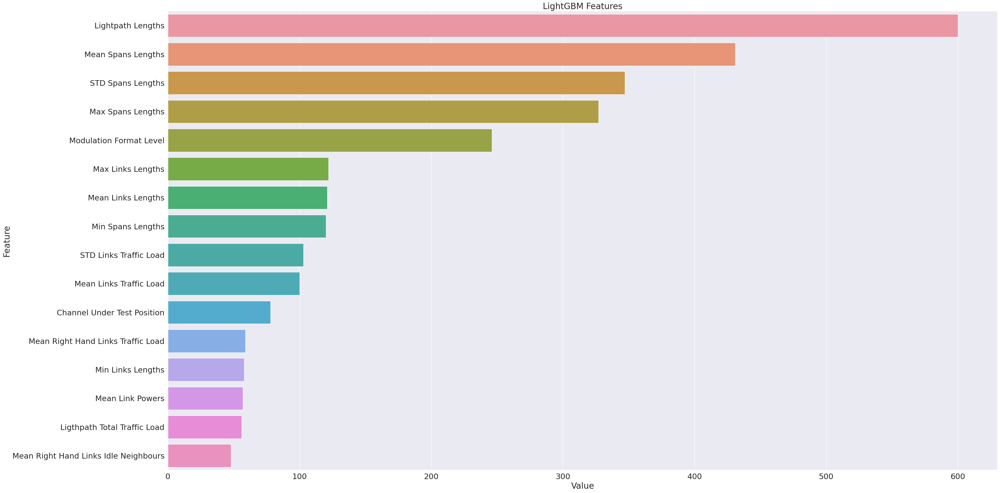

['Lightpath Lengths' 'Mean Spans Lengths' 'STD Spans Lengths'
 'Max Spans Lengths' 'Modulation Format Level' 'Max Links Lengths'
 'Mean Links Lengths' 'Min Spans Lengths' 'STD Links Traffic Load'
 'Mean Links Traffic Load' 'Channel Under Test Position'
 'Mean Right Hand Links Traffic Load' 'Min Links Lengths'
 'Mean Link Powers' 'Ligthpath Total Traffic Load'
 'Mean Right Hand Links Idle Neighbours']


In [ ]:
num=16
def plotImp(model=lgb, X=X , num = num, fig_size = (40, 20)):
    feature_imp = pd.DataFrame({'Value':model.feature_importances_,'Feature':X_train.columns.tolist()})
    plt.figure(figsize=fig_size)
    sns.set(font_scale = 2)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                        ascending=False)[0:num])
    plt.title('LightGBM Features')
    plt.tight_layout()
    plt.savefig('lgbm_importances-01.png')
    plt.show()

plotImp()
feature_imp = pd.DataFrame({'Value':lgb.feature_importances_,'Feature':X_train.columns.tolist()})
data=feature_imp.sort_values(by="Value", ascending=False)
sorted_df = data.reset_index(drop=True)
selected = sorted_df['Feature'].iloc[:num].to_numpy()
print(selected)

In [ ]:
sf_lgb=['Lightpath Lengths', 'Mean Spans Lengths', 'STD Spans Lengths', 'Max Spans Lengths', 'Modulation Format Level', 'Max Links Lengths',
        'Mean Links Lengths', 'Min Spans Lengths', 'STD Links Traffic Load', 'Mean Links Traffic Load', 'Channel Under Test Position',
        'Mean Right Hand Links Traffic Load', 'Min Links Lengths', 'Mean Link Powers', 'Ligthpath Total Traffic Load', 'Mean Right Hand Links Idle Neighbours']
train_selected_features_with_hypertuning(sf_lgb,f'LGB FS',model='lgb')

get_results()

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warnin

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CORRECT fs for LGB,0.278,0.204,0.998,16,0.622253,1.805,14.193,0.639,4823
1,CORRECT fs for LGB,0.278,0.204,0.998,16,0.571223,1.798,17.038,0.651,4823
2,PowerShap for LGB,0.274,0.200,0.998,13,0.491190,0.795,7.189,0.587,5024
3,CORRECT fs for LGB,0.278,0.204,0.998,16,0.917103,1.905,13.224,0.651,4823
4,PowerShap for LGB,0.274,0.200,0.998,13,0.489763,0.795,6.408,0.587,5024
5,PowerShap for LGB,0.274,0.202,0.998,13,0.477296,1.761,17.746,0.648,4704
6,LGB FS,0.278,0.204,0.998,16,0.591343,1.849,13.804,0.660,4823
7,LGB FS,0.278,0.204,0.998,16,0.593689,1.826,15.794,0.655,4823


In [ ]:
lgb_params=	{'lambda_l1': 0.2, 'lambda_l2': 0.1, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_samples': 15, 'n_estimators': 500, 'num_leaves': 15,'verbosity':-1}

sf_lgb=['Lightpath Lengths', 'Mean Spans Lengths', 'STD Spans Lengths', 'Max Spans Lengths', 'Modulation Format Level', 'Max Links Lengths',
        'Mean Links Lengths', 'Min Spans Lengths', 'STD Links Traffic Load', 'Mean Links Traffic Load', 'Channel Under Test Position',
        'Mean Right Hand Links Traffic Load', 'Min Links Lengths', 'Mean Link Powers', 'Ligthpath Total Traffic Load', 'Mean Right Hand Links Idle Neighbours']
train_prepared_model(sf_lgb,lgb_params,'lgb',f'CORRECT fs for LGB')
get_results()

Total number of splits: 4823


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CORRECT fs for LGB,0.278,0.204,0.998,16,0.622253,1.805,14.193,0.639,4823
1,CORRECT fs for LGB,0.278,0.204,0.998,16,0.571223,1.798,17.038,0.651,4823
2,PowerShap for LGB,0.274,0.200,0.998,13,0.491190,0.795,7.189,0.587,5024
3,CORRECT fs for LGB,0.278,0.204,0.998,16,0.917103,1.905,13.224,0.651,4823
4,PowerShap for LGB,0.274,0.200,0.998,13,0.489763,0.795,6.408,0.587,5024
5,PowerShap for LGB,0.274,0.202,0.998,13,0.477296,1.761,17.746,0.648,4704
6,LGB FS,0.278,0.204,0.998,16,0.591343,1.849,13.804,0.660,4823
7,LGB FS,0.278,0.204,0.998,16,0.593689,1.826,15.794,0.655,4823
8,CORRECT fs for LGB,0.278,0.204,0.998,16,0.605203,1.775,16.699,0.663,4823
9,CORRECT fs for LGB,0.288,0.214,0.998,16,0.546494,1.735,14.251,0.650,6529


##**Method 4: Top K according to Shap Values**

In [ ]:
feature_importance = np.abs(shap_values).mean(axis=0)

# Select top-k features
k = 9
top_k_indices = np.argsort(feature_importance)[-k:]
selected_features = X_train.columns[top_k_indices]

train_selected_features(selected_features,f'Top K={k}',model=feature_selection_type)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1643
[LightGBM] [Info] Number of data points in the train set: 7675, number of used features: 9
[LightGBM] [Info] Start training from score 15.589584


,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms)
0,XGB Regressor,0.307,0.227,0.997,47,9.946146,4.217,88.905,0.533
1,XGB after tuning,0.307,0.224,0.997,47,17.582744,0.733,10.368,0.631
2,GB Regressor,0.345,0.260,0.997,47,6.429242,0.165,1.174,0.141
3,GB Regressor with tuning,0.303,0.222,0.998,47,20.130394,0.664,6.365,0.357
4,HGB Regressor,0.293,0.217,0.998,47,1.019729,1.807,1250.407,1.451
5,HGB with tuning,0.289,0.215,0.998,47,6.831256,7.262,1410.803,5.418
6,LGB Regressor,0.295,0.218,0.998,47,1.032871,0.643,3.348,0.537
7,CAT Boost Regressor,0.279,0.204,0.998,47,11.483410,0.604,3.058,0.471
8,Feature Selection method: Another RFA,0.293,0.212,0.998,11,23.686383,1.324,40.682,0.632
9,Feature Selection method: Another RFA,0.293,0.212,0.998,11,6.621957,0.733,9.622,0.625


##**Method 5: RFECV** (not shap related)

* ShapRFECV not supported for regression

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline

In [ ]:
model = XGBRegressor(learning_rate=0.1, subsample=0.3, n_estimators=500)
rfecv = RFECV(estimator=model)

pipeline = Pipeline(steps=[('s',rfecv),('m',model)])
pipeline.fit(X_train, y_train)

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

print(selected_features)
train_selected_features(selected_features,f'RFECV')


In [ ]:
import matplotlib.pyplot as plt

n_scores = len(rfecv.cv_results_["mean_test_score"])
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test score")
plt.errorbar(
    range(1, n_scores + 1),
    rfecv.cv_results_["mean_test_score"],
    yerr=rfecv.cv_results_["std_test_score"],
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()
rfecv.cv_results_

###**SHAPRFECV** ValueError: continuous format is not supported


In [ ]:
!pip install probatus
from probatus.feature_elimination import ShapRFECV


In [ ]:
shap_elimination = ShapRFECV(
    clf=xgb, step=0.2, cv=5,  n_jobs=3)
report = shap_elimination.fit_compute(X_train, y_train)
# Make plots
performance_plot = shap_elimination.plot()

# Get final feature set
final_features_set = shap_elimination.get_reduced_features_set(num_features=3)

#**Results and Selected Features**

##**Using XGB**

In [ ]:
get_features()

,Feature_Selection_Method,Nb_Features,Selected_Features
0,PowerShap,9,"Modulation Format Level, Mean Spans Lengths, M..."
1,Boruta,13,"Modulation Format Level, Mean Spans Lengths, M..."
2,RFE,12,"Modulation Format Level, Mean Spans Lengths, M..."
3,RFA,27,"Modulation Format Level, Link Number, Mean Spa..."
4,Another RFA Approach,12,"Lightpath Lengths, Modulation Format Level, Ma..."


In [ ]:
get_results() #using XGB

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,Farhad Results,0.307000,0.224000,0.997000,47,10.737699,0.782000,37.770000,0.533000,23652
1,XGB,0.283000,0.210000,0.998000,47,4.511100,0.735000,48.804000,0.465000,5359
2,PowerShap,0.279000,0.205000,0.998000,9,1.859238,0.554000,9.433000,0.490000,3062
3,Boruta,0.280000,0.206000,0.998000,13,2.775791,0.562000,9.206000,0.492000,2794
4,RFE,0.278000,0.205000,0.998000,12,4.405652,0.556000,10.319000,0.491000,4905
5,RFA,0.285000,0.209000,0.998000,27,6.251560,0.574000,5.741000,0.499000,5847
6,Another RFA Approach,0.272123,0.199291,0.998139,12,3.263840,0.701028,33.367157,0.474453,5765


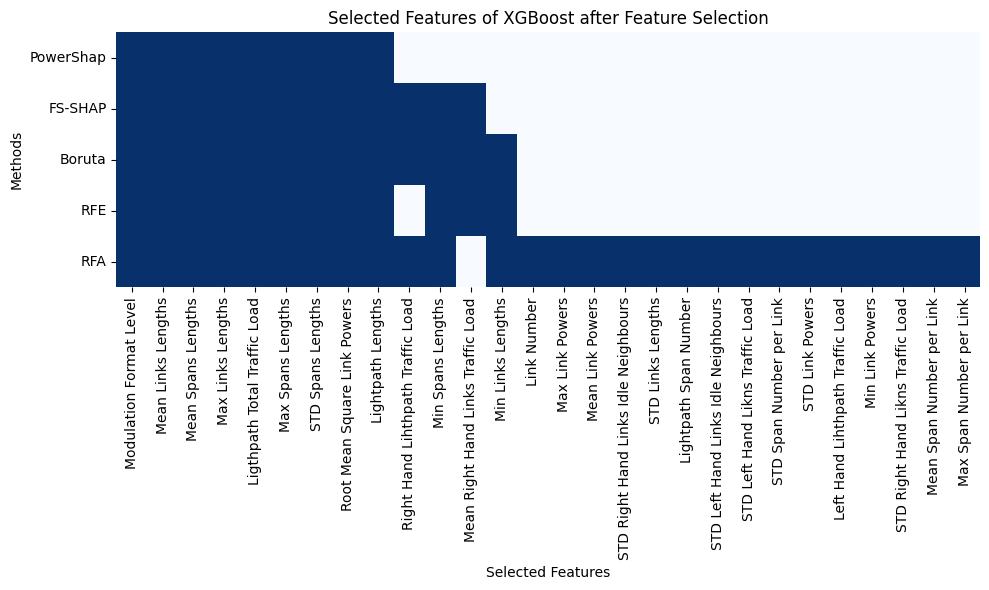

In [ ]:
features_summary('XGBoost')

##**Using LGB**

In [ ]:
get_results() #using LGBM

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,LGB Regressor,0.27700,0.203000,0.998000,47,1.345801,0.656000,3.953000,0.519000,3315
1,PowerShap for LGB,0.27400,0.200000,0.998000,13,0.445479,0.570000,1.757000,0.502000,5024
2,Boruta for LGB,0.27800,0.204000,0.998000,14,0.346987,0.585000,4.829000,0.514000,3850
3,RFE for LGB,0.27900,0.204000,0.998000,10,0.248590,0.676000,5.664000,0.510000,3576
4,RFA for LGB,0.27800,0.203000,0.998000,27,1.041929,0.582000,4.813000,0.526000,5440
5,Another RFA Approach,0.27077,0.199339,0.998113,14,0.356906,0.629671,3.464699,0.509501,3432


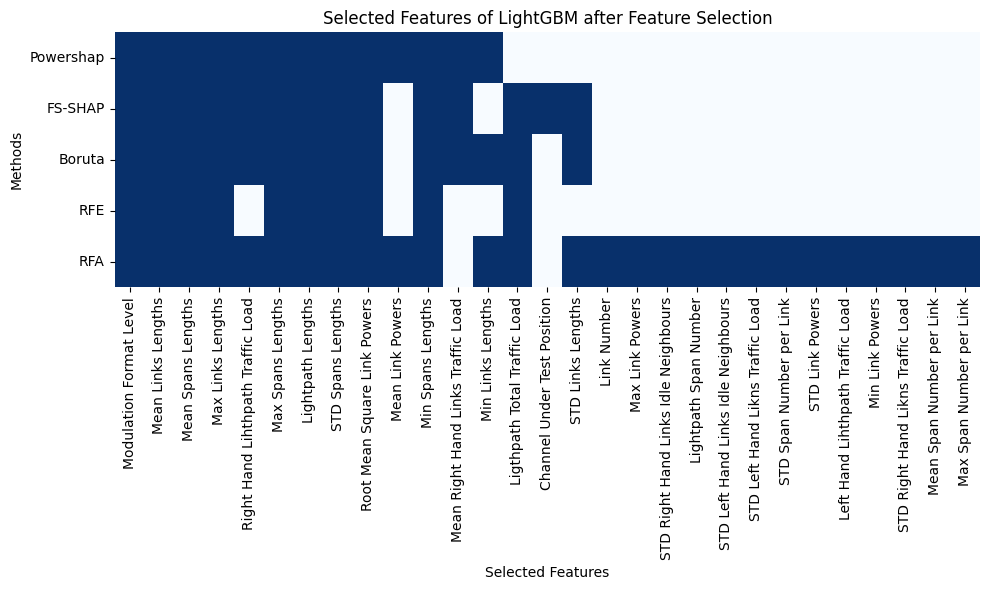

In [ ]:
features_summary('LightGBM')

##**Catboost**

In [ ]:
get_results()

,type,rmse,mae,r2,nb_features,training time (s),average inference time/data point (ms),max inference time/data point (ms),min inference time/data point (ms),nb of splits
0,CAT Boost Regressor,0.276000,0.203000,0.998000,47,7.450222,0.666000,4.6940,0.414000,6000
1,PowerShap for CatBoost,0.269000,0.198000,0.998000,19,3.736108,0.550000,6.6520,0.406000,6000
2,Another RFA Approach,0.266661,0.191693,0.998175,14,5.353924,0.557022,32.9566,0.406981,6000


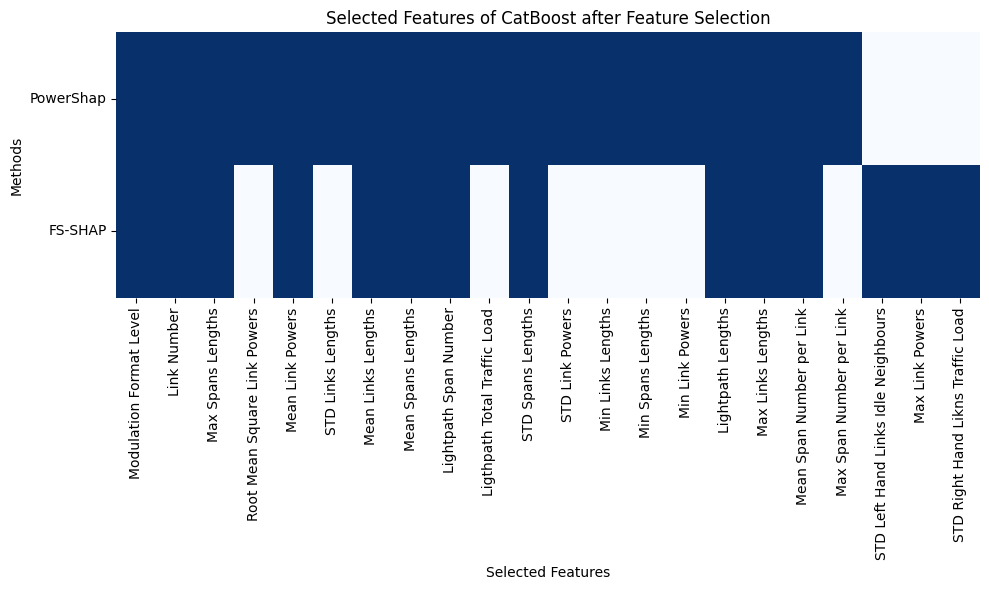

In [ ]:
features_summary('CatBoost')

##**Comparison of Boosting Models**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(11, 5))

ax = sns.lineplot(x=y_test, y=y_pred_gb,
				label='GradientBoosting')
ax1 = sns.lineplot(x=y_test, y=y_pred_xgb,
				label='XGBoost')
ax2 = sns.lineplot(x=y_test, y=y_pred_hgb,
				label='HistGBoost')
ax3 = sns.lineplot(x=y_test, y=y_pred_cb,
				label='CatBoost')
ax4 = sns.lineplot(x=y_test, y=y_pred_lgb,
				label='LightGBM')

ax.set_xlabel('y_test', color='g')
ax.set_ylabel('y_pred', color='g')


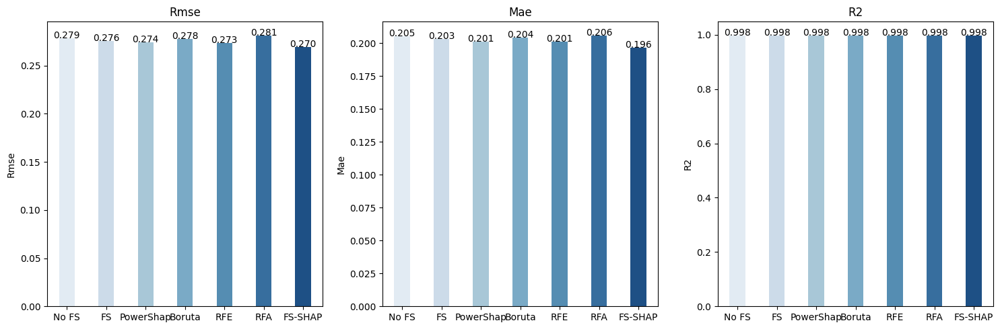

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Loop through metrics (rmse, mae, r2)
metrics = ['rmse', 'mae', 'r2']

for i, metric in enumerate(metrics):
    ax = axes[i]
    sns.barplot(data=print_results(), x='type', y=metric, ax=ax ,  palette='Blues',  ci=None, saturation=0.7, errwidth=0, capsize=0, dodge=False, width=0.4)
    ax.set_title(f'{metric.capitalize()}')
    ax.set_xlabel('')
    ax.set_ylabel(metric.capitalize())

    # Add labels above each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.3f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='baseline', fontsize=10, color='black')

plt.tight_layout()

# Show the plot
plt.show()

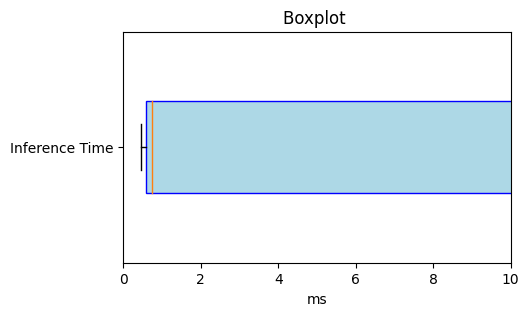

In [ ]:
import matplotlib.pyplot as plt

i=0
maximum = get_results().at[i,'max inference time/data point (ms)']
minimum = get_results().at[i,'min inference time/data point (ms)']
average = get_results().at[i,'average inference time/data point (ms)']

plt.figure(figsize=(5, 3))
plt.boxplot([maximum, minimum, average], vert=False, widths=0.4, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'))
plt.yticks([1], ['Inference Time'])
plt.xlabel('ms')
plt.title('Boxplot ')
plt.xlim(0, 10)

plt.show()


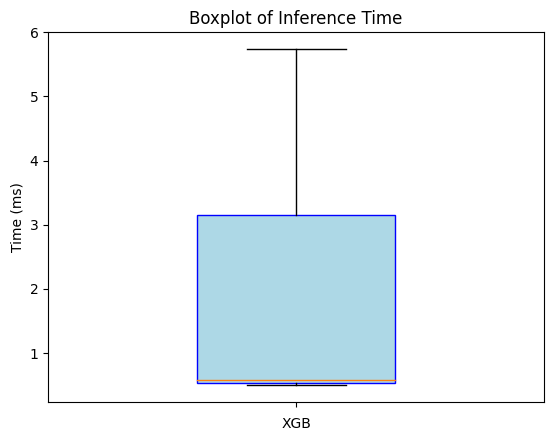

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'df' with a column 'exam_scores'
# Example data
data = get_results()['RFA']

# Create a boxplot
plt.boxplot(data,widths=0.4, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'))

# Add labels and title
plt.xlabel('XGB')
plt.ylabel('Time (ms)')
plt.xticks([1], [''])

plt.title('Boxplot of Inference Time')

# Show the plot
plt.show()

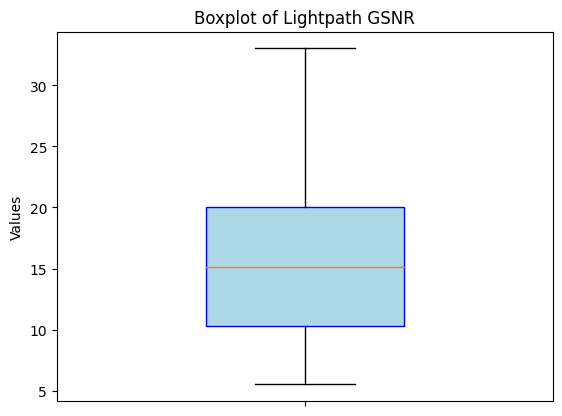

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'df' with a column 'exam_scores'
# Example data
# data = get_results()['average inference time/data point (ms)']

# Create a boxplot
plt.boxplot(df['Lightpath GSNR'],widths=0.4, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'))

# Add labels and title
# plt.xlabel('XGB')
plt.ylabel('Values')
plt.xticks([1], [''])

plt.title('Boxplot of Lightpath GSNR')

# Show the plot
plt.show()

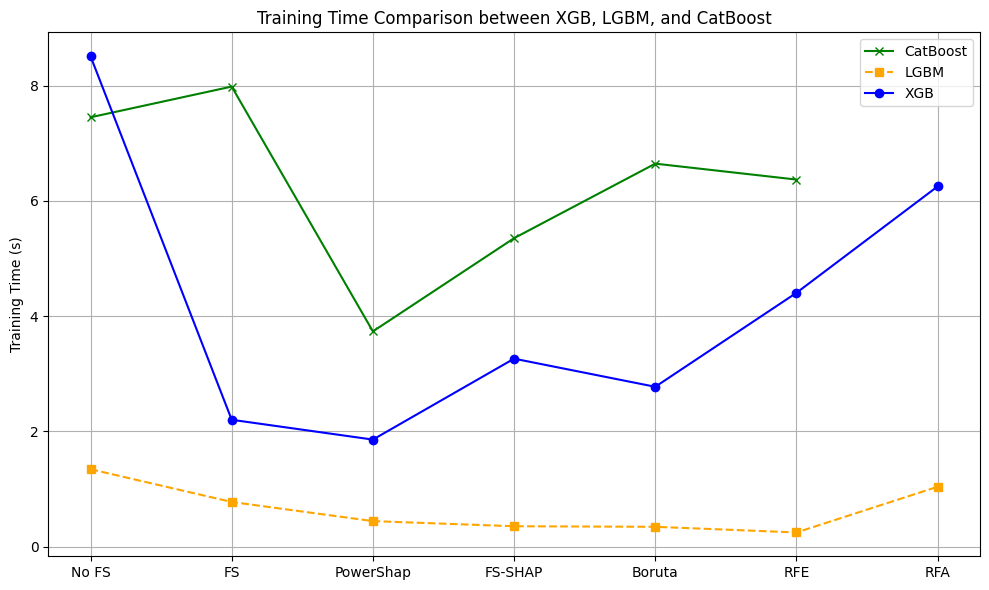

In [ ]:

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
pr= print_results()
pr
grouped = pr.groupby('model')
markers = {
    'XGB':'o', 'LGBM':'s','CatBoost':'x'
}
lines = {
    'XGB':'-', 'LGBM':'--','CatBoost':'solid'
}
colors = {
    'XGB': 'blue',
    'LGBM': 'orange',
    'CatBoost': 'green'
}
for name, group in grouped:
    marker = markers.get(name, 'o')
    line = lines.get(name, '-')
    color = colors.get(name, 'black')  # Default to black if model type is not in colors
    plt.plot(group['type'], group['training time (s)'], label=name, marker=marker,linestyle=line,color=color)


plt.title('Training Time Comparison between XGB, LGBM, and CatBoost')
plt.xlabel('')
plt.ylabel('Training Time (s)')
plt.grid(True)
plt.legend()
plt.tight_layout()


# Show the graph
plt.show()

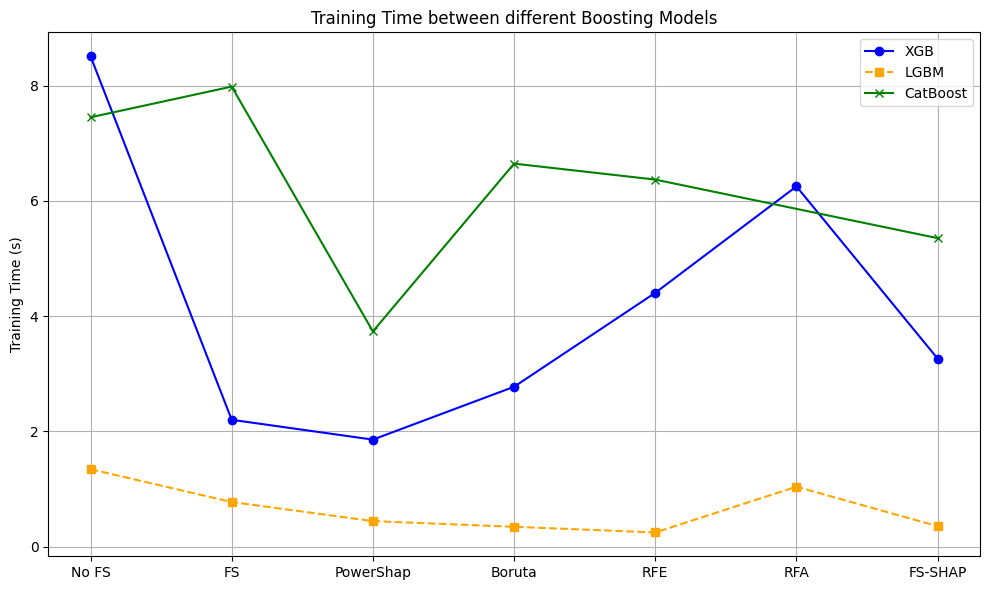

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
xgb = get_results('xgb_results.csv')
lgb = get_results('lgb_results.csv')
cb = get_results('cb_results.csv')

metric = 'training time (s)'

plt.plot(xgb['type'], xgb[metric], marker='o', linestyle='-',label='XGB',color='blue')
plt.plot(lgb['type'], lgb[metric], marker='s', linestyle='dashed',label='LGBM',color='orange')
plt.plot(cb['type'], cb[metric], marker='x', linestyle='solid',label='CatBoost',color='green')


plt.title('Training Time between different Boosting Models')
plt.xlabel('')
plt.ylabel('Training Time (s)')
plt.grid(True)
# y_ticks = np.arange(0, max(print_results('model_results.csv')['rmse']), 0.2)
# plt.yticks(y_ticks)
plt.legend()

plt.tight_layout()

# Show the graph
plt.show()

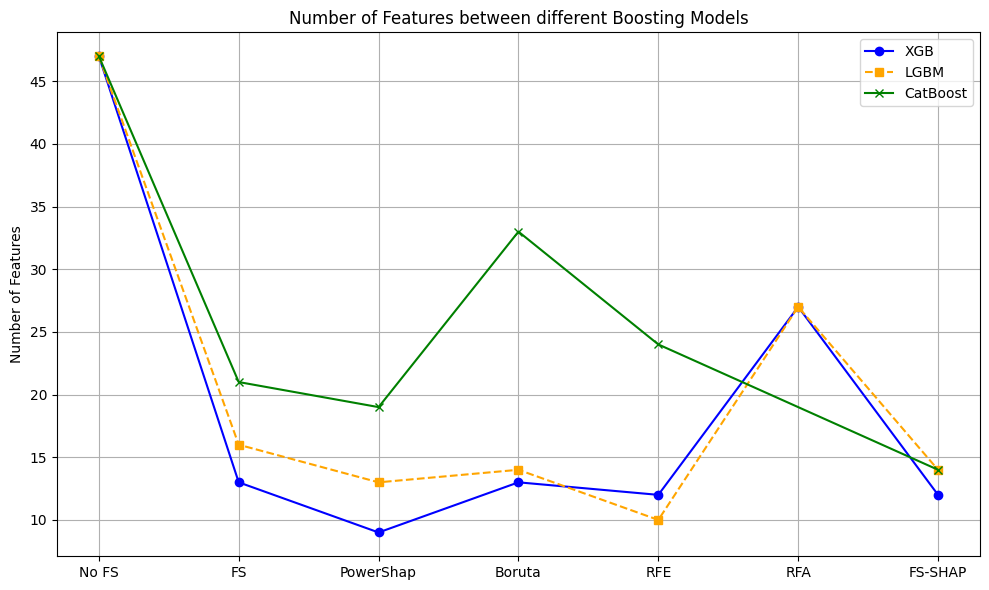

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
xgb = get_results('xgb_results.csv')
lgb = get_results('lgb_results.csv')
cb = get_results('cb_results.csv')

metric = 'nb_features'

plt.plot(xgb['type'], xgb[metric], marker='o', linestyle='-',label='XGB',color='blue')
plt.plot(lgb['type'], lgb[metric], marker='s', linestyle='dashed',label='LGBM',color='orange')
plt.plot(cb['type'], cb[metric], marker='x', linestyle='solid',label='CatBoost',color='green')


plt.title('Number of Features between different Boosting Models')
plt.xlabel('')
plt.ylabel('Number of Features')
plt.grid(True)
# y_ticks = np.arange(0, max(print_results('model_results.csv')['rmse']), 0.2)
# plt.yticks(y_ticks)
plt.legend()

plt.tight_layout()

# Show the graph
plt.show()

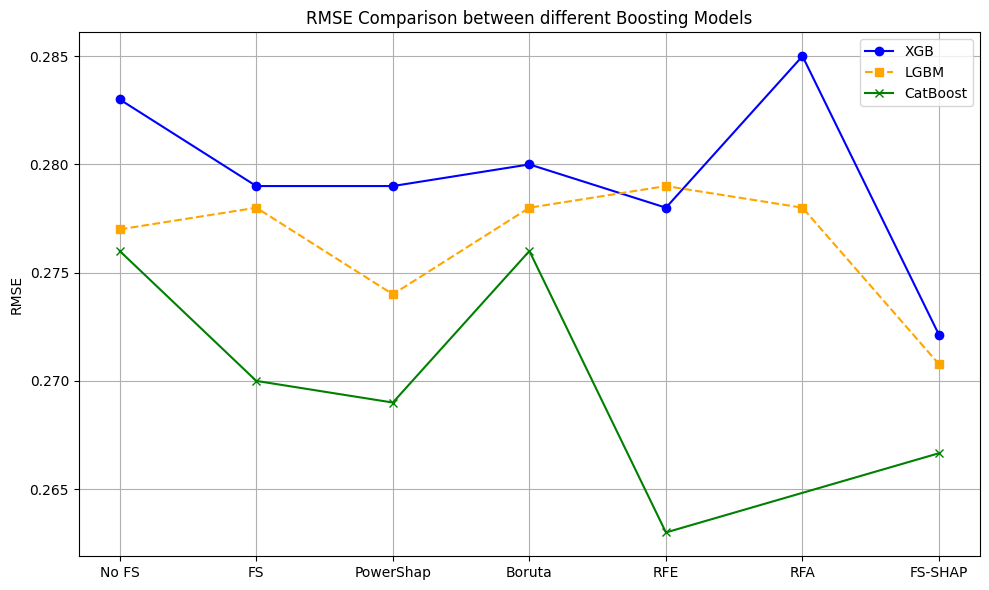

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
xgb = get_results('xgb_results.csv')
lgb = get_results('lgb_results.csv')
cb = get_results('cb_results.csv')

metric = 'rmse'

plt.plot(xgb['type'], xgb[metric], marker='o', linestyle='-',label='XGB',color='blue')
plt.plot(lgb['type'], lgb[metric], marker='s', linestyle='dashed',label='LGBM',color='orange')
plt.plot(cb['type'], cb[metric], marker='x', linestyle='solid',label='CatBoost',color='green')


plt.title('RMSE Comparison between different Boosting Models')
plt.xlabel('')
plt.ylabel('RMSE')
plt.grid(True)

plt.legend()

plt.tight_layout()

# Show the graph
plt.show()

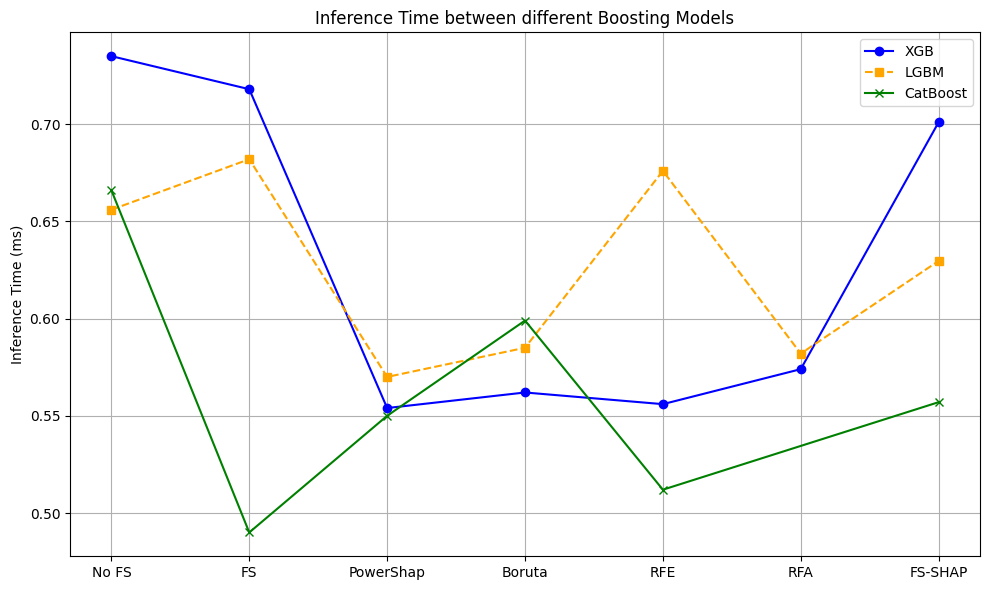

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
xgb = get_results('xgb_results.csv')
lgb = get_results('lgb_results.csv')
cb = get_results('cb_results.csv')

metric = 'average inference time/data point (ms)'

plt.plot(xgb['type'], xgb[metric], marker='o', linestyle='-',label='XGB',color='blue')
plt.plot(lgb['type'], lgb[metric], marker='s', linestyle='dashed',label='LGBM',color='orange')
plt.plot(cb['type'], cb[metric], marker='x', linestyle='solid',label='CatBoost',color='green')


plt.title('Inference Time between different Boosting Models')
plt.xlabel('')
plt.ylabel('Inference Time (ms)')
plt.grid(True)

plt.legend()

plt.tight_layout()

# Show the graph
plt.show()

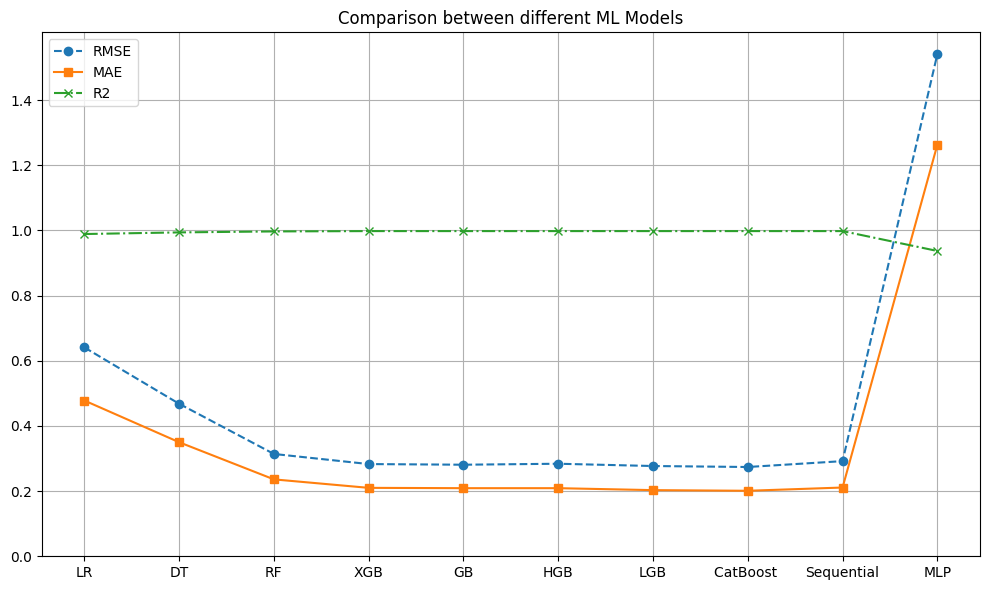

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(print_results('model_results.csv')['type'], print_results('model_results.csv')['rmse'], marker='o', linestyle='dashed',label='RMSE')
plt.plot(print_results('model_results.csv')['type'], print_results('model_results.csv')['mae'], marker='s', linestyle='-',label='MAE')
plt.plot(print_results('model_results.csv')['type'], print_results('model_results.csv')['r2'], marker='x', linestyle='dashdot',label='R2')


plt.title('Comparison between different ML Models')
plt.xlabel('')
plt.ylabel('')
plt.grid(True)
y_ticks = np.arange(0, max(print_results('model_results.csv')['rmse']), 0.2)
plt.yticks(y_ticks)
plt.legend()

plt.tight_layout()

# Show the graph
plt.show()

#**Summary Plots**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_excel("results.xlsx")


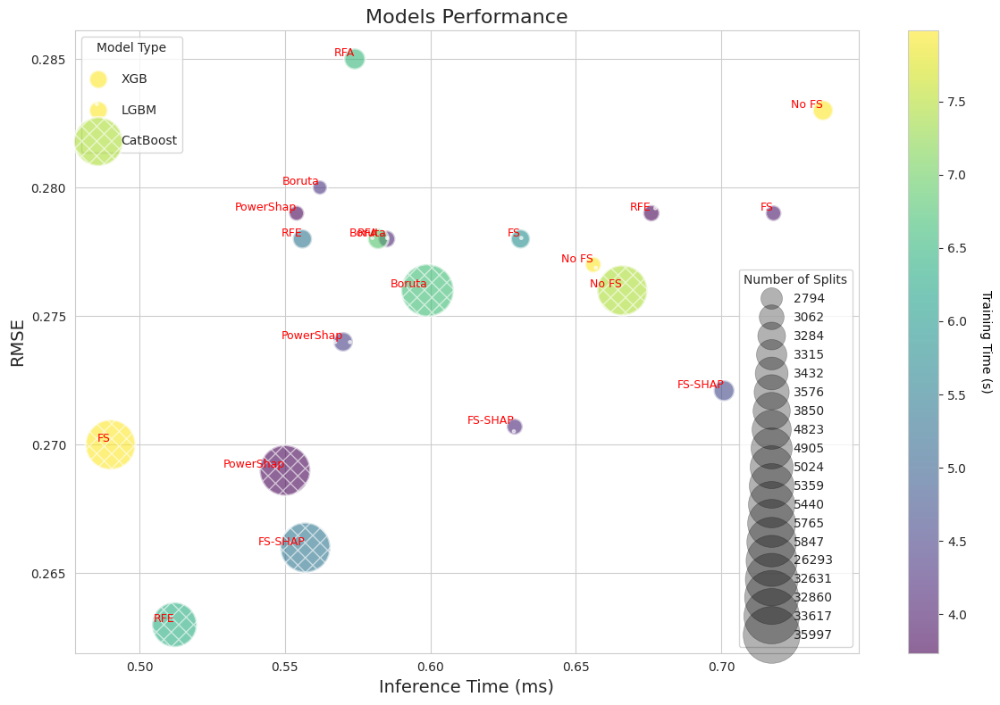

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

hatch_patterns = {
    "XGB": None,       # No hatching
    "LGBM": ".",      # Diagonal hatching
    "CatBoost": "xx"   # Cross hatching
}

# Create the scatter plot with distinct hatch patterns for each model type
plt.figure(figsize=(12, 8))

# Plot data points for each model with its corresponding hatch pattern
for model, hatch in hatch_patterns.items():
    subset = data[data['Unnamed: 0'] == model]
    plt.scatter(subset['average inference time (ms)'], subset['rmse'],
                c=subset['training time (s)'],
                s=subset['nb of splits']/20, # Scale the size of circles
                cmap='viridis',
                alpha=0.6,
                edgecolors="w",
                linewidth=2,
                marker="o",
                label=model,
                hatch=hatch)

# Create the colorbar for training time
cbar = plt.colorbar()
cbar.set_label('Training Time (s)', rotation=270, labelpad=20,color='black')

# Setting the title and labels
plt.title('Models Performance', fontsize=16)
plt.xlabel('Inference Time (ms)', fontsize=14)
plt.ylabel('RMSE', fontsize=14)
# Annotate each point with the corresponding feature selection type
for i, txt in enumerate(data['type']):
    plt.annotate(txt, (data['average inference time (ms)'].iloc[i], data['rmse'].iloc[i]), color='red',
                 fontsize=9, alpha=1, ha='right', va='bottom')

# Create legend for sizes (number of splits)
sizes = data['nb of splits'].unique()
sizes_sorted = sorted(sizes)
labels = [str(s) for s in sizes_sorted]
legend1 = plt.legend(handles=scatter.legend_elements("sizes", num=len(sizes_sorted))[0],
                     title="Number of Splits",
                     labels=labels,
                     loc="lower right")

# Add legend for model types
plt.legend(title="Model Type", loc="upper left",labelspacing=1.5)

plt.gca().add_artist(legend1)




plt.tight_layout()
plt.show()


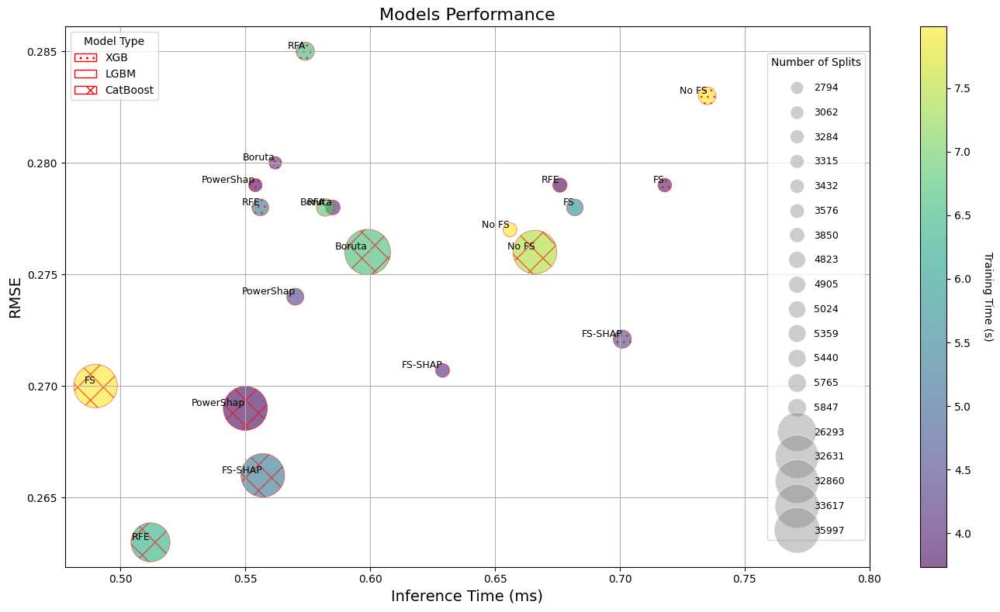

In [242]:
from matplotlib.patches import Ellipse
import math
factor=20
hatch_patterns = {
    "XGB": '..',       # No hatching
    "LGBM": None,      # Diagonal hatching
    "CatBoost": "x"   # Cross hatching
}
# Create the scatter plot with distinct hatch patterns for each model type
plt.figure(figsize=(14, 8))

# Plot data points for each model with its corresponding hatch pattern
for model, hatch in hatch_patterns.items():
    subset = data[data['model'] == model]
    scatter=plt.scatter(subset['average inference time (ms)'], subset['rmse'],
                c=subset['training time (s)'],
                s=subset['nb of splits']/factor, # Adjusted scale for size of circles
                cmap='viridis',
                alpha=0.6,
                edgecolors="r",
                linewidth=0.5,
                marker="o",
                hatch=hatch)

# Create the colorbar for training time
cbar = plt.colorbar()
cbar.set_label('Training Time (s)', rotation=270, labelpad=20, color='black')
plt.xlim(right=0.8)

# Setting the title and labels
plt.title('Models Performance', fontsize=16)
plt.xlabel('Inference Time (ms)', fontsize=14)
plt.ylabel('RMSE', fontsize=14)

sizes = data['nb of splits'].unique()
sizes_sorted = sorted(sizes)
labels = [str(s) for s in sizes_sorted]

# Annotate each point with the corresponding feature selection type
for i, txt in enumerate(data['type']):
    plt.annotate(txt, (data['average inference time (ms)'].iloc[i], data['rmse'].iloc[i]), color='black',
                 fontsize=9, alpha=1, ha='right', va='bottom')

# Create circular patches with hatch patterns for the "Model Type" legend
legend_handles = [Ellipse((0, 0), width=1, height=1, facecolor='w', edgecolor='r', hatch=hatch, label=model)
                  for model, hatch in hatch_patterns.items()]

legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label,alpha=0.4,
                              markersize=math.sqrt(size/factor), markerfacecolor='gray') for size, label in zip(sizes_sorted, labels)]

# Create the adjusted legends
legend2 = plt.legend(handles=legend_elements, title="Number of Splits", fontsize=9, bbox_to_anchor=(1, 0.5), loc="center right", labelspacing=1.5)

plt.grid(True, zorder=0)
plt.gca().add_artist(legend2)
legend1 = plt.legend(handles=legend_handles, title="Model Type", loc="upper left", fontsize=10)

plt.tight_layout()
plt.show()


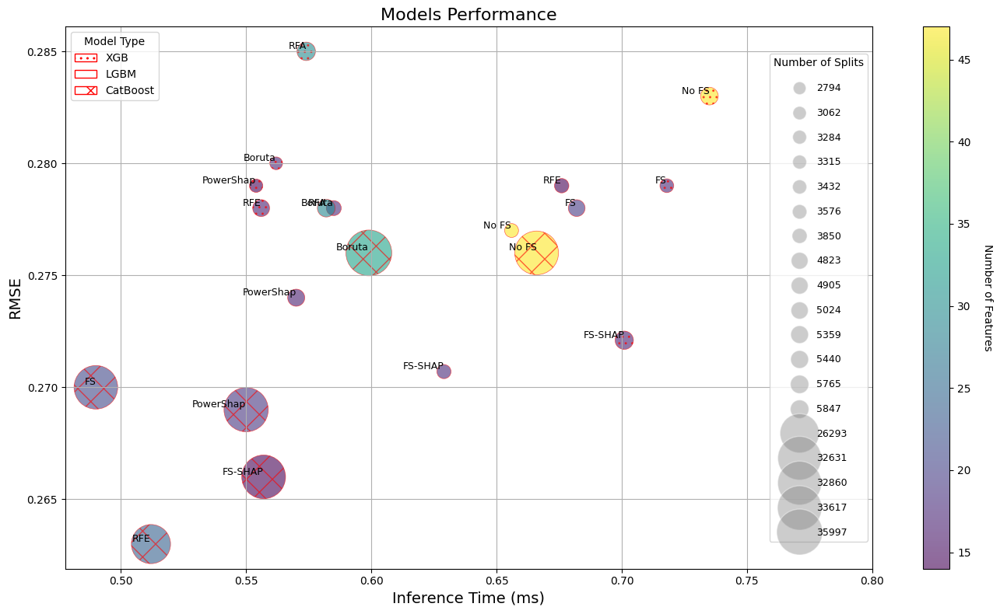

In [2]:
from matplotlib.patches import Ellipse
import math
factor=20
hatch_patterns = {
    "XGB": '..',       # No hatching
    "LGBM": None,      # Diagonal hatching
    "CatBoost": "x"   # Cross hatching
}
# Create the scatter plot with distinct hatch patterns for each model type
plt.figure(figsize=(14, 8))

# Plot data points for each model with its corresponding hatch pattern
for model, hatch in hatch_patterns.items():
    subset = data[data['model'] == model]
    scatter=plt.scatter(subset['average inference time (ms)'], subset['rmse'],
                c=subset['nb_features'],
                s=subset['nb of splits']/factor, # Adjusted scale for size of circles
                cmap='viridis',
                alpha=0.6,
                edgecolors="r",
                linewidth=0.5,
                marker="o",
                hatch=hatch)

# Create the colorbar for training time
cbar = plt.colorbar()
cbar.set_label('Number of Features', rotation=270, labelpad=20, color='black')
plt.xlim(right=0.8)

# Setting the title and labels
plt.title('Models Performance', fontsize=16)
plt.xlabel('Inference Time (ms)', fontsize=14)
plt.ylabel('RMSE', fontsize=14)

sizes = data['nb of splits'].unique()
sizes_sorted = sorted(sizes)
labels = [str(s) for s in sizes_sorted]

# Annotate each point with the corresponding feature selection type
for i, txt in enumerate(data['type']):
    plt.annotate(txt, (data['average inference time (ms)'].iloc[i], data['rmse'].iloc[i]), color='black',
                 fontsize=9, alpha=1, ha='right', va='bottom')

# Create circular patches with hatch patterns for the "Model Type" legend
legend_handles = [Ellipse((0, 0), width=1, height=1, facecolor='w', edgecolor='r', hatch=hatch, label=model)
                  for model, hatch in hatch_patterns.items()]

legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label,alpha=0.4,
                              markersize=math.sqrt(size/factor), markerfacecolor='gray') for size, label in zip(sizes_sorted, labels)]

# Create the adjusted legends
legend2 = plt.legend(handles=legend_elements, title="Number of Splits", fontsize=9, bbox_to_anchor=(1, 0.5), loc="center right", labelspacing=1.5)

plt.grid(True, zorder=0)
plt.gca().add_artist(legend2)
legend1 = plt.legend(handles=legend_handles, title="Model Type", loc="upper left", fontsize=10)

plt.tight_layout()
plt.show()


#**Selected Features**

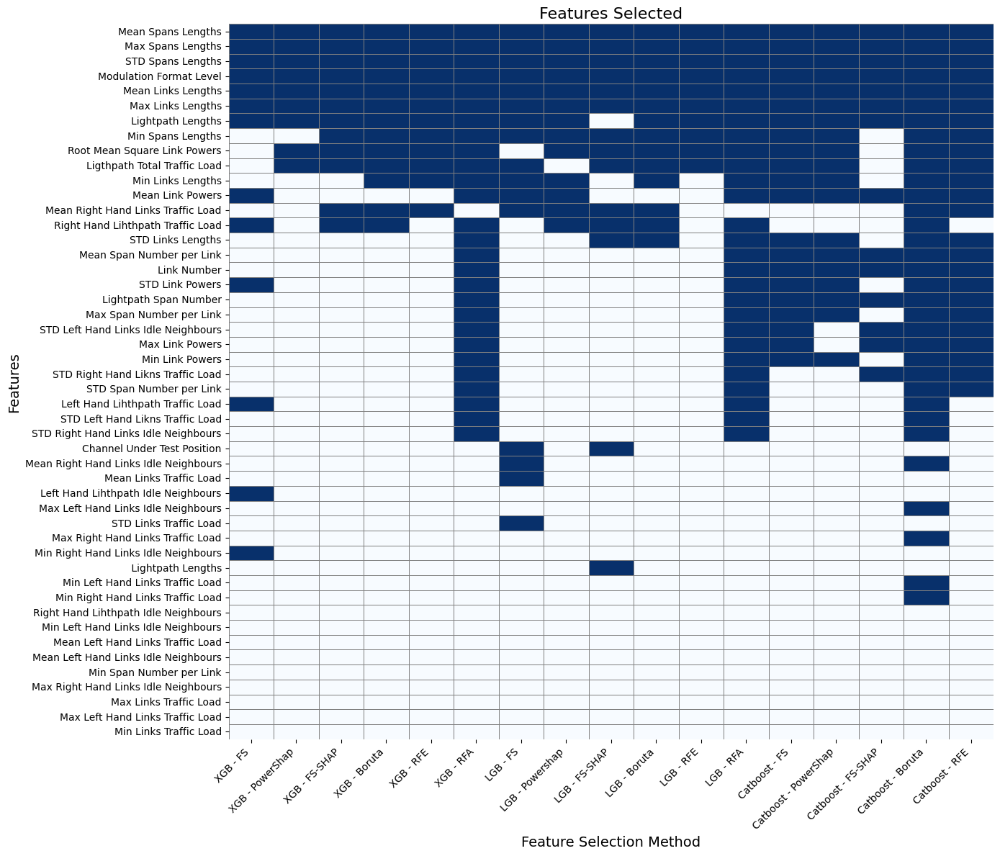

In [ ]:
# Modify the 'Feature_Selection_Method' column to include the model type
updated_features_data = pd.read_csv("selected_features.csv")
updated_features_data['Method_Type'] = updated_features_data['type'] + " - " + updated_features_data['Feature_Selection_Method']
selected_columns = df.iloc[:, :-1]

# Create a binary matrix (dataframe) with feature selection methods as columns and features as rows
updated_binary_matrix = pd.DataFrame(index=sorted(list(selected_columns)), columns=updated_features_data['Method_Type'])

# Populate the binary matrix
for index, row in updated_features_data.iterrows():
    method = row['Method_Type']
    for feature in row['Selected_Features'].split(', '):
        updated_binary_matrix.at[feature, method] = 1

# Replace NaN values with 0
updated_binary_matrix.fillna(0, inplace=True)

# Sort the features based on their selection frequency
sorted_features_updated = updated_binary_matrix.sum(axis=1).sort_values(ascending=False).index

# Reorder the binary matrix based on the sorted features
sorted_updated_binary_matrix = updated_binary_matrix.loc[sorted_features_updated]

# Create the heatmap with sorted features
plt.figure(figsize=(14, 12))
sns.heatmap(sorted_updated_binary_matrix, cmap="Blues", cbar=False, linewidths=0.5, linecolor='gray')

plt.title("Features Selected", fontsize=16)
plt.xlabel("Feature Selection Method", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
